Using baseline

In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0,"/analysis/fabiane/phd/nitorch/")
sys.path.insert(0,"/analysis/fabiane/phd/patch_individual_filters/")

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import h5py
# pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from nitorch.data import load_nifti
from nitorch.transforms import ToTensor
from pif import PatchIndividualFilters3D

/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


### Parameters

In [5]:
gpu = 4
model_dir = "/analysis/ritter/projects/Methods/Eitel_local_filter/experiments_submission/models/ADNI/full_set/baseline/"
model_path = os.path.join(model_dir,"repeat_0_cv_fold_1_BEST_ITERATION.h5")

### Model definition

In [6]:
class SixtyFourNet(nn.Module):
    def __init__(self, drp_rate=0.3, blur_kernel=None):
        super(SixtyFourNet, self).__init__()
        self.drp_rate = drp_rate
        self.dropout = nn.Dropout3d(p=self.drp_rate)
        self.Conv_1 = nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=3, stride=3, padding=0)
        self.Conv_2 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.pool_2 = nn.MaxPool3d(kernel_size=3, stride=2, padding=0)
        self.Conv_3 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.Conv_4 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.Conv_5 = nn.Conv3d(64, 36, kernel_size=3, stride=1, padding=0)
        self.pool_4 = nn.MaxPool3d(kernel_size=4, stride=2, padding=0)
        
        # 4, 64, 1, 2, 1
        self.classifier_scratch = nn.Sequential(
            #nn.Dropout(0.6),
            nn.Linear(1296, 80),
            #nn.Dropout(0.6),
            nn.Linear(80, 1)
        )

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_1(x))
        h = self.dropout(self.pool_1(x))
        x = F.elu(self.Conv_2(h))
        if print_size:
            print(x.shape)
        h = self.dropout(self.pool_2(x))
        x = F.elu(self.Conv_3(h))
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_4(x))
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_5(x))
        if print_size:
            print(x.shape)
        h = self.dropout(self.pool_4(x))
        if print_size:
            print(h.shape)
        
        return h

    def forward(self, x):
        print_size = False
        x = self.encode(x, print_size=print_size)
        x = self.flatten(x)
        x = self.classifier_scratch(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [7]:
# load pre-trained weights
net = SixtyFourNet()
net.load_state_dict(torch.load(model_path))
net = net.cuda(gpu)
net.eval()

SixtyFourNet(
  (dropout): Dropout3d(p=0.3)
  (Conv_1): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_1): MaxPool3d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  (Conv_2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_2): MaxPool3d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv_3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (Conv_4): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (Conv_5): Conv3d(64, 36, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_4): MaxPool3d(kernel_size=4, stride=2, padding=0, dilation=1, ceil_mode=False)
  (classifier_scratch): Sequential(
    (0): Linear(in_features=1296, out_features=80, bias=True)
    (1): Linear(in_features=80, out_features=1, bias=True)
  )
)

In [8]:
neuron = list(dict(net.named_children())["Conv_1"].parameters())[0][0]

# Generate feature visualization through optimization

### Create starting point

In [9]:
base = torch.rand((1, 96, 114, 96))

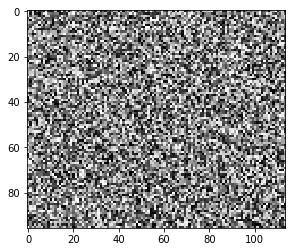

In [10]:
plt.imshow(base[0,:,:,48], cmap='gray')

In [11]:
start, end = 32, 32+5

In [12]:
val_h5 = h5py.File("/analysis/ritter/data/ADNI_HDF5/Splits_Eitel/val_AD_CN_2Yr15T_plus_UniqueScreening_quickprep_(96, 114, 96)_reducedValSize.h5", 'r')
X, y = val_h5['X'][start:end], val_h5['y'][start:end]
del val_h5

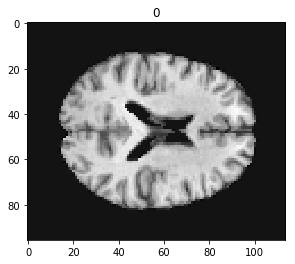

In [13]:
plt.imshow(X[0,:,:,48], cmap='gray')
plt.title(y[0])
plt.show()

In [14]:
for i, img in enumerate(X):
    X[i] = img / np.max(img) # normalize
X = torch.Tensor(X)

In [15]:
n_filters = 5

In [16]:
activation = None
class SaveActivation():
    def __init__(self, n_filters):
        self.activation = []
        self.n_filters = n_filters

    def __call__(self, module, input, output):
        print(output.data.shape)
        print(len(output.data) * self.n_filters)
        for i in range(len(output.data)):
            for j in range(self.n_filters):
                self.activation.append(output.data[i, j])
        
    def get_activation(self):
        return self.activation

In [17]:
saver = SaveActivation(n_filters)
len(saver.get_activation())

0

In [18]:
hook = net.Conv_4.register_forward_hook(saver)

In [19]:
net.forward(torch.unsqueeze(X, 1).cuda(gpu))

torch.Size([5, 64, 10, 13, 10])
25


tensor([[-2.4354],
        [-2.1844],
        [ 3.0236],
        [ 6.4123],
        [ 6.3121]], device='cuda:4', grad_fn=<AddmmBackward>)

In [20]:
len(saver.get_activation())

25

In [21]:
saver.n_filters

5

In [22]:
activation_shape = saver.get_activation()[0].shape
n_imgs = len(X)

activations = np.zeros(shape=(n_filters, )+tuple(activation_shape))
print(np.shape(activations))

for i in range(n_imgs):
    print("Next")
    for j in range(n_filters):
        activation = saver.get_activation()[(i*n_filters)+j].cpu().numpy()
        #plt.imshow(activation[:,:,5], cmap='gray')  
        #plt.show()
        activations[j] += activation

(5, 10, 13, 10)
Next
Next
Next
Next
Next


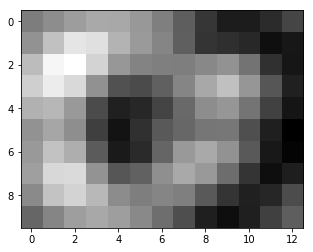

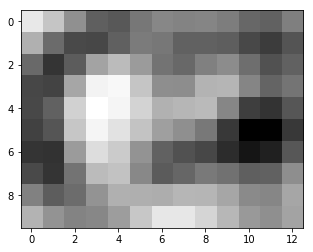

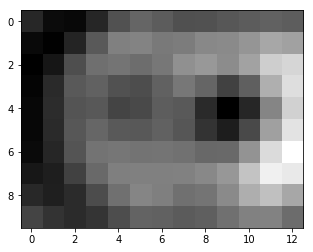

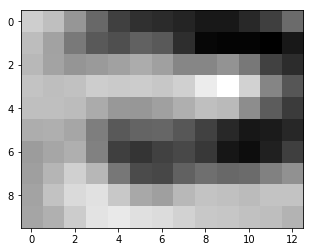

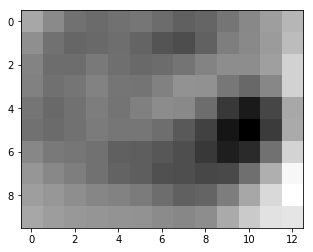

In [23]:
for activation in activations:
    plt.imshow(activation[:,:,5]/n_filters, cmap='gray')
    plt.show()

Backpropagate from feature map

In [24]:
std = torch.Tensor([0.05, 0.05, 0.05, 0.05]).repeat(4,4,1).unsqueeze(0)
gaussian_kernel = torch.normal(mean=1, std=std).unsqueeze(0)

In [25]:
gaussian_kernel.shape

torch.Size([1, 1, 4, 4, 4])

In [26]:
class SubModel(nn.Module):
    def __init__(self, drp_rate=0.3, blur_kernel=None):
        super(SubModel, self).__init__()
        self.drp_rate = drp_rate
        self.dropout = nn.Dropout3d(p=self.drp_rate)
        self.Conv_1 = nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=3, stride=3, padding=0)
        self.Conv_2 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.pool_2 = nn.MaxPool3d(kernel_size=3, stride=2, padding=0)
        self.Conv_3 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.Conv_4 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.Conv_5 = nn.Conv3d(64, 36, kernel_size=3, stride=1, padding=0)

        self.blur = blur_kernel

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_1(x))
        h = self.dropout(self.pool_1(x))
        x = F.elu(self.Conv_2(h))
        if print_size:
            print(x.shape)
        h = self.dropout(self.pool_2(x))
        x = F.elu(self.Conv_3(h))
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_4(x))
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_5(x))        
        return x

    def forward(self, x):
        print_size = False
        if self.blur is not None:
            x = F.conv3d(x, weight=self.blur.cuda(gpu), stride=1)
        x = self.encode(x, print_size=print_size)
        #x = self.flatten(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [27]:
sub_model = SubModel(blur_kernel=gaussian_kernel)

In [28]:
new_state_dict = sub_model.state_dict()
old_state_dict = net.state_dict()
for name, param in old_state_dict.items():
    if name in new_state_dict.keys():
        print(name)
        new_state_dict[name].copy_(param)

Conv_1.weight
Conv_1.bias
Conv_2.weight
Conv_2.bias
Conv_3.weight
Conv_3.bias
Conv_4.weight
Conv_4.bias
Conv_5.weight
Conv_5.bias


In [29]:
sub_model.load_state_dict(new_state_dict)

In [30]:
sub_model.cuda(gpu)
sub_model.eval()

SubModel(
  (dropout): Dropout3d(p=0.3)
  (Conv_1): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_1): MaxPool3d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  (Conv_2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_2): MaxPool3d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv_3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (Conv_4): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (Conv_5): Conv3d(64, 36, kernel_size=(3, 3, 3), stride=(1, 1, 1))
)

In [31]:
X = X.requires_grad_()

In [32]:
sub_model.zero_grad()

In [33]:
res = sub_model.forward(torch.unsqueeze(X, 1).cuda(gpu))

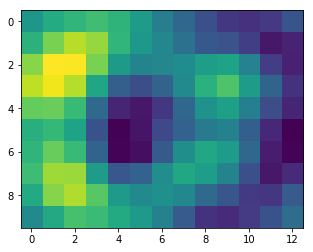

In [34]:
plt.imshow(saver.get_activation()[5].cpu().numpy()[:,:,5])
plt.show()

In [35]:
res_img = res[1].cpu().detach().numpy()

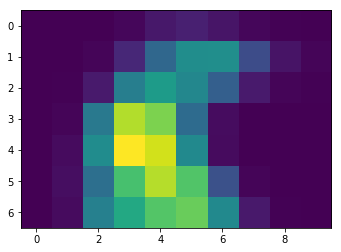

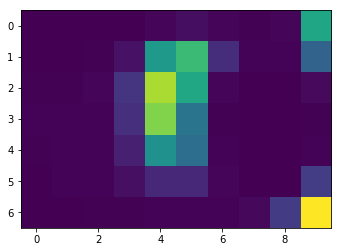

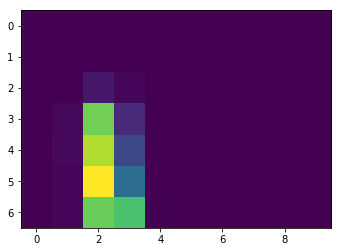

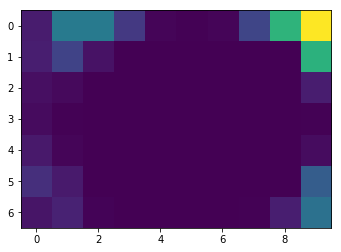

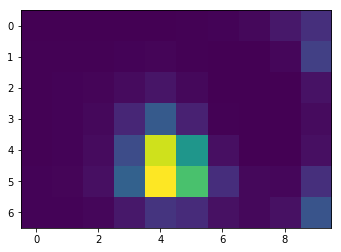

In [36]:
for filter_pos in range(5):
    plt.imshow(res_img[filter_pos][:,:,5])
    plt.show()

In [37]:
res.shape

torch.Size([5, 36, 7, 10, 7])

In [38]:
image_pos = 1
filter_pos = 20

In [39]:
grad = torch.mean(torch.abs(res[image_pos, filter_pos]))

In [40]:
grad.backward()

In [41]:
print(torch.sum(X.grad))

tensor(-1.6473)


In [42]:
print(torch.sum(X.grad))

tensor(-1.6473)


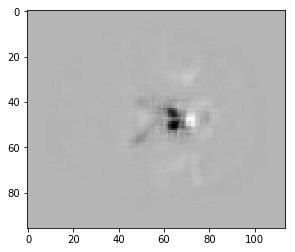

In [43]:
#for i in range(5):
plt.imshow(X.grad.cpu().numpy()[1,:,:,48], cmap='gray')
plt.show()

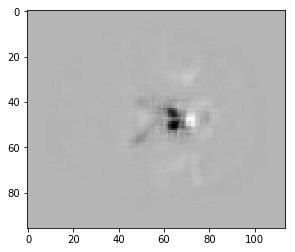

In [44]:
#for i in range(5):
plt.imshow(X.grad.cpu().numpy()[1,:,:,48], cmap='gray')
plt.show()

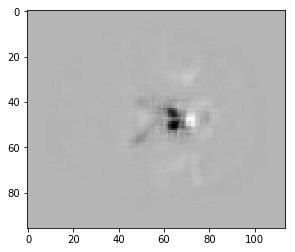

In [45]:
#for i in range(5):
plt.imshow(X.grad.cpu().numpy()[1,:,:,48], cmap='gray')
plt.show()

### Optimization loop

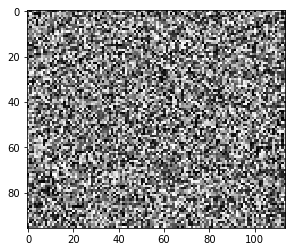

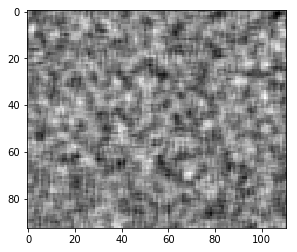

In [46]:
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

smoothed = F.conv3d(base, weight=gaussian_kernel, stride=1)
plt.imshow(smoothed.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

Iteration 0. Loss 0


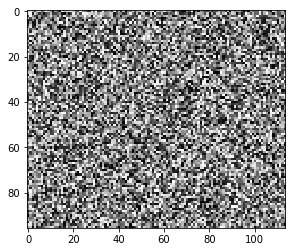

Iteration 200. Loss -478332.71875


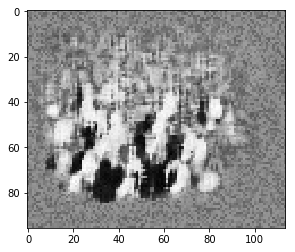

Iteration 400. Loss -1123590.0


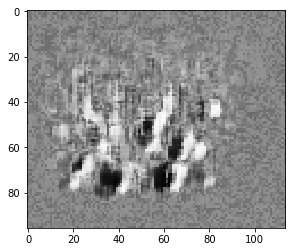

Iteration 600. Loss -1641370.625


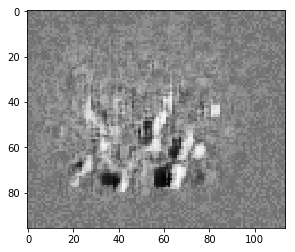

Iteration 800. Loss -2070047.0


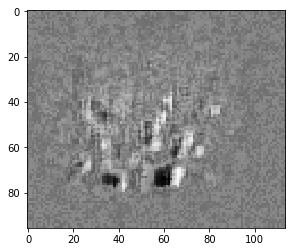

Iteration 1000. Loss -2431702.5


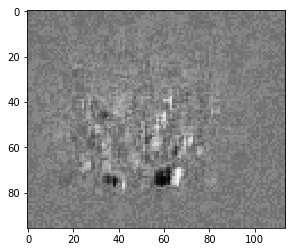

Iteration 1200. Loss -2743999.0


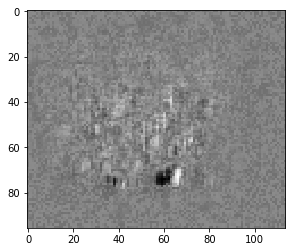

Iteration 1400. Loss -3016221.0


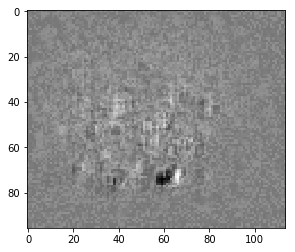

Iteration 1600. Loss -3255467.5


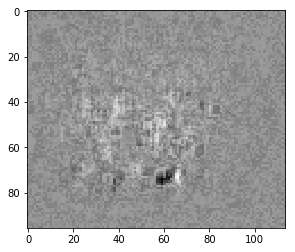

Iteration 1800. Loss -3463841.5


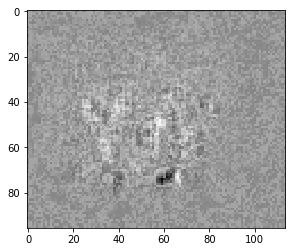

Iteration 2000. Loss -3646497.5


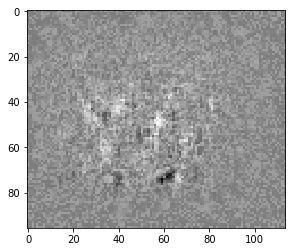

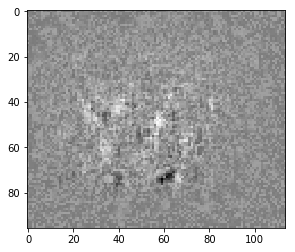

In [47]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 100
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

In [48]:
filter_pos = 10

Iteration 0. Loss 0


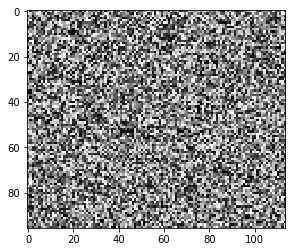

Iteration 200. Loss -633832.125


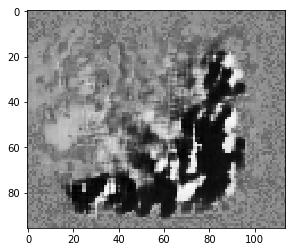

Iteration 400. Loss -1292694.25


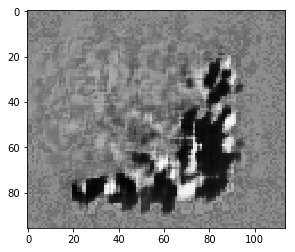

Iteration 600. Loss -1826148.125


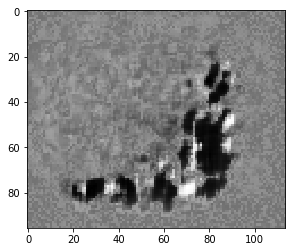

Iteration 800. Loss -2257981.5


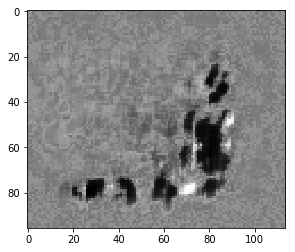

Iteration 1000. Loss -2610883.75


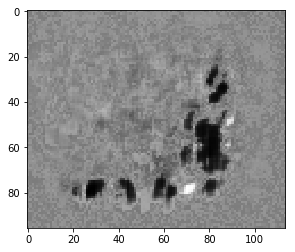

Iteration 1200. Loss -2895904.75


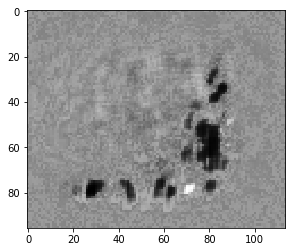

Iteration 1400. Loss -3133037.25


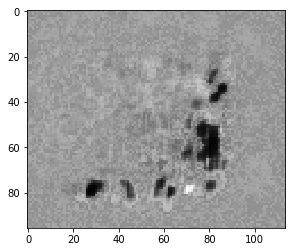

Iteration 1600. Loss -3337572.5


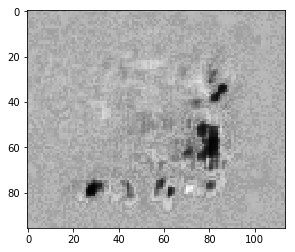

Iteration 1800. Loss -3510176.75


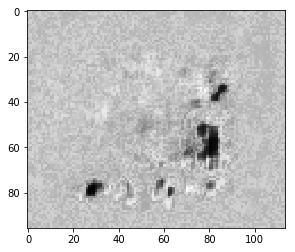

Iteration 2000. Loss -3658194.5


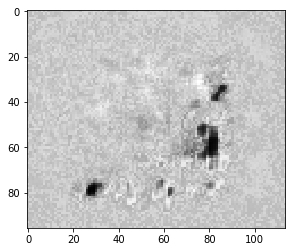

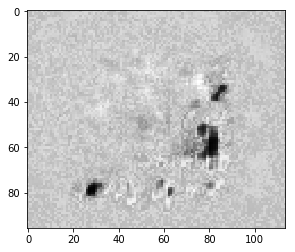

In [49]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 100
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

In [50]:
filter_pos = 34

Iteration 0. Loss 0


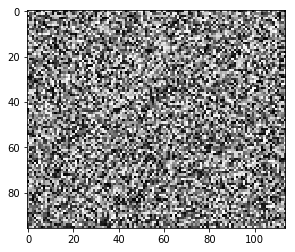

Iteration 200. Loss -459681.375


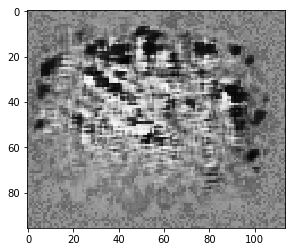

Iteration 400. Loss -904383.9375


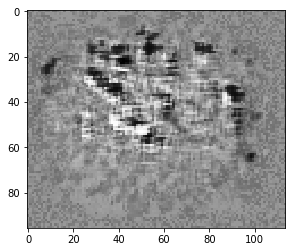

Iteration 600. Loss -1271615.5


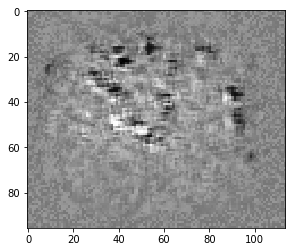

Iteration 800. Loss -1565653.625


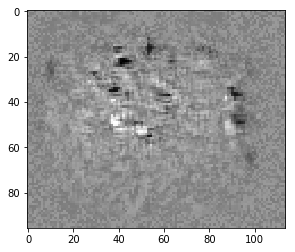

Iteration 1000. Loss -1811935.25


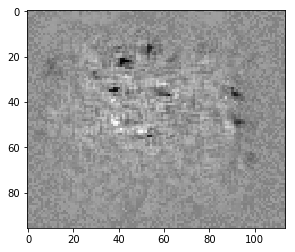

Iteration 1200. Loss -2011748.5


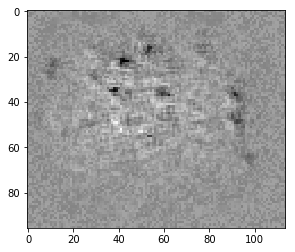

Iteration 1400. Loss -2175322.25


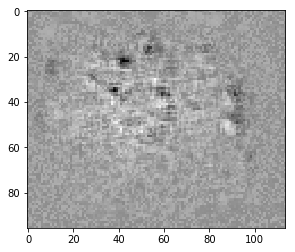

Iteration 1600. Loss -2310506.25


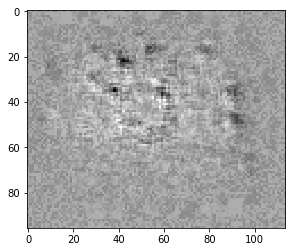

Iteration 1800. Loss -2427814.0


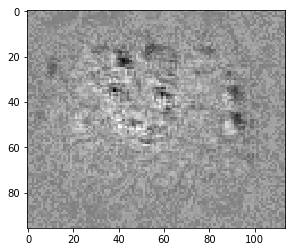

Iteration 2000. Loss -2526932.0


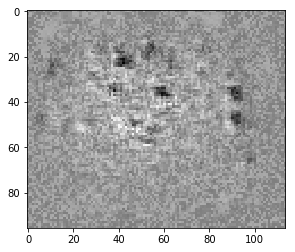

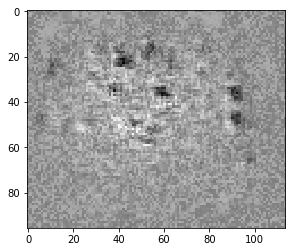

In [51]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

In [52]:
filter_pos = 35

Iteration 0. Loss 0


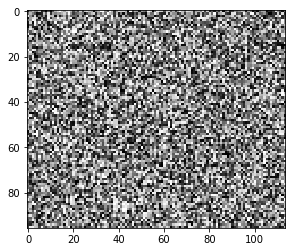

Iteration 200. Loss -480.0


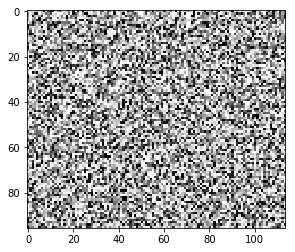

Iteration 400. Loss -480.0


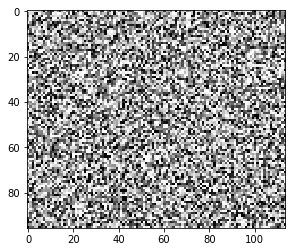

Iteration 600. Loss -480.0


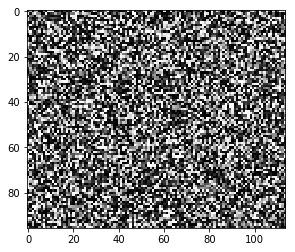

Iteration 800. Loss -480.0


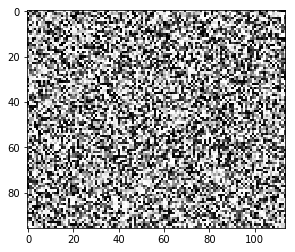

Iteration 1000. Loss -480.0


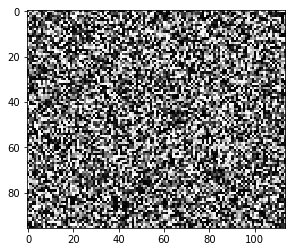

Iteration 1200. Loss -480.0


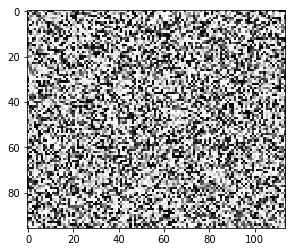

Iteration 1400. Loss -480.0


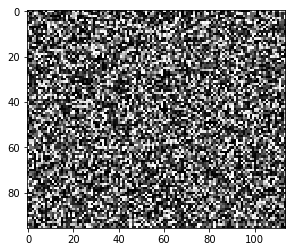

Iteration 1600. Loss -480.0


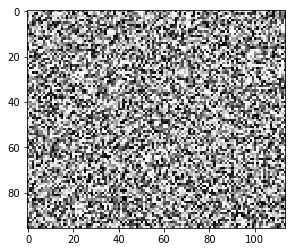

Iteration 1800. Loss -480.0


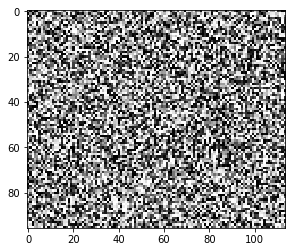

Iteration 2000. Loss -480.0


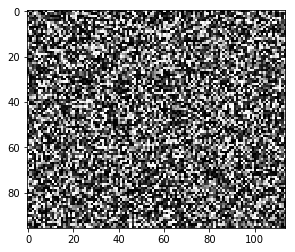

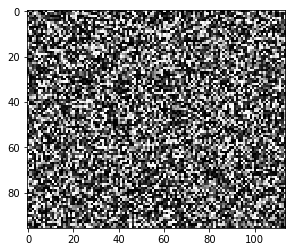

In [53]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

In [54]:
res = sub_model.forward(base.cuda(gpu))

In [55]:
torch.sum(torch.abs(res[0, filter_pos]))

tensor(490., device='cuda:4', grad_fn=<SumBackward0>)

In [56]:
torch.sum(torch.abs(res[0, filter_pos-14]))

tensor(490., device='cuda:4', grad_fn=<SumBackward0>)

In [57]:
res = sub_model.forward(torch.unsqueeze(X[[0]], 1).cuda(gpu))

In [58]:
torch.sum(torch.abs(res[0, filter_pos]))

tensor(487.9650, device='cuda:4', grad_fn=<SumBackward0>)

In [59]:
torch.sum(torch.abs(res[0, filter_pos-14]))

tensor(488.0279, device='cuda:4', grad_fn=<SumBackward0>)

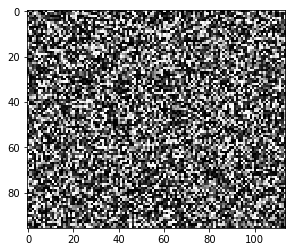

In [60]:
plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

## Using other Layer as output

In [61]:
class SubModel(nn.Module):
    def __init__(self, drp_rate=0.3, blur_kernel=None):
        super(SubModel, self).__init__()
        self.drp_rate = drp_rate
        self.dropout = nn.Dropout3d(p=self.drp_rate)
        self.Conv_1 = nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=3, stride=3, padding=0)
        self.Conv_2 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.pool_2 = nn.MaxPool3d(kernel_size=3, stride=2, padding=0)
        self.Conv_3 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)
        self.Conv_4 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)

        self.blur = blur_kernel

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_1(x))
        h = self.dropout(self.pool_1(x))
        x = F.elu(self.Conv_2(h))
        if print_size:
            print(x.shape)
        h = self.dropout(self.pool_2(x))
        x = F.elu(self.Conv_3(h))
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_4(x))      
        return x

    def forward(self, x):
        print_size = False
        if self.blur is not None:
            x = F.conv3d(x, weight=self.blur.cuda(gpu), stride=1)
        x = self.encode(x, print_size=print_size)
        #x = self.flatten(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [62]:
sub_model = SubModel(blur_kernel=gaussian_kernel)

new_state_dict = sub_model.state_dict()
old_state_dict = net.state_dict()
for name, param in old_state_dict.items():
    if name in new_state_dict.keys():
        print(name)
        new_state_dict[name].copy_(param)

sub_model.load_state_dict(new_state_dict)

sub_model.cuda(gpu)
sub_model.eval()

Conv_1.weight
Conv_1.bias
Conv_2.weight
Conv_2.bias
Conv_3.weight
Conv_3.bias
Conv_4.weight
Conv_4.bias


SubModel(
  (dropout): Dropout3d(p=0.3)
  (Conv_1): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_1): MaxPool3d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  (Conv_2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_2): MaxPool3d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv_3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (Conv_4): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
)

In [63]:
filter_pos = 1

Iteration 0. Loss 0


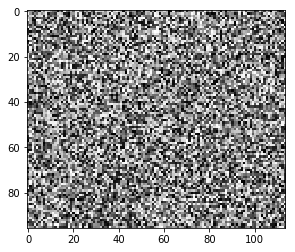

Iteration 200. Loss -3841470.25


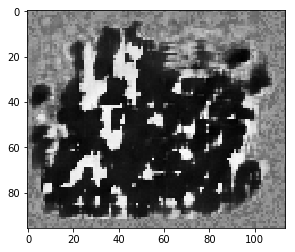

Iteration 400. Loss -8246720.5


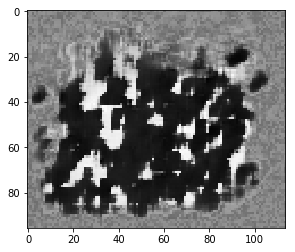

Iteration 600. Loss -12367357.0


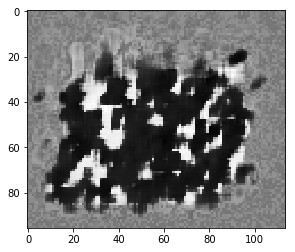

Iteration 800. Loss -16198292.0


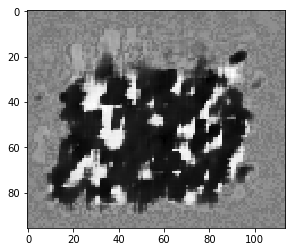

Iteration 1000. Loss -19759940.0


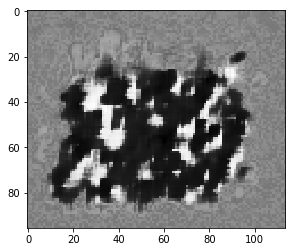

Iteration 1200. Loss -23075536.0


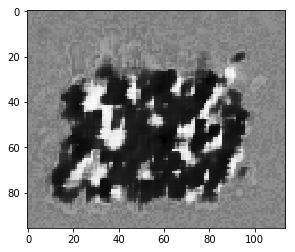

Iteration 1400. Loss -26170694.0


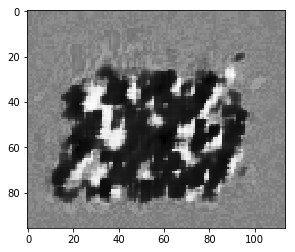

Iteration 1600. Loss -29064486.0


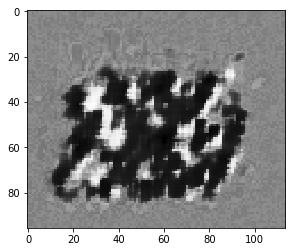

Iteration 1800. Loss -31773090.0


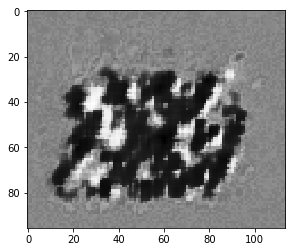

Iteration 2000. Loss -34308944.0


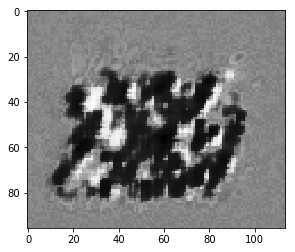

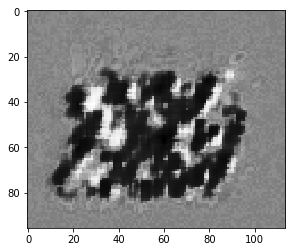

In [64]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

In [65]:
filter_pos = 2

Iteration 0. Loss 0


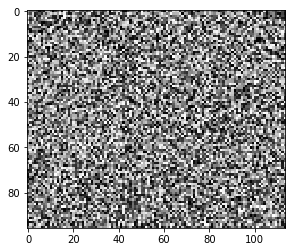

Iteration 200. Loss -673591.5


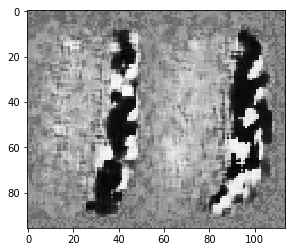

Iteration 400. Loss -1377462.5


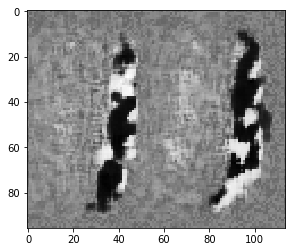

Iteration 600. Loss -1998179.125


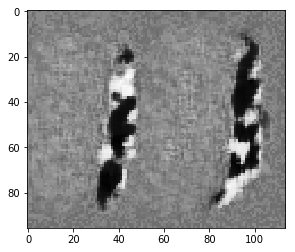

Iteration 800. Loss -2561695.0


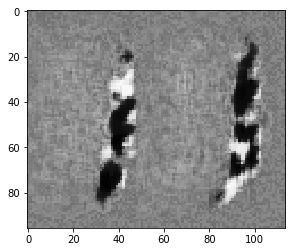

Iteration 1000. Loss -3075064.0


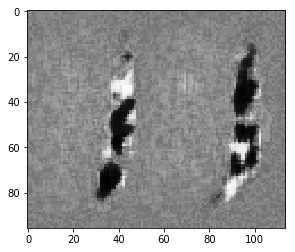

Iteration 1200. Loss -3535045.75


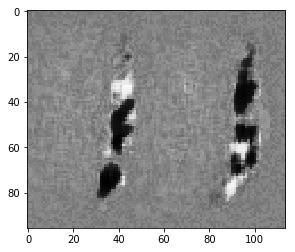

Iteration 1400. Loss -3946876.75


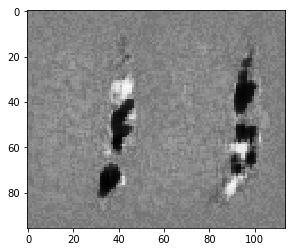

Iteration 1600. Loss -4318113.5


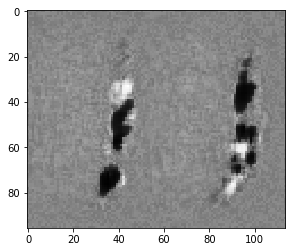

Iteration 1800. Loss -4654083.0


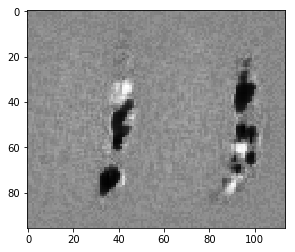

Iteration 2000. Loss -4956473.0


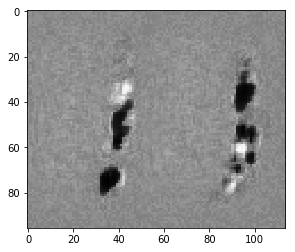

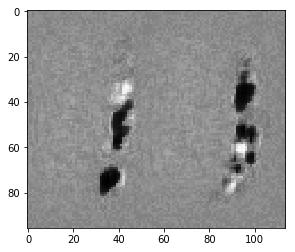

In [66]:
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True)
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)
l1_loss = nn.L1Loss(reduction='mean')
loss = 0

for i in range(num_iters + 1):
    if i % 200 == 0:
        print("Iteration {}. Loss {}".format(i, loss))
        plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
        plt.show()
    #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
    sub_model.zero_grad()
    
    res = sub_model.forward(base.cuda(gpu))
    l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
    #print(l1)
    loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
    #print(loss)
    loss.backward()
    optimizer.step()

plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
plt.show()

## Early layers

In [67]:
class SubModel(nn.Module):
    def __init__(self, drp_rate=0.3, blur_kernel=None):
        super(SubModel, self).__init__()
        self.drp_rate = drp_rate
        self.dropout = nn.Dropout3d(p=self.drp_rate)
        self.Conv_1 = nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=3, stride=3, padding=0)
        self.Conv_2 = nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=0)

        self.blur = blur_kernel

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_1(x))
        h = self.dropout(self.pool_1(x))
        x = F.elu(self.Conv_2(h))  
        return x

    def forward(self, x):
        print_size = False
        if self.blur is not None:
            x = F.conv3d(x, weight=self.blur.cuda(gpu), stride=1)
        x = self.encode(x, print_size=print_size)
        #x = self.flatten(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [68]:
sub_model = SubModel(blur_kernel=gaussian_kernel)

new_state_dict = sub_model.state_dict()
old_state_dict = net.state_dict()
for name, param in old_state_dict.items():
    if name in new_state_dict.keys():
        print(name)
        new_state_dict[name].copy_(param)

sub_model.load_state_dict(new_state_dict)

sub_model.cuda(gpu)
sub_model.eval()

Conv_1.weight
Conv_1.bias
Conv_2.weight
Conv_2.bias


SubModel(
  (dropout): Dropout3d(p=0.3)
  (Conv_1): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
  (pool_1): MaxPool3d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  (Conv_2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
)

In [69]:
def optimize_activations(sub_model, base, optimizer, filter_pos=0, num_iters=2000, show_x=200):
    loss = 0
    l1_loss = nn.L1Loss(reduction='mean')
    
    for i in range(num_iters + 1):
        if i % show_x == 0:
            print("Iteration {}. Loss {}".format(i, loss))
            plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
            plt.show()
        #base = F.conv3d(base, weight=gaussian_kernel, stride=1)
        sub_model.zero_grad()

        res = sub_model.forward(base.cuda(gpu))
        l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
        #print(l1)
        loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
        #print(loss)
        loss.backward()
        optimizer.step()
    print("Final output:")
    plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
    plt.show()

Filter position: 1
Iteration 0. Loss 0


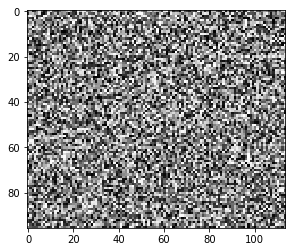

Final output:


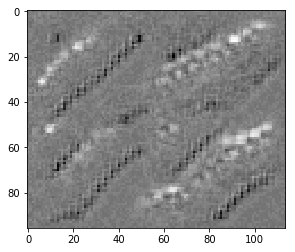

In [70]:
filter_pos = 1
print("Filter position: {}".format(filter_pos)) 
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True) # input image
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)

optimize_activations(sub_model, base, optimizer, filter_pos=filter_pos, num_iters=num_iters, show_x=num_iters+1)

Filter position: 13
Iteration 0. Loss 0


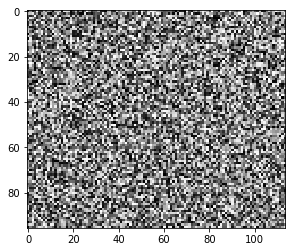

Final output:


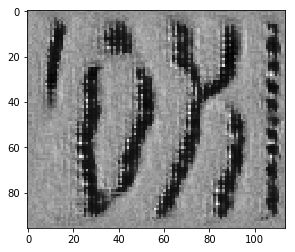

Filter position: 14
Iteration 0. Loss 0


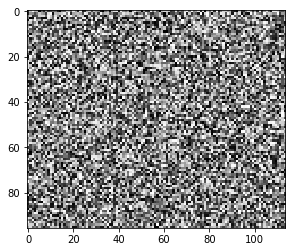

Final output:


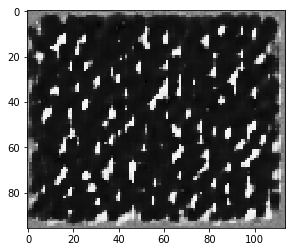

Filter position: 15
Iteration 0. Loss 0


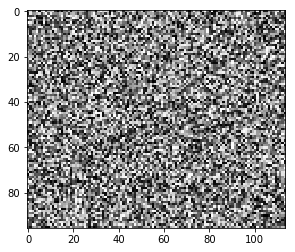

Final output:


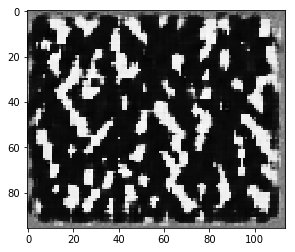

Filter position: 26
Iteration 0. Loss 0


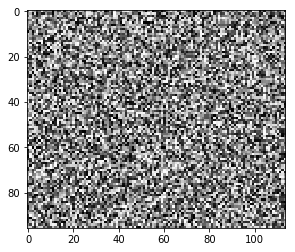

Final output:


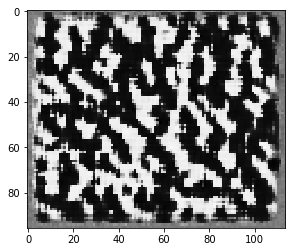

Filter position: 27
Iteration 0. Loss 0


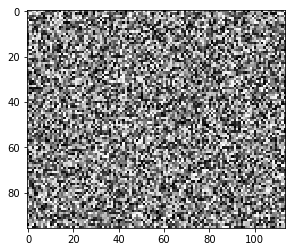

Final output:


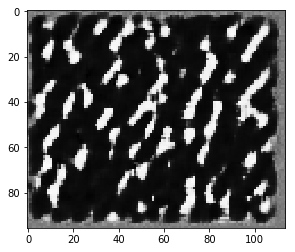

Filter position: 28
Iteration 0. Loss 0


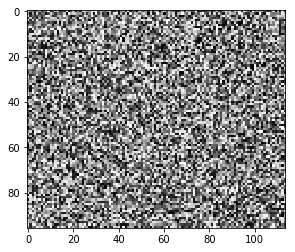

Final output:


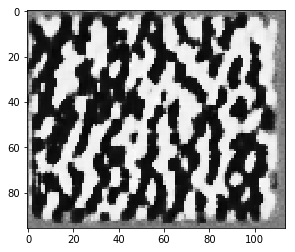

Filter position: 39
Iteration 0. Loss 0


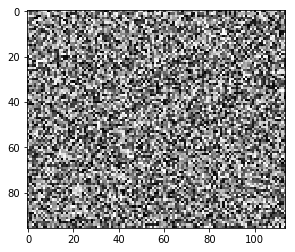

Final output:


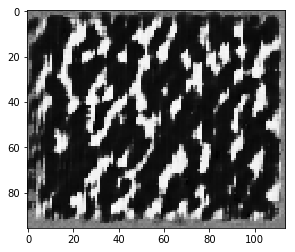

Filter position: 40
Iteration 0. Loss 0


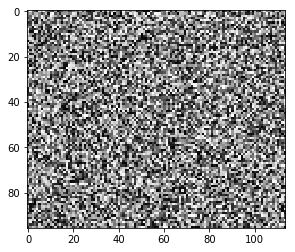

Final output:


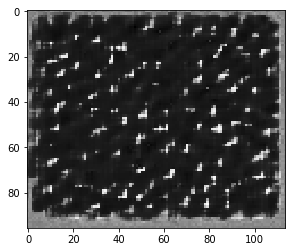

Filter position: 41
Iteration 0. Loss 0


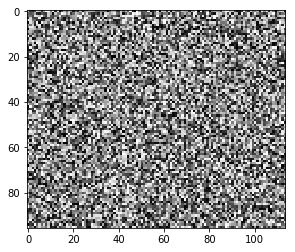

Final output:


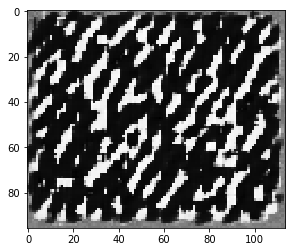

Filter position: 61
Iteration 0. Loss 0


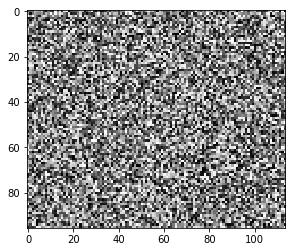

Final output:


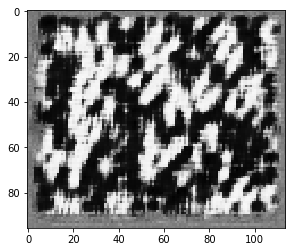

Filter position: 62
Iteration 0. Loss 0


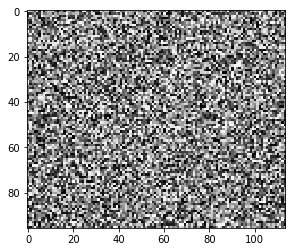

Final output:


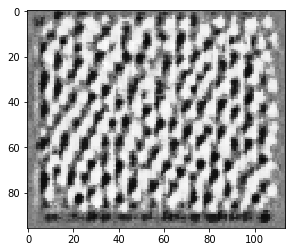

Filter position: 63
Iteration 0. Loss 0


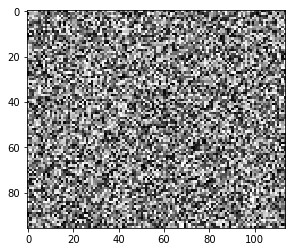

Final output:


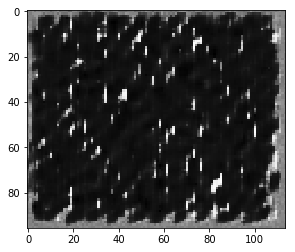

In [71]:
for filter_pos in [13, 14, 15, 26, 27, 28, 39, 40, 41, 61, 62, 63]:
    print("Filter position: {}".format(filter_pos)) 
    num_iters = 2000
    base = torch.rand((1, 1, 96, 114, 96), requires_grad=True) # input image
    optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)

    optimize_activations(sub_model, base, optimizer, filter_pos=filter_pos, num_iters=num_iters, show_x=num_iters+1)

First layer only

In [72]:
class SubModel(nn.Module):
    def __init__(self, drp_rate=0.3, blur_kernel=None):
        super(SubModel, self).__init__()
        self.drp_rate = drp_rate
        self.dropout = nn.Dropout3d(p=self.drp_rate)
        self.Conv_1 = nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=0)
        self.blur = blur_kernel

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.elu(self.Conv_1(x)) 
        return x

    def forward(self, x):
        print_size = False
        if self.blur is not None:
            x = F.conv3d(x, weight=self.blur.cuda(gpu), stride=1)
        x = self.encode(x, print_size=print_size)
        #x = self.flatten(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [73]:
sub_model = SubModel(blur_kernel=gaussian_kernel)

new_state_dict = sub_model.state_dict()
old_state_dict = net.state_dict()
for name, param in old_state_dict.items():
    if name in new_state_dict.keys():
        print(name)
        new_state_dict[name].copy_(param)

sub_model.load_state_dict(new_state_dict)

sub_model.cuda(gpu)
sub_model.eval()

Conv_1.weight
Conv_1.bias


SubModel(
  (dropout): Dropout3d(p=0.3)
  (Conv_1): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1))
)

Filter position: 13
Iteration 0. Loss 0


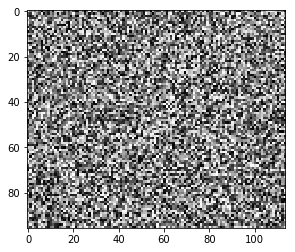

Final output:


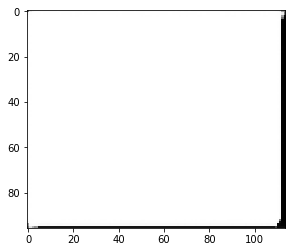

Filter position: 14
Iteration 0. Loss 0


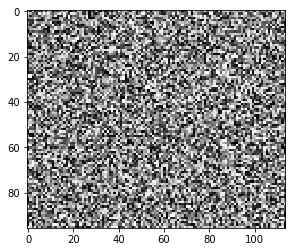

Final output:


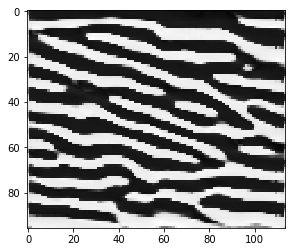

Filter position: 15
Iteration 0. Loss 0


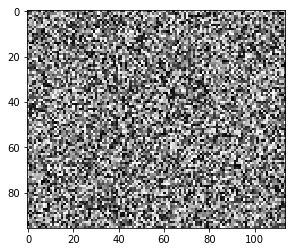

Final output:


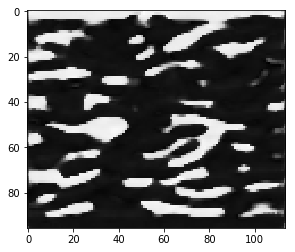

Filter position: 26
Iteration 0. Loss 0


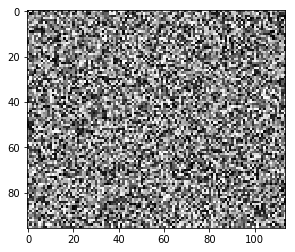

Final output:


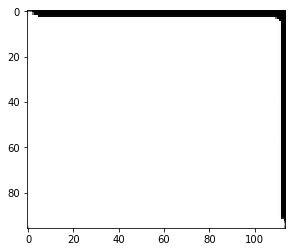

Filter position: 27
Iteration 0. Loss 0


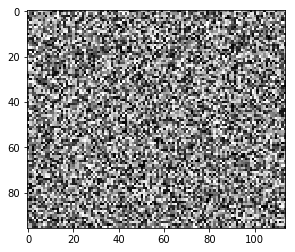

Final output:


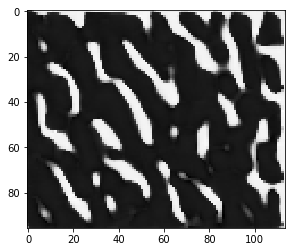

Filter position: 28
Iteration 0. Loss 0


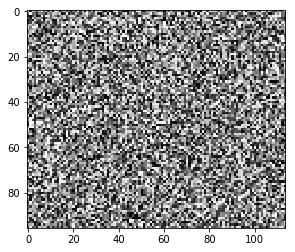

Final output:


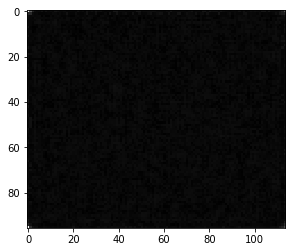

Filter position: 39
Iteration 0. Loss 0


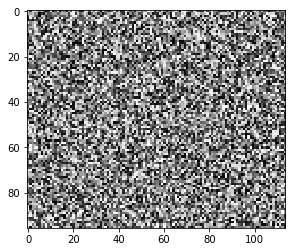

Final output:


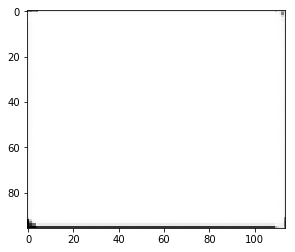

Filter position: 40
Iteration 0. Loss 0


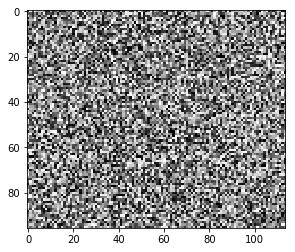

Final output:


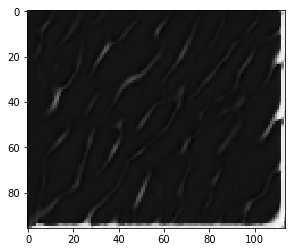

Filter position: 41
Iteration 0. Loss 0


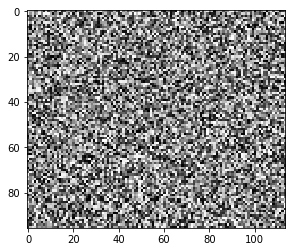

Final output:


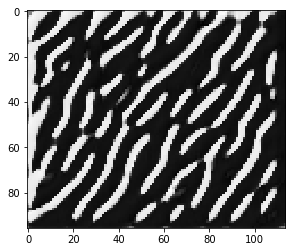

Filter position: 61
Iteration 0. Loss 0


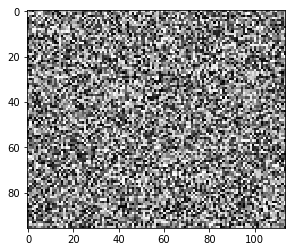

Final output:


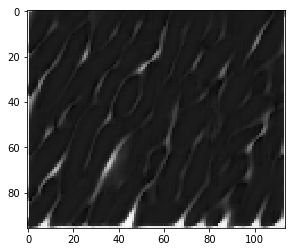

Filter position: 62
Iteration 0. Loss 0


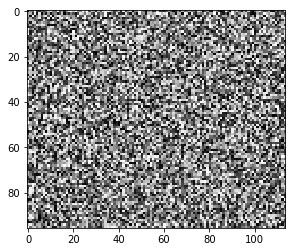

Final output:


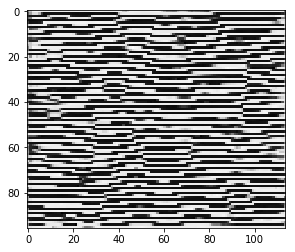

Filter position: 63
Iteration 0. Loss 0


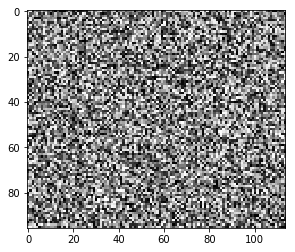

Final output:


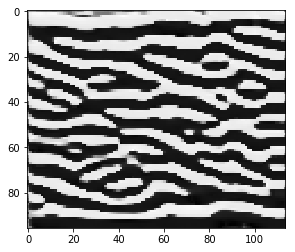

In [74]:
for filter_pos in [13, 14, 15, 26, 27, 28, 39, 40, 41, 61, 62, 63]:
    print("Filter position: {}".format(filter_pos)) 
    num_iters = 2000
    base = torch.rand((1, 1, 96, 114, 96), requires_grad=True) # input image
    optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)

    optimize_activations(sub_model, base, optimizer, filter_pos=filter_pos, num_iters=num_iters, show_x=num_iters+1)

## Add transformation robustness

In [82]:
from torchvision import transforms
from nitorch.transforms import Translate, Rotate, Flip

In [76]:
def optimize_activations(sub_model, base, optimizer, filter_pos=0, num_iters=2000, show_x=200, ps=6,transforms=None):
    loss = 0
    l1_loss = nn.L1Loss(reduction='mean')
    
    for i in range(num_iters + 1):
        base = base.detach()
        base = F.pad(base, pad=(ps,ps,ps,ps,ps,ps))
        if transforms:
            base = transforms(base)
        base = base[:,:,ps:-ps,ps:-ps,ps:-ps]
        if i % show_x == 0:
            print("Iteration {}. Loss {}".format(i, loss))
            plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
            plt.show()
        #base = F.conv3d(base, weight=gaussian_kernel, stride=1)  
        sub_model.zero_grad()
        res = sub_model.forward(base.cuda(gpu))            
        l1 = l1_loss(res[0, filter_pos], torch.zeros_like(res[0, filter_pos]))
        #print(l1)
        loss = -torch.sum(torch.abs(res[0, filter_pos])) + l1 * 10
        #print(loss)
        loss.backward()
        optimizer.step()
    print("Final output:")
    plt.imshow(base.cpu().detach().numpy()[0,0,:,:,48],cmap='gray')
    plt.show()

In [77]:
class TranslateTorch:
    """
    Translate the input along a given axis.

    Arguments:
        axis: axis to rotate. Default is 0
        dist: min and max translation distance in pixels. Randomly 
            translates within that range. Can be scalar, list or tuple. 
            In case of scalar it translates between -abs(dist) and 
            abs(dist). Default is (-3, 3).
    """

    def __init__(self, axis=0, dist=(-3, 3)):
        self.axis = axis

        if isinstance(dist, tuple) or isinstance(dist, list):
            assert len(dist) == 2
            self.min_trans = np.min(dist)
            self.max_trans = np.max(dist)
        else:
            self.min_trans = -int(abs(dist))
            self.max_trans = int(abs(dist))

    def __call__(self, image):
        rand = np.random.randint(self.min_trans, self.max_trans + 1)
        #augmented = torch.zeros(size=image.shape)
        augmented = image.clone()
        #augmented[:] = 0
        if self.axis == 0:
            if rand < 0:
                augmented[:,:,-rand:, :] = image[:,:,:rand, :]
            elif rand > 0:
                augmented[:,:,:-rand, :] = image[:,:,rand:, :]
            else:
                augmented = image
        elif self.axis == 1:
            if rand < 0:
                augmented[:,:,:, -rand:, :] = image[:,:,:, :rand, :]
            elif rand > 0:
                augmented[:,:,:, :-rand, :] = image[:,:,:, rand:, :]
            else:
                augmented = image
        elif self.axis == 2:
            if rand < 0:
                augmented[:,:,:, :, -rand:] = image[:,:,:, :, :rand]
            elif rand > 0:
                augmented[:,:,:, :, :-rand] = image[:,:,:, :, rand:]
            else:
                augmented = image
        image = augmented
        #image[0,0,3,:,:] = 0
        return image

In [78]:
class FlipTorch:
    """
    Flip the input along a given axis.

    Arguments:
        axis: axis to flip over. Default is 0
        prob: probability to flip the image. Executes always when set to
             1. Default is 0.5
    """

    def __init__(self, axis=0, prob=0.5):
        self.axis = axis
        self.prob = prob

    def __call__(self, image):
        rand = np.random.uniform()
        if rand <= self.prob:
            augmented = torch.flip(image, dims=(self.axis,))
        else:
            augmented = image
        return augmented

In [79]:
trans_1 = [TranslateTorch(axis=dim, dist=8) for dim in [0, 1, 2]]
trans_2 = [TranslateTorch(axis=dim, dist=3) for dim in [0, 1, 2]]
#rot = [Rotate(axis=dim, deg=5) for dim in [0, 1, 2]]
flip = [FlipTorch(axis=dim, prob=0.5) for dim in [0]] #, 1, 2]] USING ONLY ONE


In [80]:
#transf = transforms.Compose(trans_1 + flip + trans_2)
transf = transforms.Compose(trans_2)

Filter position: 1
Iteration 0. Loss 0


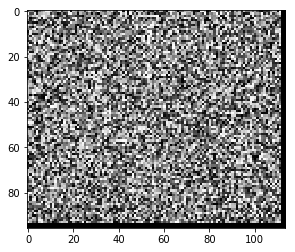

Iteration 1. Loss -902619.0


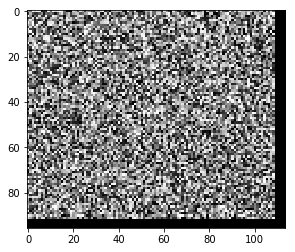

Iteration 2. Loss -900354.75


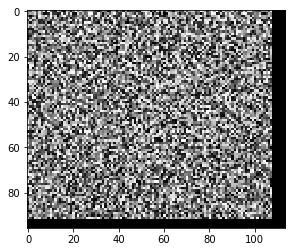

Iteration 3. Loss -884324.3125


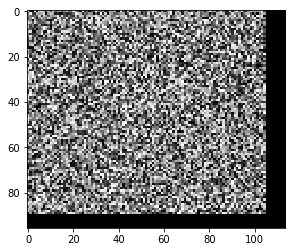

Iteration 4. Loss -845735.8125


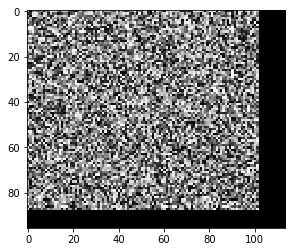

Iteration 5. Loss -825529.1875


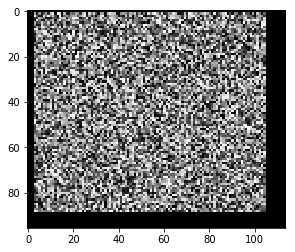

Iteration 6. Loss -850767.9375


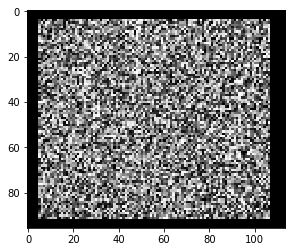

Iteration 7. Loss -877454.625


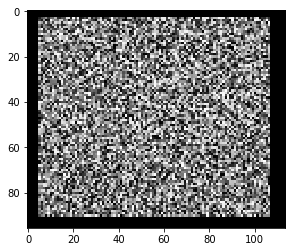

Iteration 8. Loss -873779.125


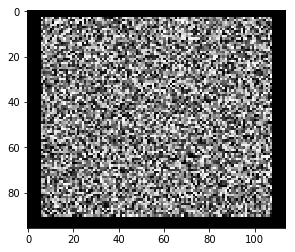

Iteration 9. Loss -881883.875


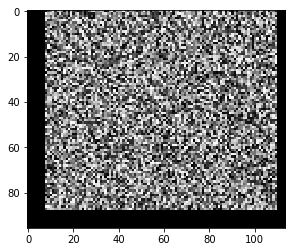

Iteration 10. Loss -828603.4375


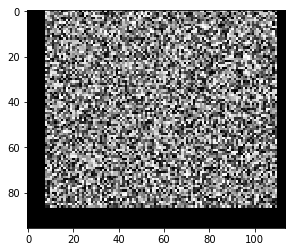

Iteration 11. Loss -812857.25


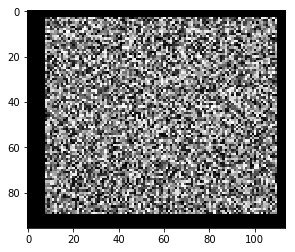

Iteration 12. Loss -860100.5625


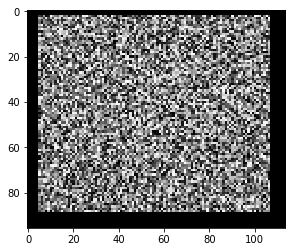

Iteration 13. Loss -857020.3125


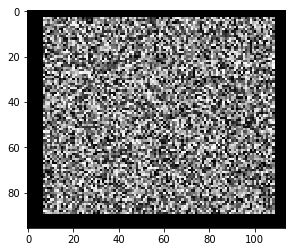

Iteration 14. Loss -849322.125


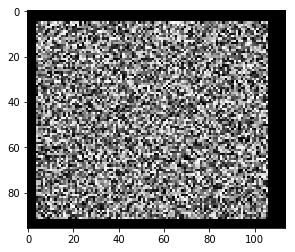

Iteration 15. Loss -870479.1875


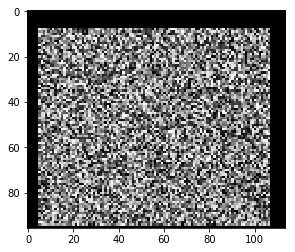

Iteration 16. Loss -835105.1875


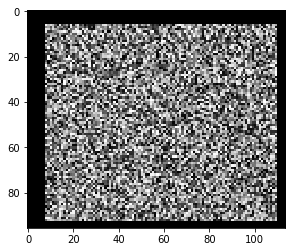

Iteration 17. Loss -845955.25


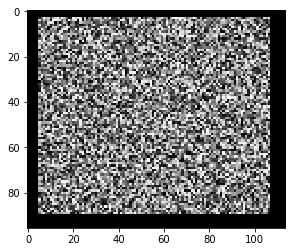

Iteration 18. Loss -866683.625


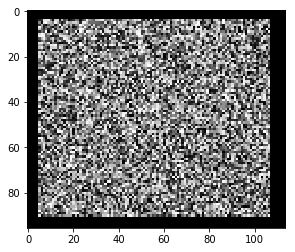

Iteration 19. Loss -878619.25


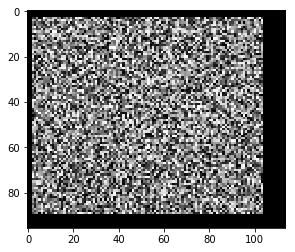

Iteration 20. Loss -846487.25


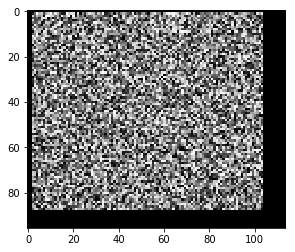

Iteration 21. Loss -831900.1875


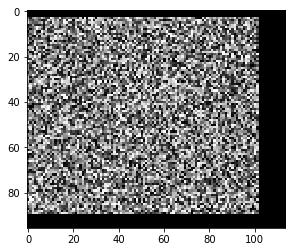

Iteration 22. Loss -825206.0625


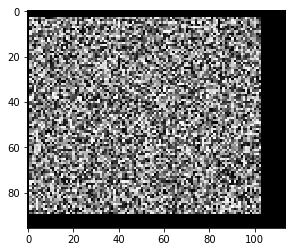

Iteration 23. Loss -808488.8125


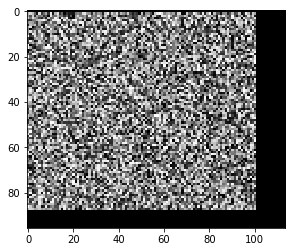

Iteration 24. Loss -795646.3125


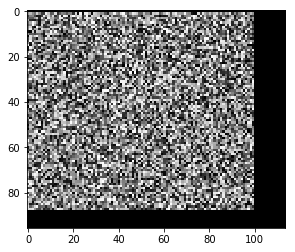

Iteration 25. Loss -796341.9375


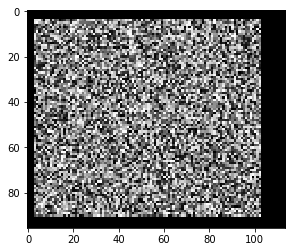

Iteration 26. Loss -844559.5625


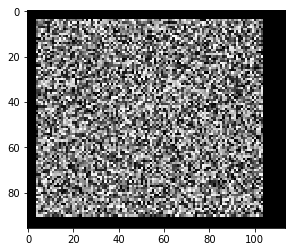

Iteration 27. Loss -845889.25


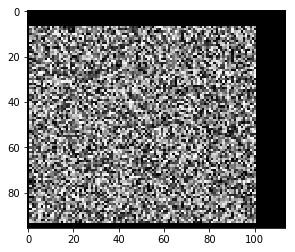

Iteration 28. Loss -804614.3125


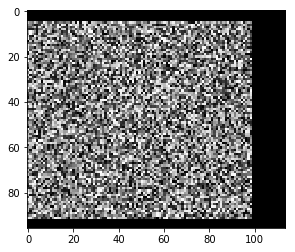

Iteration 29. Loss -813005.5625


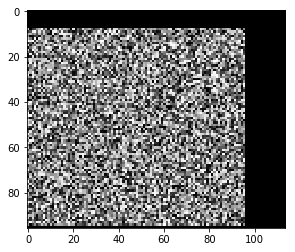

Iteration 30. Loss -756981.4375


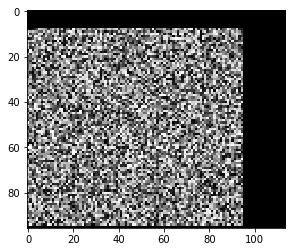

Iteration 31. Loss -743370.6875


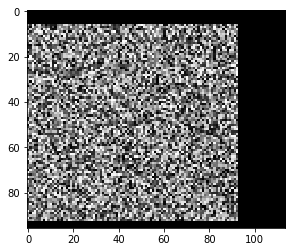

Iteration 32. Loss -758180.875


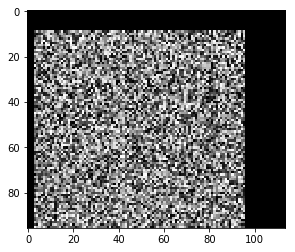

Iteration 33. Loss -735676.625


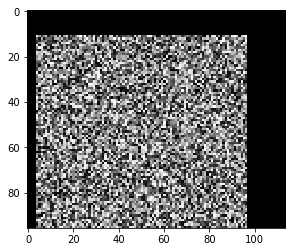

Iteration 34. Loss -706818.6875


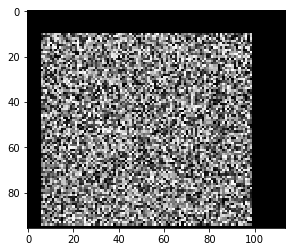

Iteration 35. Loss -739354.875


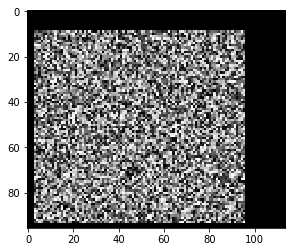

Iteration 36. Loss -721449.625


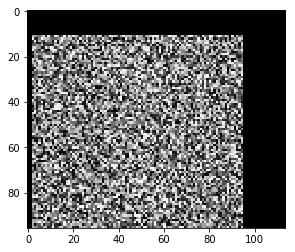

Iteration 37. Loss -708803.375


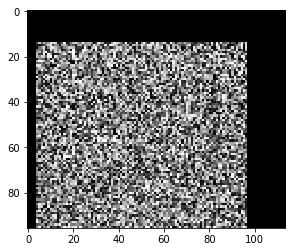

Iteration 38. Loss -706524.9375


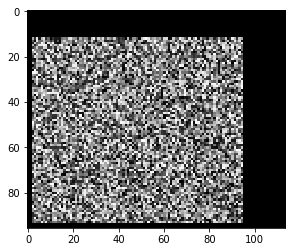

Iteration 39. Loss -719197.4375


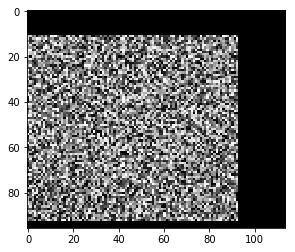

Iteration 40. Loss -713356.5


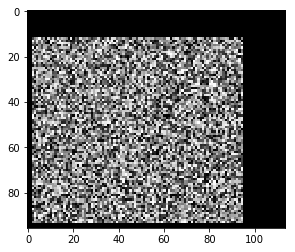

Iteration 41. Loss -719197.4375


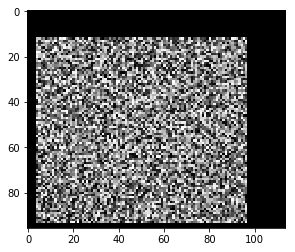

Iteration 42. Loss -731482.3125


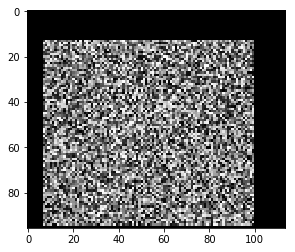

Iteration 43. Loss -729153.875


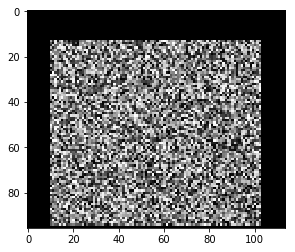

Iteration 44. Loss -729153.875


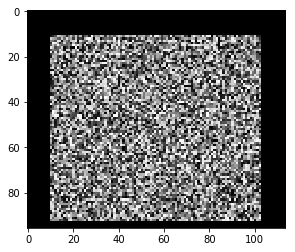

Iteration 45. Loss -733494.6875


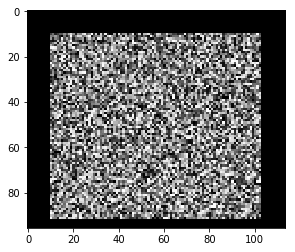

Iteration 46. Loss -724752.875


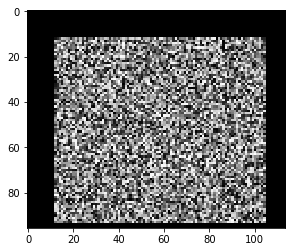

Iteration 47. Loss -726552.0625


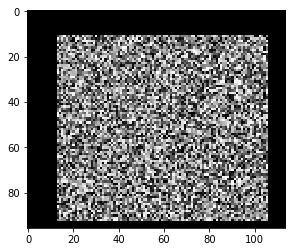

Iteration 48. Loss -743290.5625


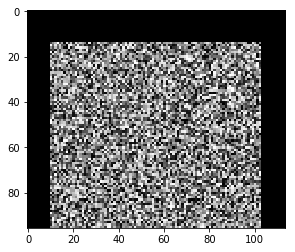

Iteration 49. Loss -721987.5


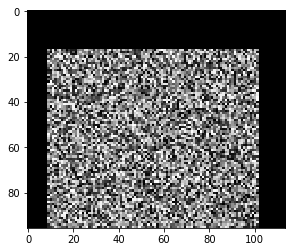

Iteration 50. Loss -700397.625


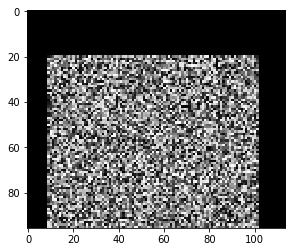

Iteration 51. Loss -670017.125


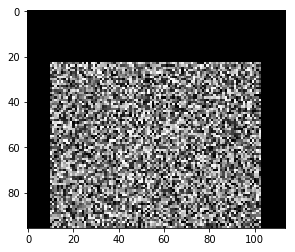

Iteration 52. Loss -657219.25


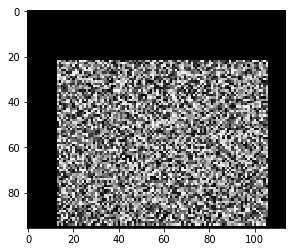

Iteration 53. Loss -664381.75


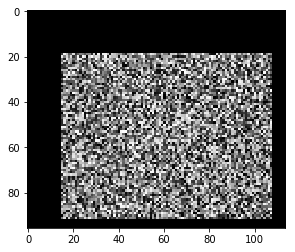

Iteration 54. Loss -684999.6875


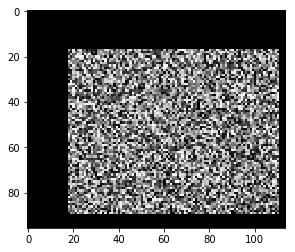

Iteration 55. Loss -681002.6875


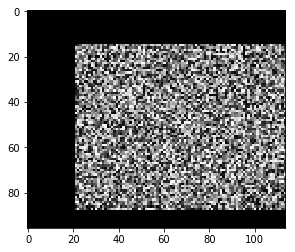

Iteration 56. Loss -655375.125


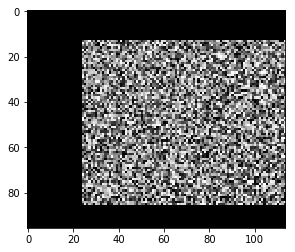

Iteration 57. Loss -646903.875


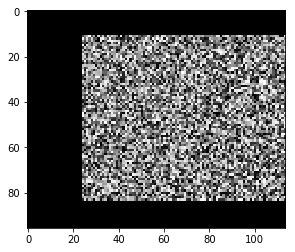

Iteration 58. Loss -646903.875


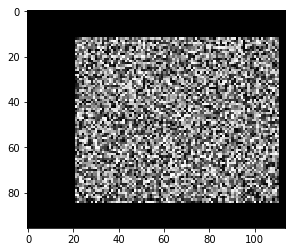

Iteration 59. Loss -655367.125


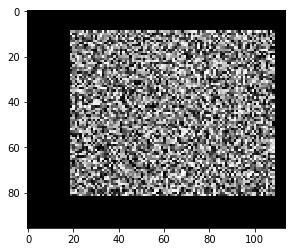

Iteration 60. Loss -657609.5


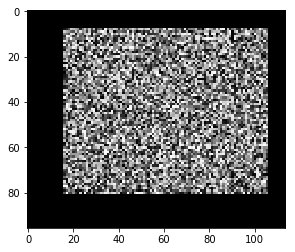

Iteration 61. Loss -664709.625


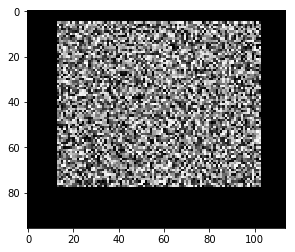

Iteration 62. Loss -657609.5


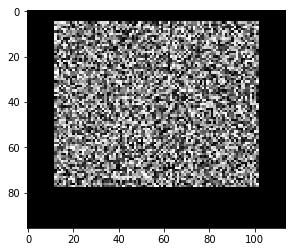

Iteration 63. Loss -639013.8125


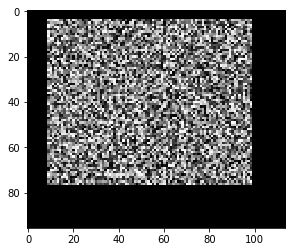

Iteration 64. Loss -633061.125


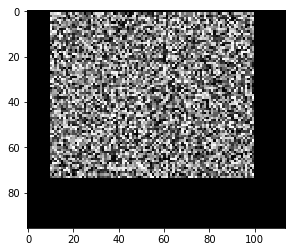

Iteration 65. Loss -613723.9375


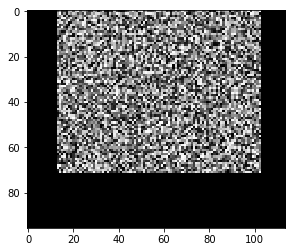

Iteration 66. Loss -594912.3125


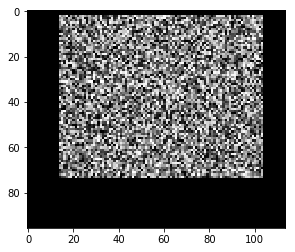

Iteration 67. Loss -589965.8125


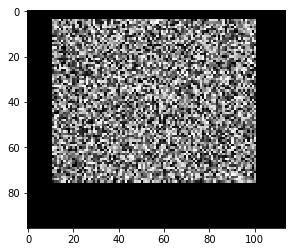

Iteration 68. Loss -602170.9375


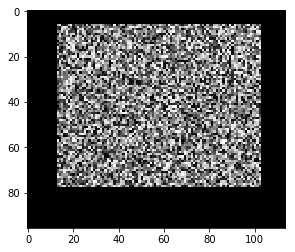

Iteration 69. Loss -613972.0625


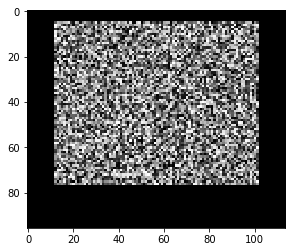

Iteration 70. Loss -627038.3125


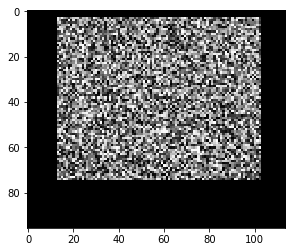

Iteration 71. Loss -608012.375


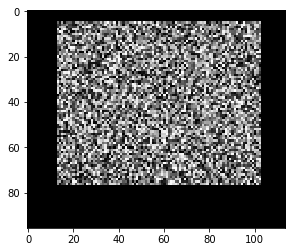

Iteration 72. Loss -635417.5


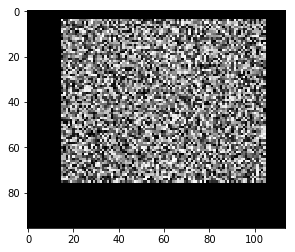

Iteration 73. Loss -629569.6875


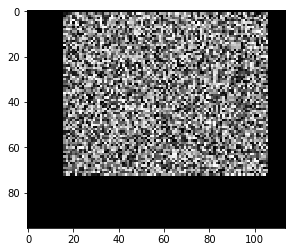

Iteration 74. Loss -610332.625


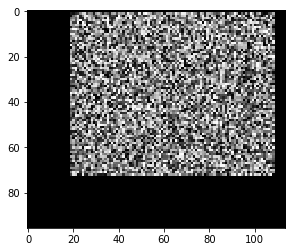

Iteration 75. Loss -610332.625


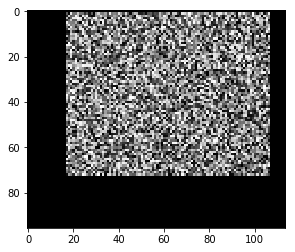

Iteration 76. Loss -610332.625


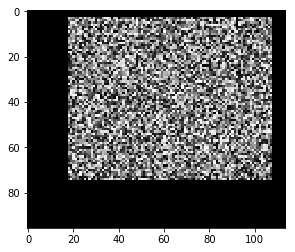

Iteration 77. Loss -623290.625


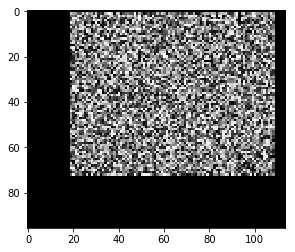

Iteration 78. Loss -610332.625


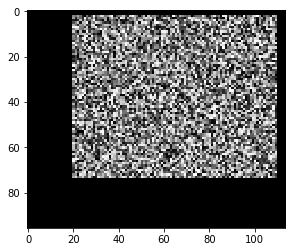

Iteration 79. Loss -613207.75


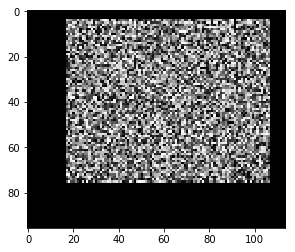

Iteration 80. Loss -629569.75


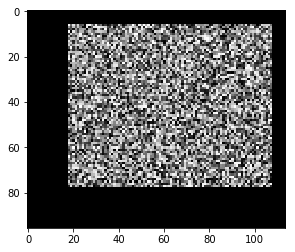

Iteration 81. Loss -635417.5625


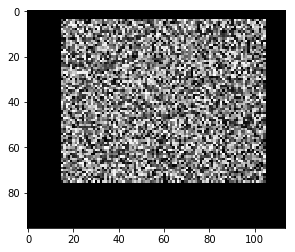

Iteration 82. Loss -629569.75


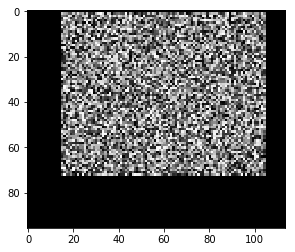

Iteration 83. Loss -610332.625


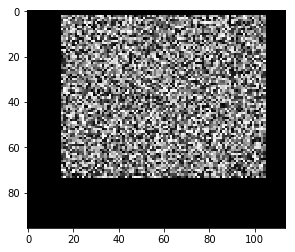

Iteration 84. Loss -616848.5625


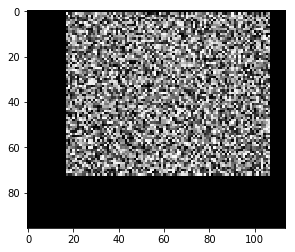

Iteration 85. Loss -610332.625


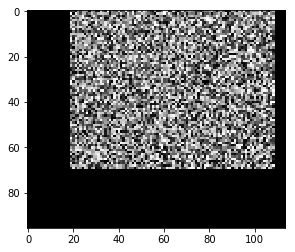

Iteration 86. Loss -590658.125


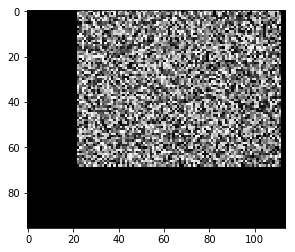

Iteration 87. Loss -571505.8125


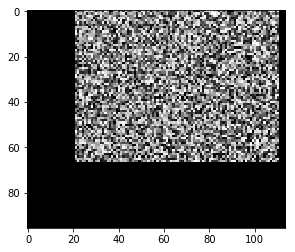

Iteration 88. Loss -563268.3125


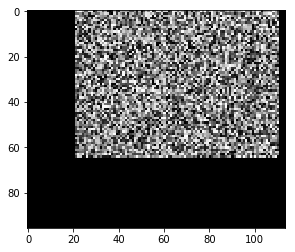

Iteration 89. Loss -550364.875


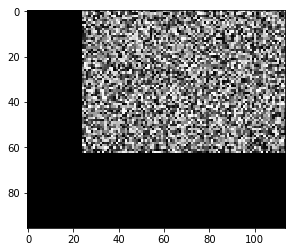

Iteration 90. Loss -524545.625


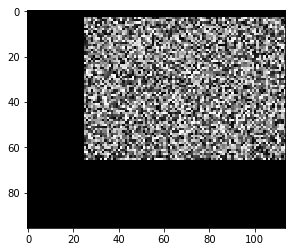

Iteration 91. Loss -538557.5


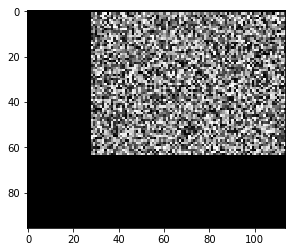

Iteration 92. Loss -513081.6875


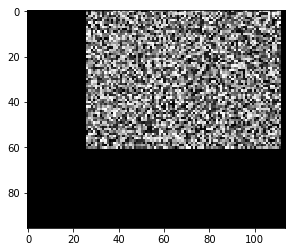

Iteration 93. Loss -497044.28125


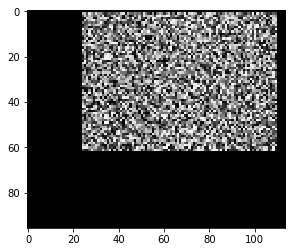

Iteration 94. Loss -517878.5625


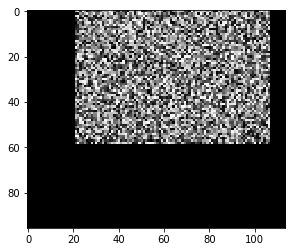

Iteration 95. Loss -502068.65625


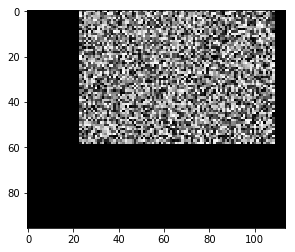

Iteration 96. Loss -502068.6875


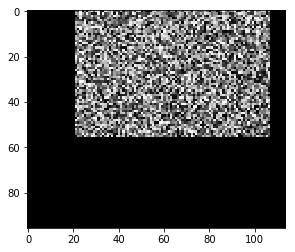

Iteration 97. Loss -483199.03125


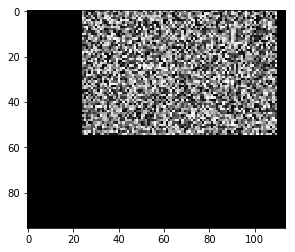

Iteration 98. Loss -474231.03125


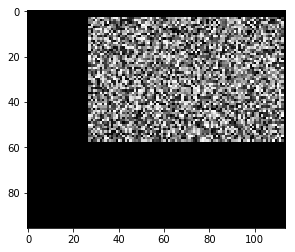

Iteration 99. Loss -481108.53125


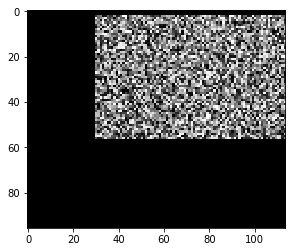

Iteration 100. Loss -463370.8125


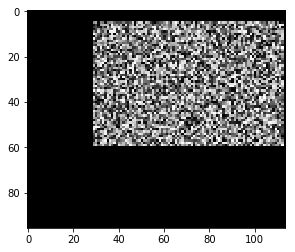

Iteration 101. Loss -484070.84375


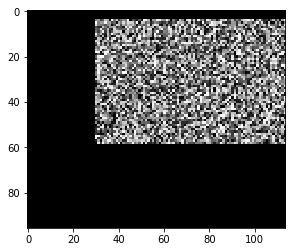

Iteration 102. Loss -468042.40625


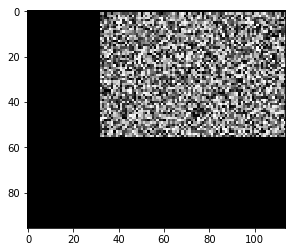

Iteration 103. Loss -449838.65625


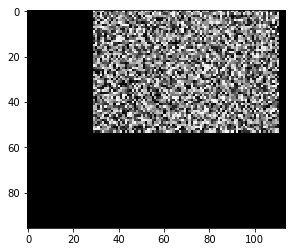

Iteration 104. Loss -449543.1875


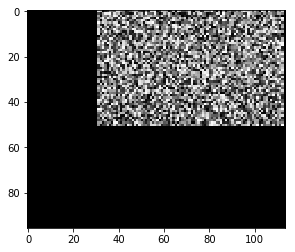

Iteration 105. Loss -424952.28125


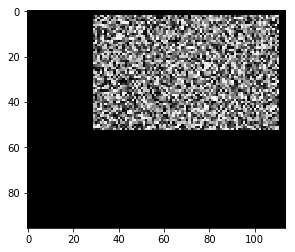

Iteration 106. Loss -443597.09375


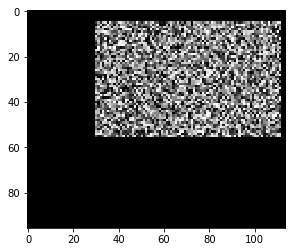

Iteration 107. Loss -456587.4375


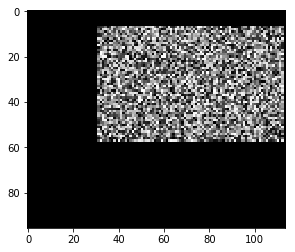

Iteration 108. Loss -452772.3125


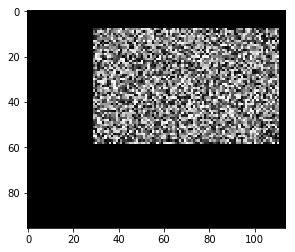

Iteration 109. Loss -460346.46875


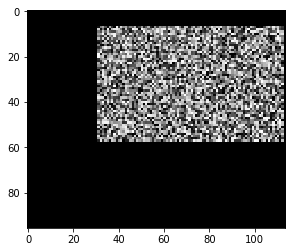

Iteration 110. Loss -452772.28125


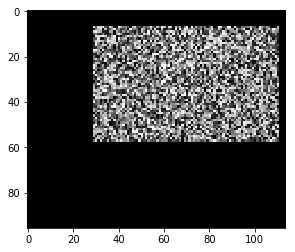

Iteration 111. Loss -460346.46875


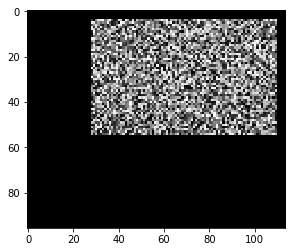

Iteration 112. Loss -458622.03125


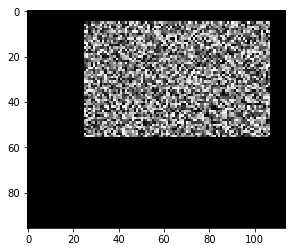

Iteration 113. Loss -466596.0625


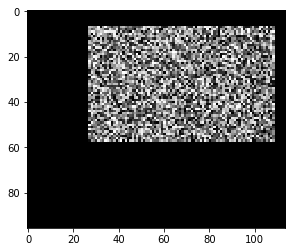

Iteration 114. Loss -466596.03125


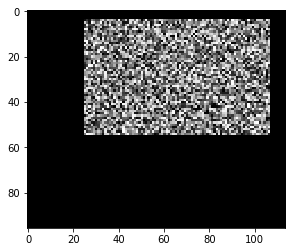

Iteration 115. Loss -461263.375


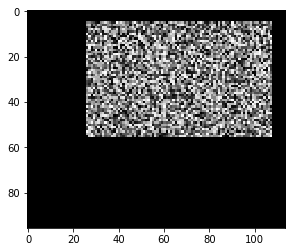

Iteration 116. Loss -455004.09375


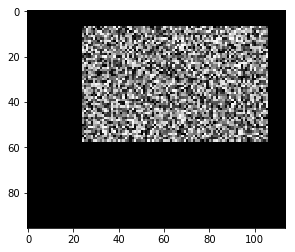

Iteration 117. Loss -442700.03125


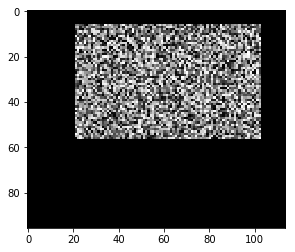

Iteration 118. Loss -454958.21875


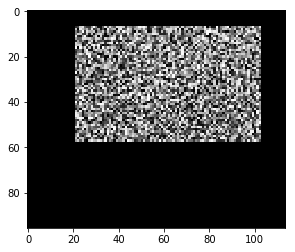

Iteration 119. Loss -450900.4375


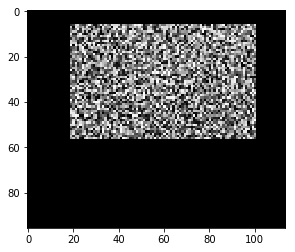

Iteration 120. Loss -450900.4375


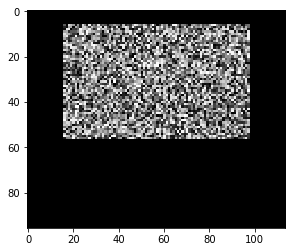

Iteration 121. Loss -462505.375


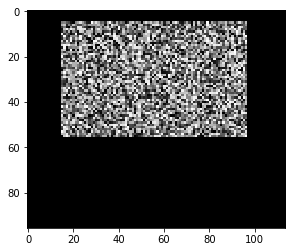

Iteration 122. Loss -454958.21875


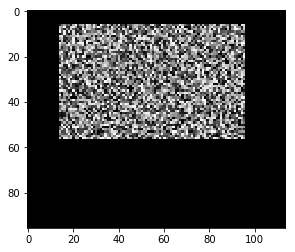

Iteration 123. Loss -446805.25


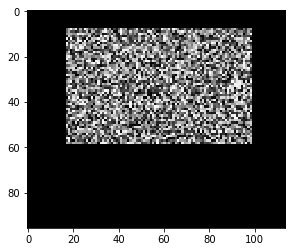

Iteration 124. Loss -438596.9375


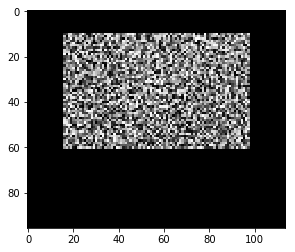

Iteration 125. Loss -450845.4375


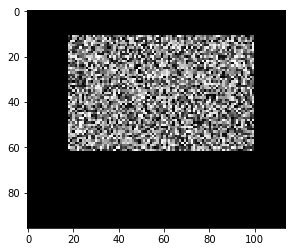

Iteration 126. Loss -458361.34375


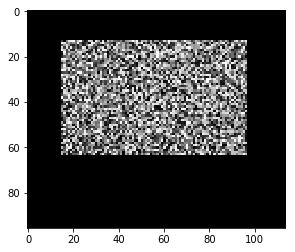

Iteration 127. Loss -458361.34375


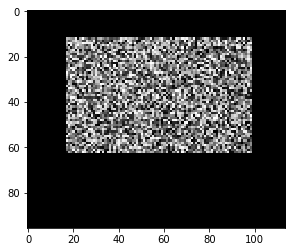

Iteration 128. Loss -458361.34375


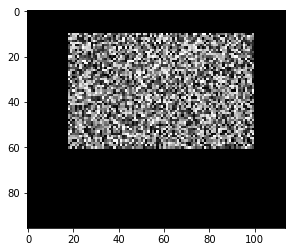

Iteration 129. Loss -458361.34375


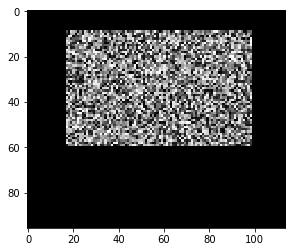

Iteration 130. Loss -458361.34375


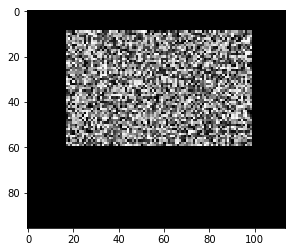

Iteration 131. Loss -458361.375


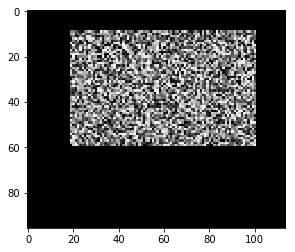

Iteration 132. Loss -454812.125


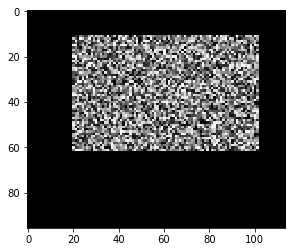

Iteration 133. Loss -458361.34375


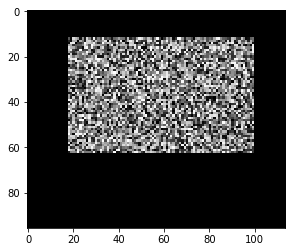

Iteration 134. Loss -458361.34375


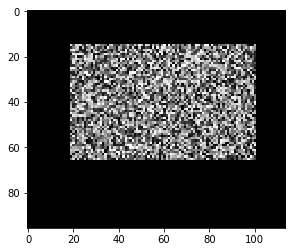

Iteration 135. Loss -458361.375


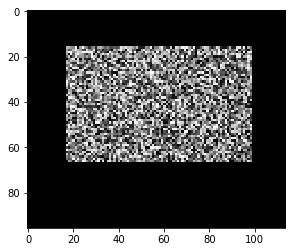

Iteration 136. Loss -458361.375


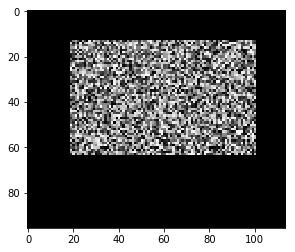

Iteration 137. Loss -458361.34375


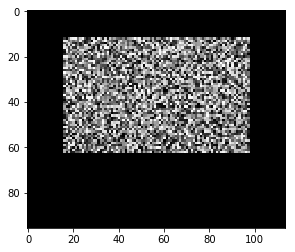

Iteration 138. Loss -458361.375


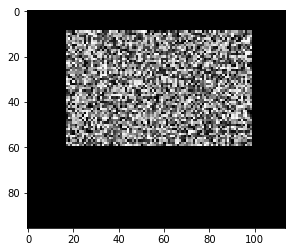

Iteration 139. Loss -458361.375


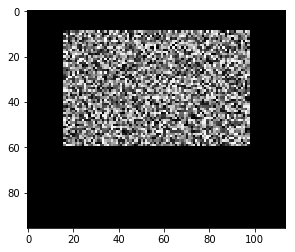

Iteration 140. Loss -458361.34375


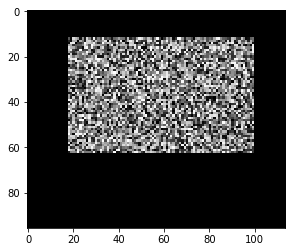

Iteration 141. Loss -458361.34375


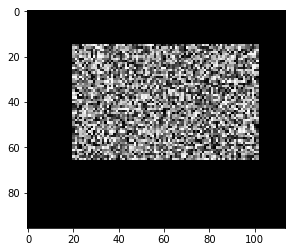

Iteration 142. Loss -458361.375


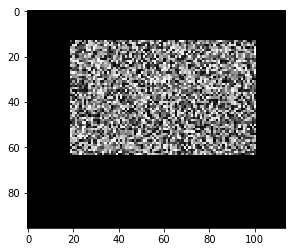

Iteration 143. Loss -458361.34375


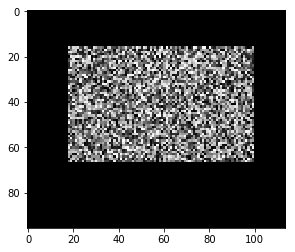

Iteration 144. Loss -458361.34375


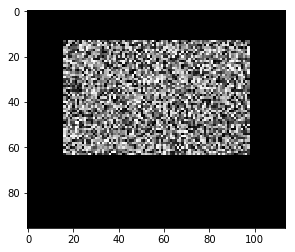

Iteration 145. Loss -458361.34375


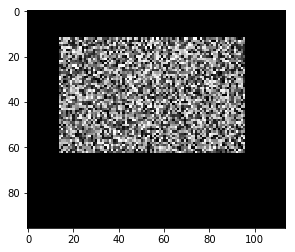

Iteration 146. Loss -458361.375


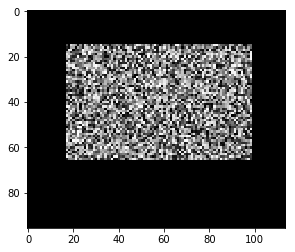

Iteration 147. Loss -458361.34375


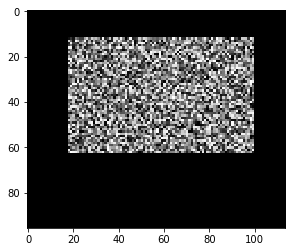

Iteration 148. Loss -458361.375


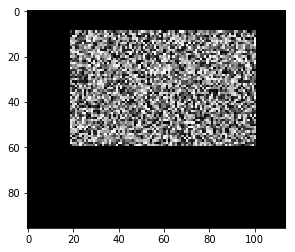

Iteration 149. Loss -458361.34375


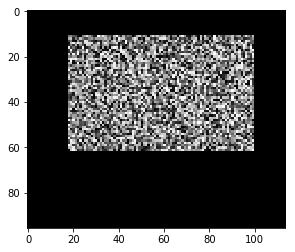

Iteration 150. Loss -454812.125


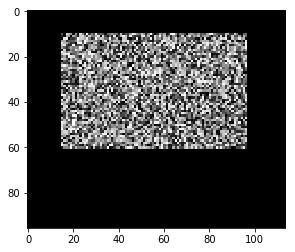

Iteration 151. Loss -458361.34375


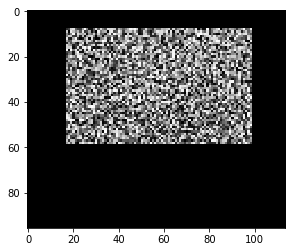

Iteration 152. Loss -450845.4375


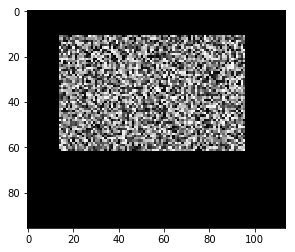

Iteration 153. Loss -454812.125


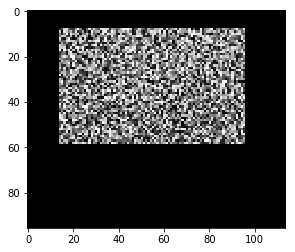

Iteration 154. Loss -450845.4375


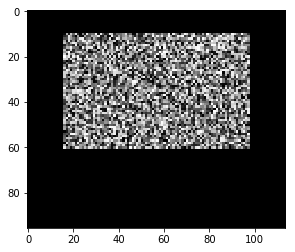

Iteration 155. Loss -442702.40625


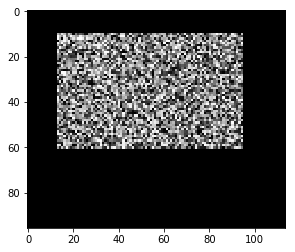

Iteration 156. Loss -434495.1875


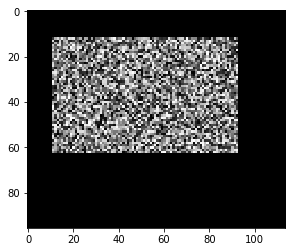

Iteration 157. Loss -426289.53125


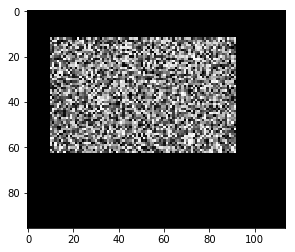

Iteration 158. Loss -422187.875


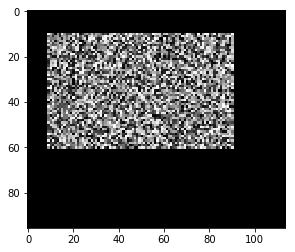

Iteration 159. Loss -413982.40625


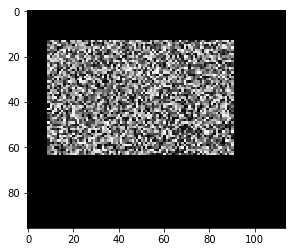

Iteration 160. Loss -401675.0


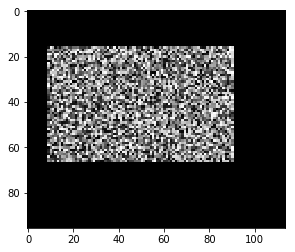

Iteration 161. Loss -389366.6875


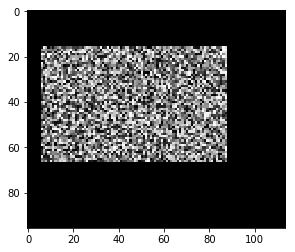

Iteration 162. Loss -389366.6875


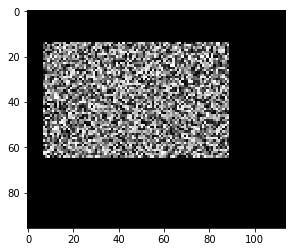

Iteration 163. Loss -381160.15625


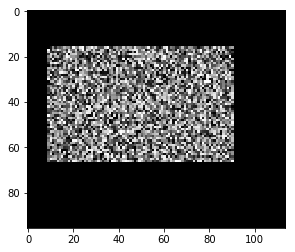

Iteration 164. Loss -368863.375


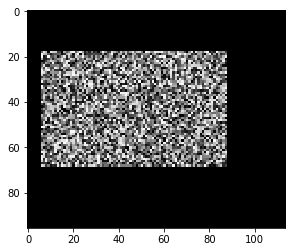

Iteration 165. Loss -377055.90625


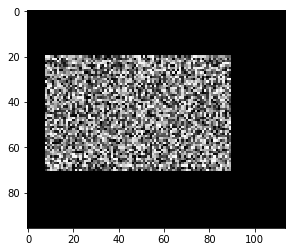

Iteration 166. Loss -385078.21875


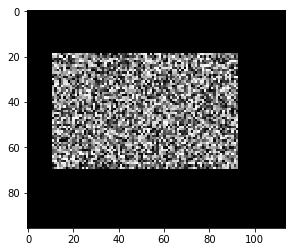

Iteration 167. Loss -385078.21875


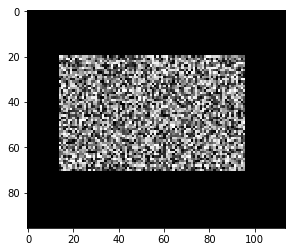

Iteration 168. Loss -385078.21875


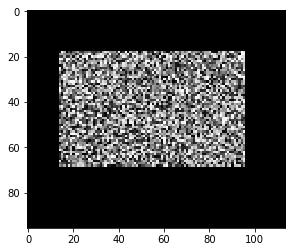

Iteration 169. Loss -388639.90625


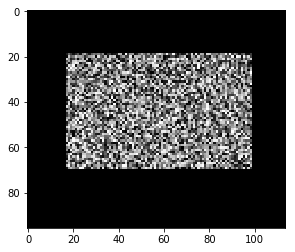

Iteration 170. Loss -388639.875


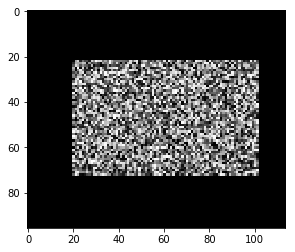

Iteration 171. Loss -388639.875


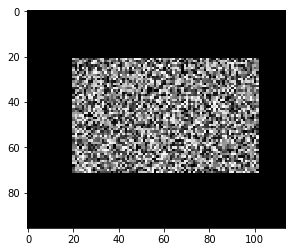

Iteration 172. Loss -388639.875


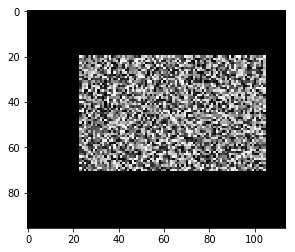

Iteration 173. Loss -388639.90625


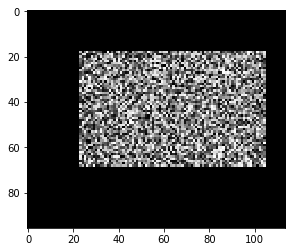

Iteration 174. Loss -388639.875


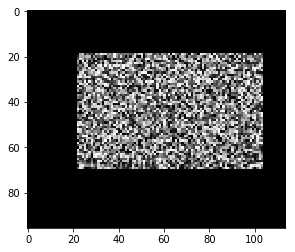

Iteration 175. Loss -388639.875


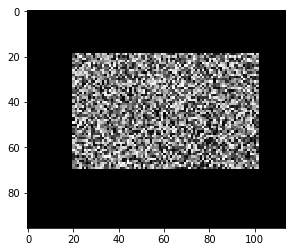

Iteration 176. Loss -388639.875


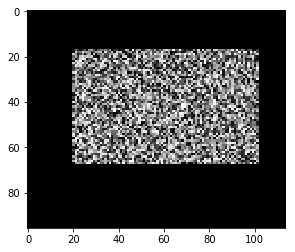

Iteration 177. Loss -388639.875


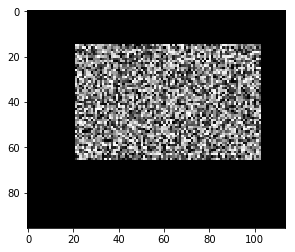

Iteration 178. Loss -385078.21875


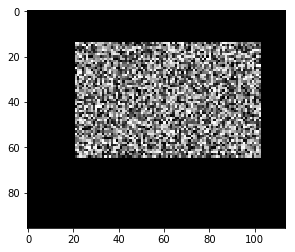

Iteration 179. Loss -385078.21875


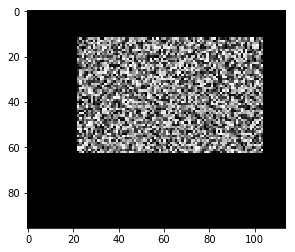

Iteration 180. Loss -381107.28125


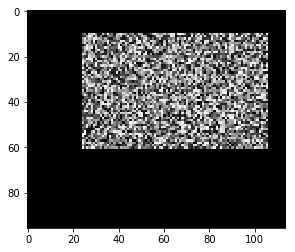

Iteration 181. Loss -388639.90625


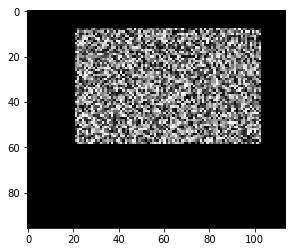

Iteration 182. Loss -388639.875


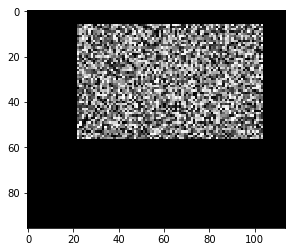

Iteration 183. Loss -388639.90625


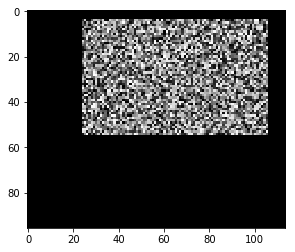

Iteration 184. Loss -377134.4375


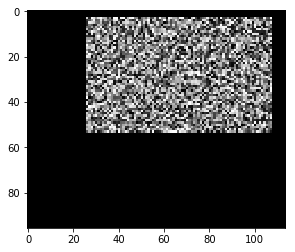

Iteration 185. Loss -365007.96875


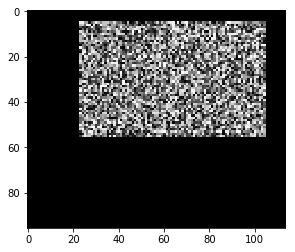

Iteration 186. Loss -385078.21875


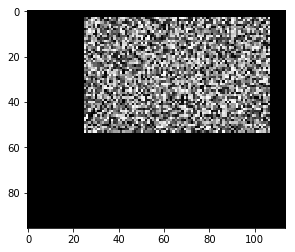

Iteration 187. Loss -380254.09375


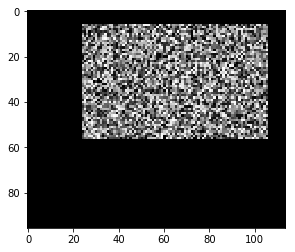

Iteration 188. Loss -388639.875


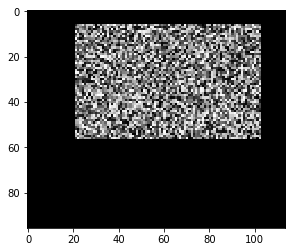

Iteration 189. Loss -388639.875


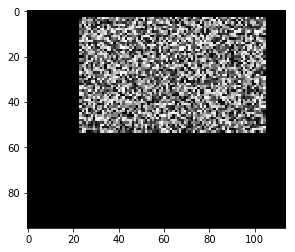

Iteration 190. Loss -380254.09375


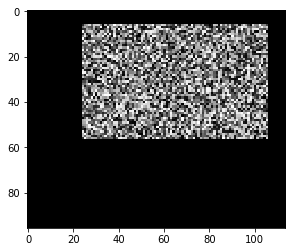

Iteration 191. Loss -388639.90625


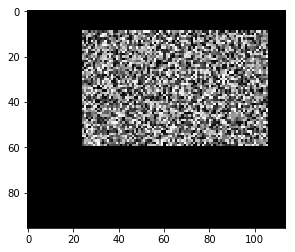

Iteration 192. Loss -388639.875


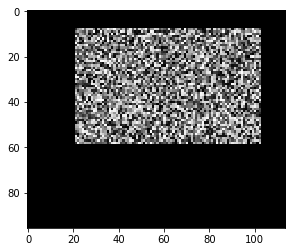

Iteration 193. Loss -388639.875


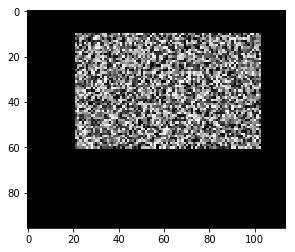

Iteration 194. Loss -388639.875


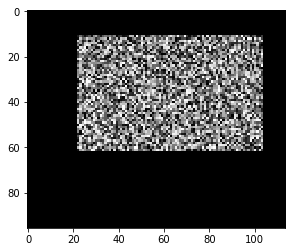

Iteration 195. Loss -388639.875


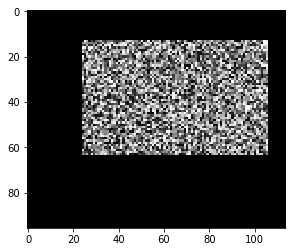

Iteration 196. Loss -388639.875


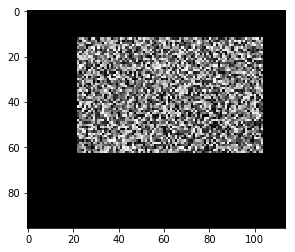

Iteration 197. Loss -388639.90625


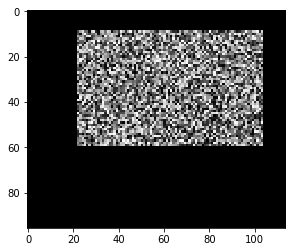

Iteration 198. Loss -388639.875


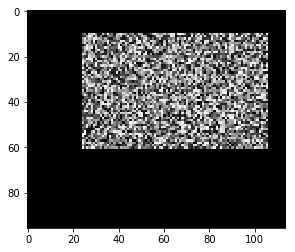

Iteration 199. Loss -388639.90625


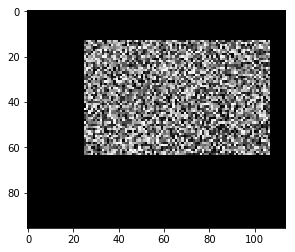

Iteration 200. Loss -388639.90625


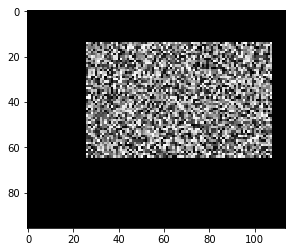

Iteration 201. Loss -388639.90625


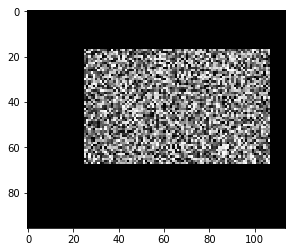

Iteration 202. Loss -388639.90625


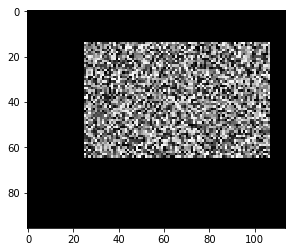

Iteration 203. Loss -388639.90625


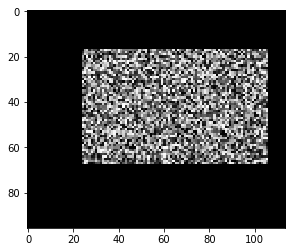

Iteration 204. Loss -388639.90625


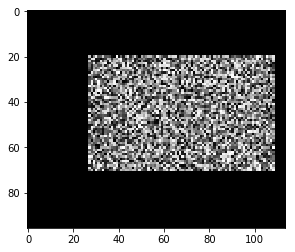

Iteration 205. Loss -388639.875


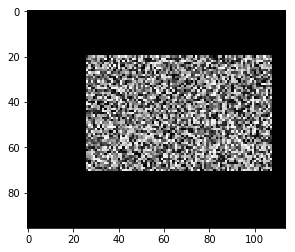

Iteration 206. Loss -388639.875


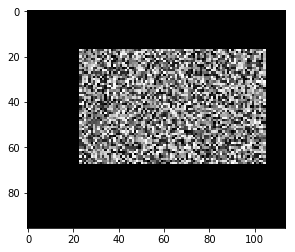

Iteration 207. Loss -388639.875


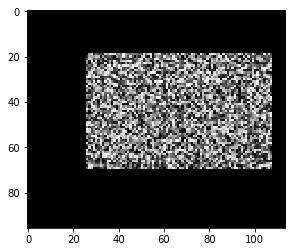

Iteration 208. Loss -388639.90625


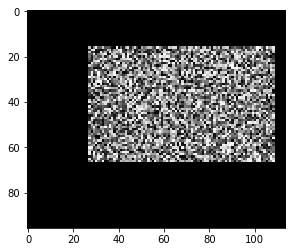

Iteration 209. Loss -388639.875


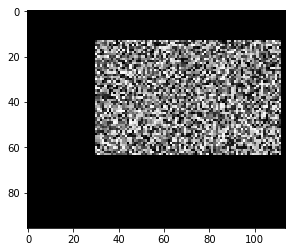

Iteration 210. Loss -381055.96875


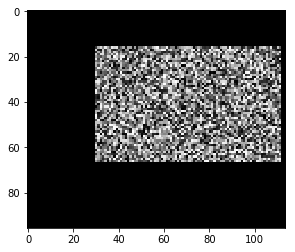

Iteration 211. Loss -381055.96875


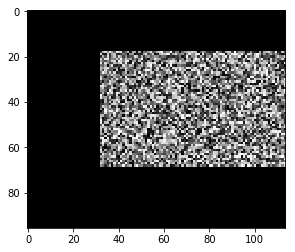

Iteration 212. Loss -375197.71875


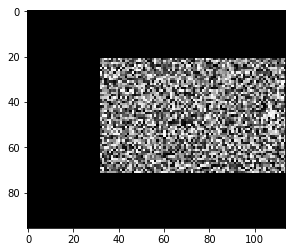

Iteration 213. Loss -375197.71875


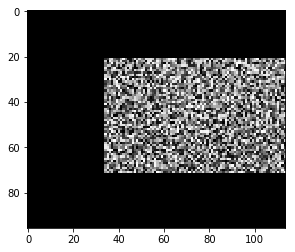

Iteration 214. Loss -369283.09375


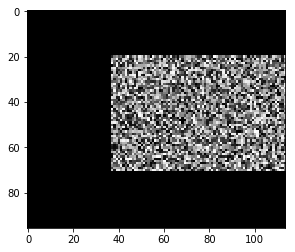

Iteration 215. Loss -360388.0


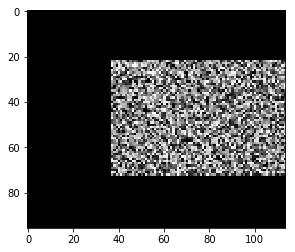

Iteration 216. Loss -360388.0625


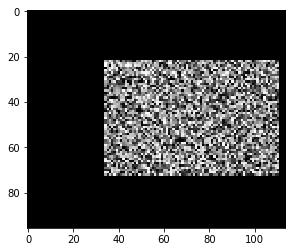

Iteration 217. Loss -369126.71875


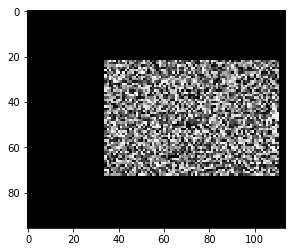

Iteration 218. Loss -369126.71875


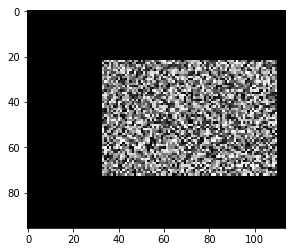

Iteration 219. Loss -371854.375


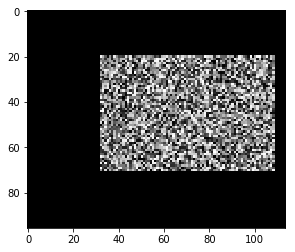

Iteration 220. Loss -373826.71875


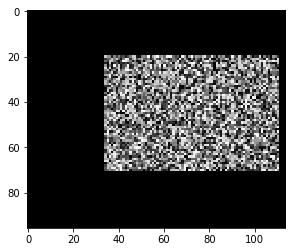

Iteration 221. Loss -369126.71875


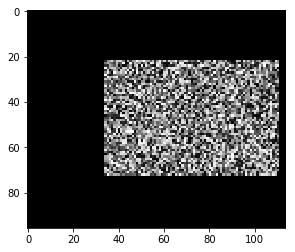

Iteration 222. Loss -369126.71875


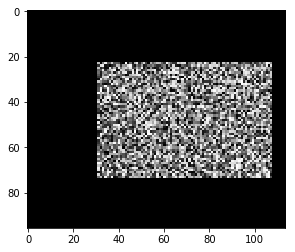

Iteration 223. Loss -373826.6875


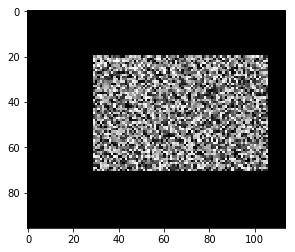

Iteration 224. Loss -373826.71875


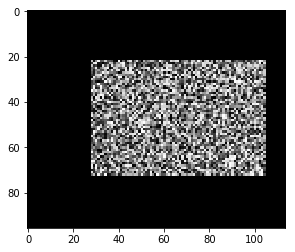

Iteration 225. Loss -373826.6875


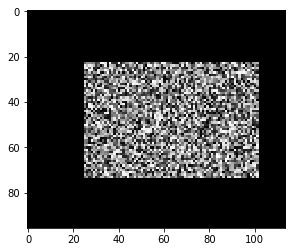

Iteration 226. Loss -373826.6875


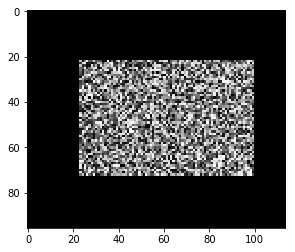

Iteration 227. Loss -373826.6875


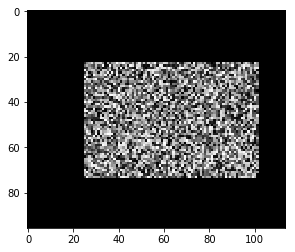

Iteration 228. Loss -373826.6875


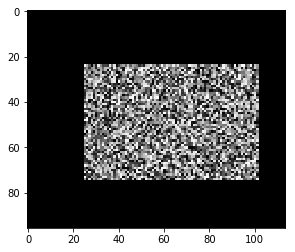

Iteration 229. Loss -373826.65625


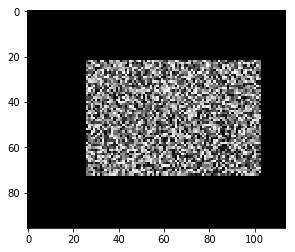

Iteration 230. Loss -373826.6875


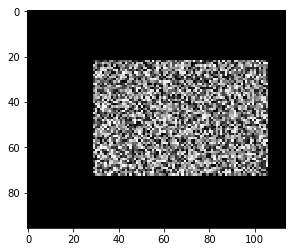

Iteration 231. Loss -373826.71875


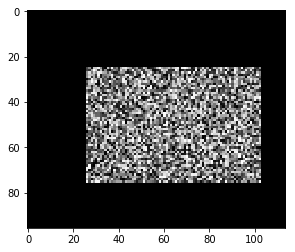

Iteration 232. Loss -373826.65625


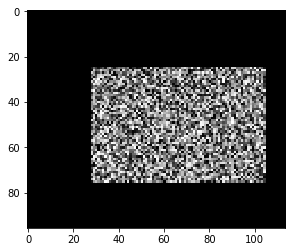

Iteration 233. Loss -373826.6875


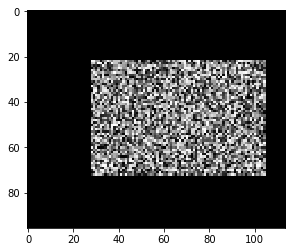

Iteration 234. Loss -370471.5625


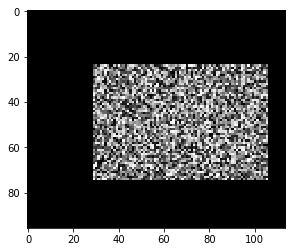

Iteration 235. Loss -373826.6875


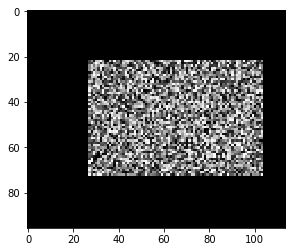

Iteration 236. Loss -373826.71875


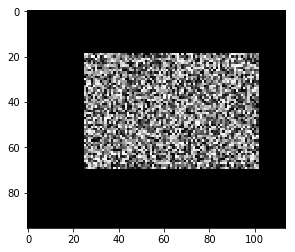

Iteration 237. Loss -370471.5625


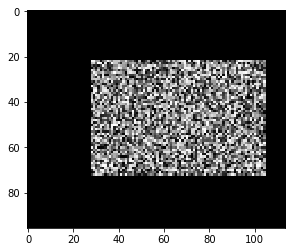

Iteration 238. Loss -370471.5625


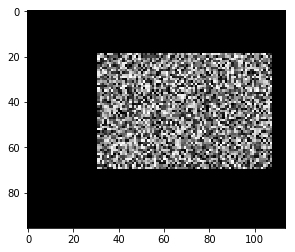

Iteration 239. Loss -362915.625


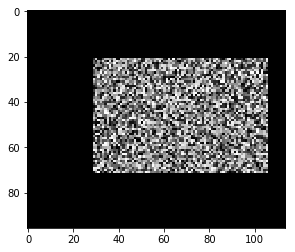

Iteration 240. Loss -366732.5


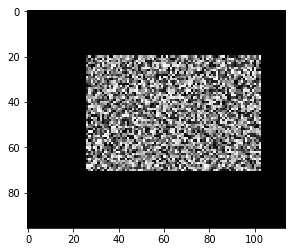

Iteration 241. Loss -366732.5


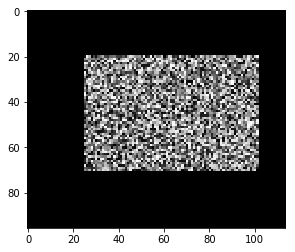

Iteration 242. Loss -373826.6875


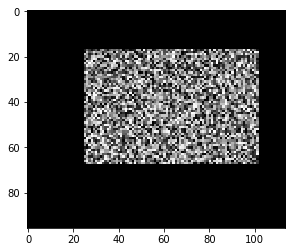

Iteration 243. Loss -373826.71875


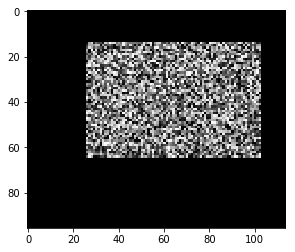

Iteration 244. Loss -373826.65625


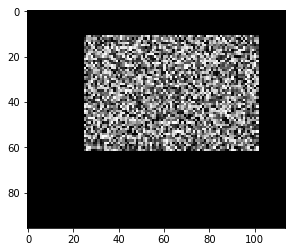

Iteration 245. Loss -373826.65625


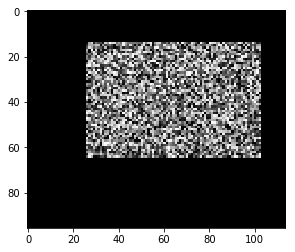

Iteration 246. Loss -373826.65625


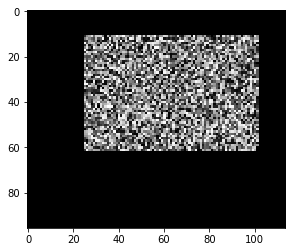

Iteration 247. Loss -373826.6875


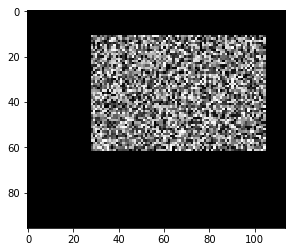

Iteration 248. Loss -373826.71875


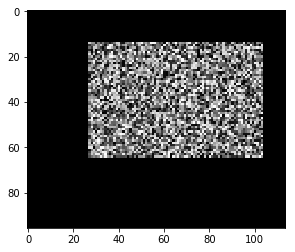

Iteration 249. Loss -373826.71875


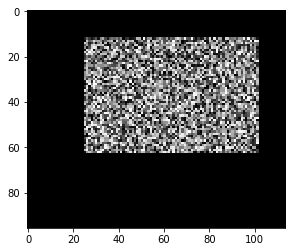

Iteration 250. Loss -373826.65625


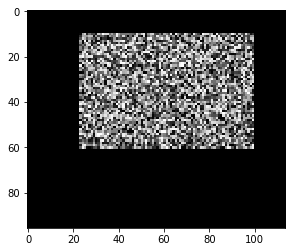

Iteration 251. Loss -373826.71875


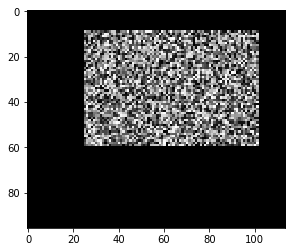

Iteration 252. Loss -373826.71875


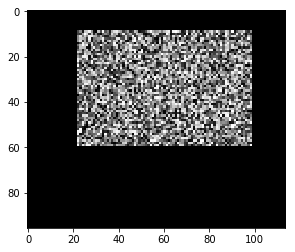

Iteration 253. Loss -373826.71875


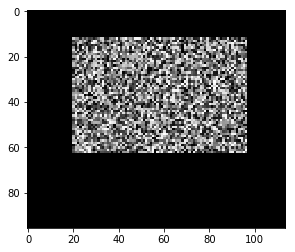

Iteration 254. Loss -373826.71875


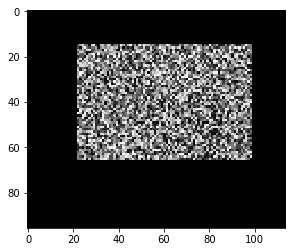

Iteration 255. Loss -373826.6875


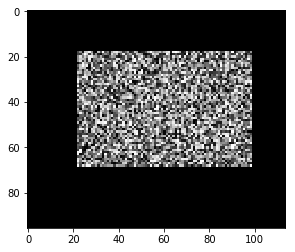

Iteration 256. Loss -373826.71875


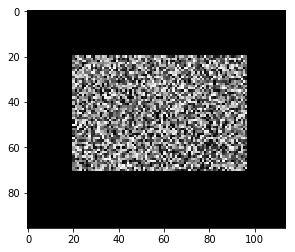

Iteration 257. Loss -373826.71875


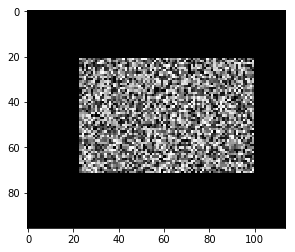

Iteration 258. Loss -373826.6875


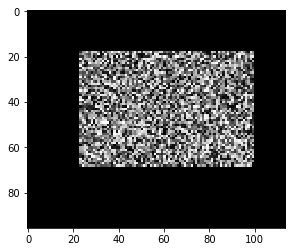

Iteration 259. Loss -373826.6875


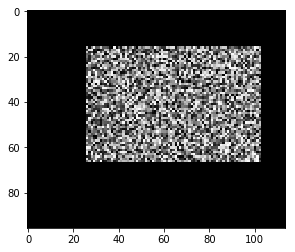

Iteration 260. Loss -373826.65625


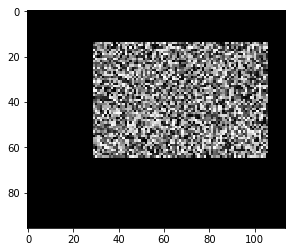

Iteration 261. Loss -373826.6875


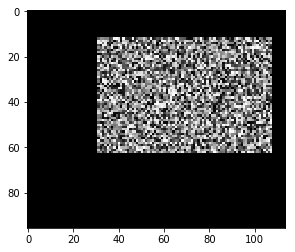

Iteration 262. Loss -373826.6875


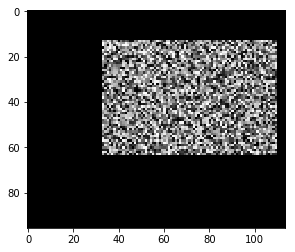

Iteration 263. Loss -371854.375


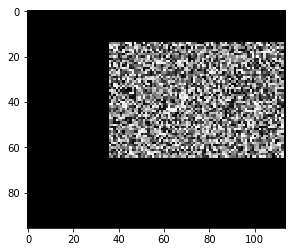

Iteration 264. Loss -363338.46875


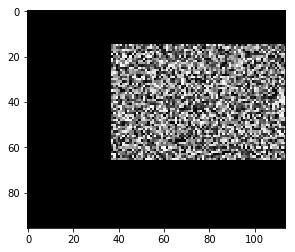

Iteration 265. Loss -360388.03125


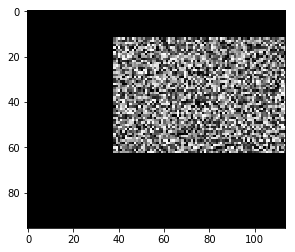

Iteration 266. Loss -357424.53125


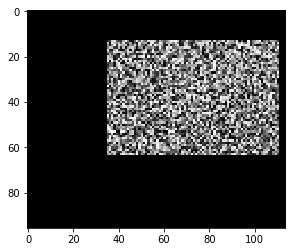

Iteration 267. Loss -366153.125


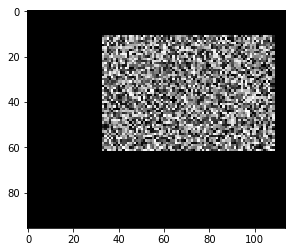

Iteration 268. Loss -370862.75


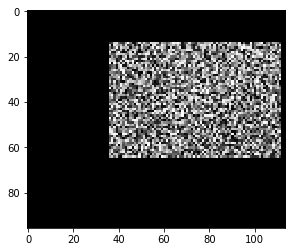

Iteration 269. Loss -363285.625


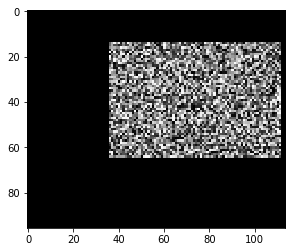

Iteration 270. Loss -363285.59375


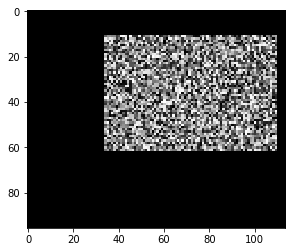

Iteration 271. Loss -368879.3125


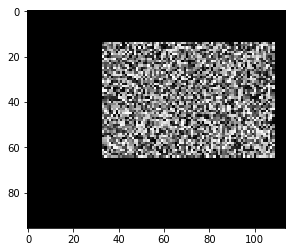

Iteration 272. Loss -370862.71875


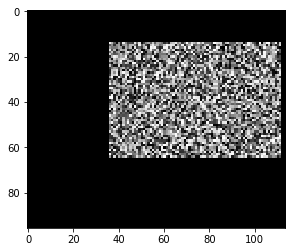

Iteration 273. Loss -363285.625


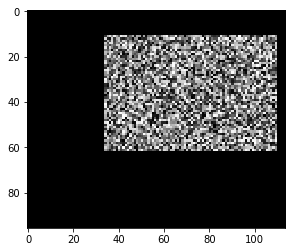

Iteration 274. Loss -368879.3125


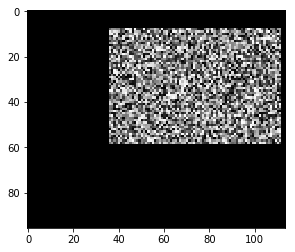

Iteration 275. Loss -363285.59375


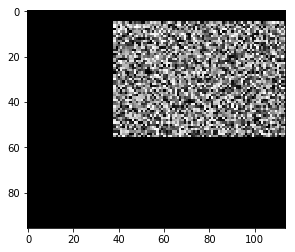

Iteration 276. Loss -357424.53125


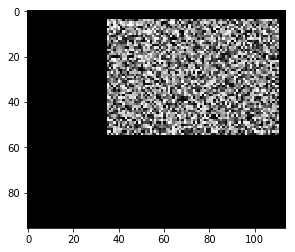

Iteration 277. Loss -362455.03125


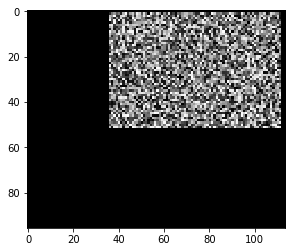

Iteration 278. Loss -347510.5


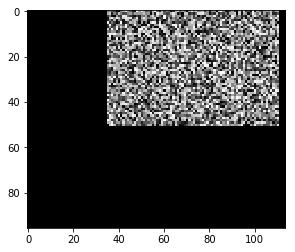

Iteration 279. Loss -346012.0625


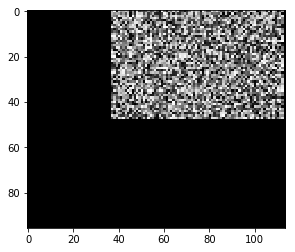

Iteration 280. Loss -328438.34375


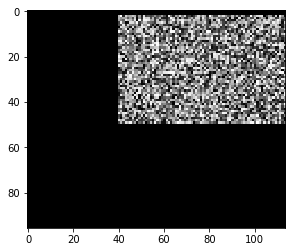

Iteration 281. Loss -328651.09375


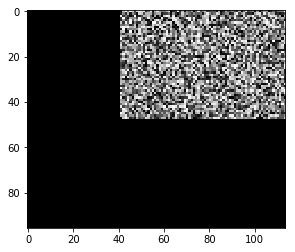

Iteration 282. Loss -318288.53125


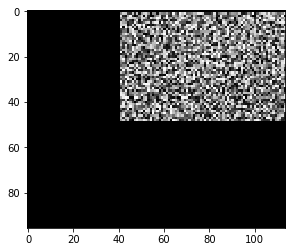

Iteration 283. Loss -322154.03125


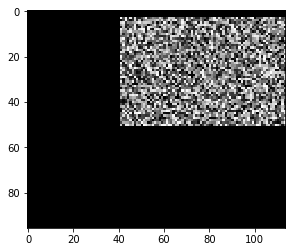

Iteration 284. Loss -329803.71875


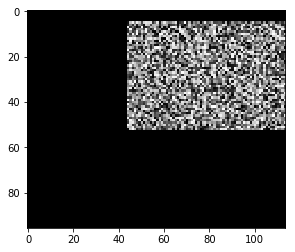

Iteration 285. Loss -328562.125


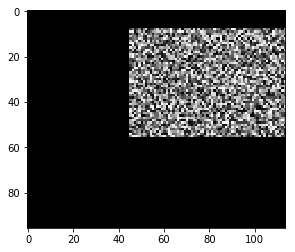

Iteration 286. Loss -325767.40625


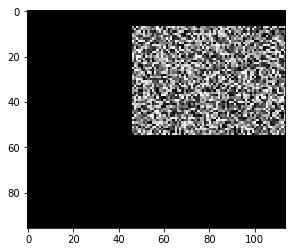

Iteration 287. Loss -322964.3125


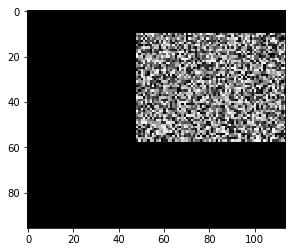

Iteration 288. Loss -317355.46875


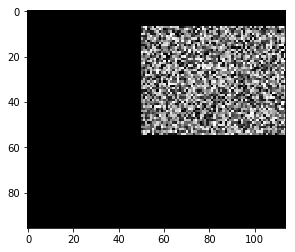

Iteration 289. Loss -311754.0625


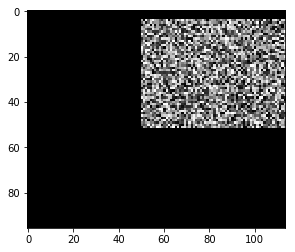

Iteration 290. Loss -308752.4375


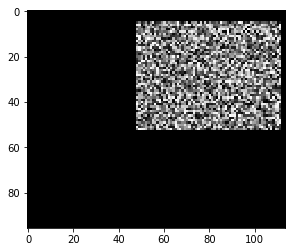

Iteration 291. Loss -317290.875


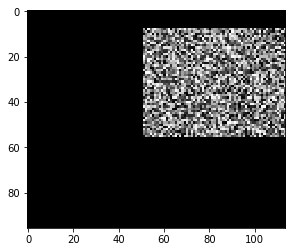

Iteration 292. Loss -308951.875


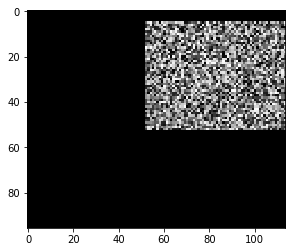

Iteration 293. Loss -306145.9375


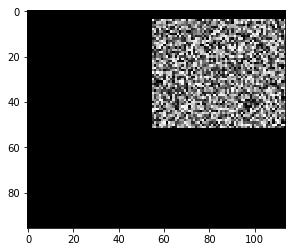

Iteration 294. Loss -294960.125


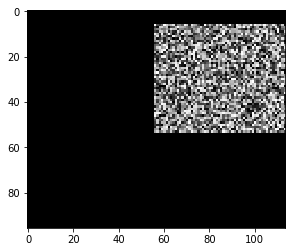

Iteration 295. Loss -294916.65625


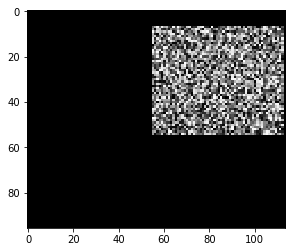

Iteration 296. Loss -297706.96875


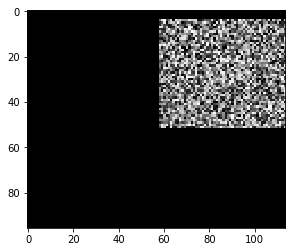

Iteration 297. Loss -286694.4375


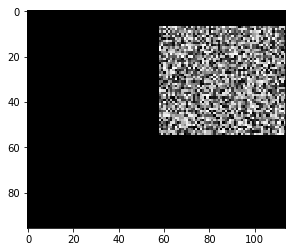

Iteration 298. Loss -289307.1875


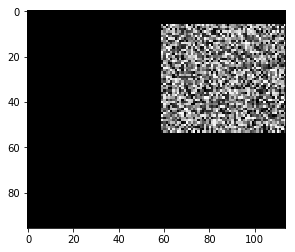

Iteration 299. Loss -286506.3125


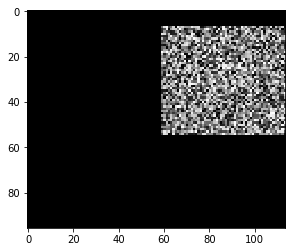

Iteration 300. Loss -286506.3125


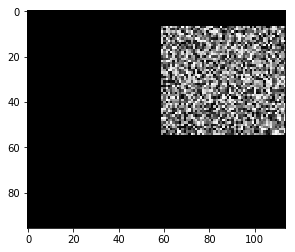

Iteration 301. Loss -286506.3125


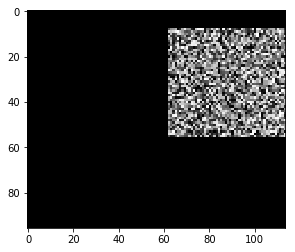

Iteration 302. Loss -278113.6875


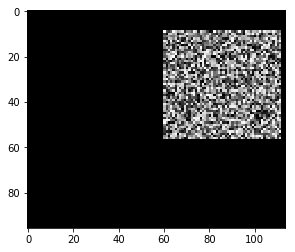

Iteration 303. Loss -283647.21875


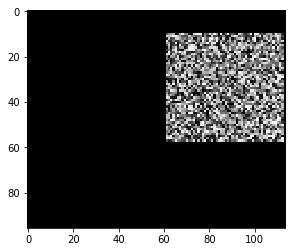

Iteration 304. Loss -280896.09375


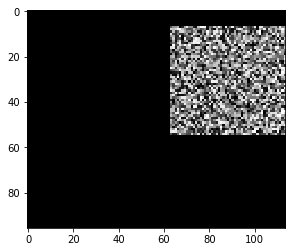

Iteration 305. Loss -275315.46875


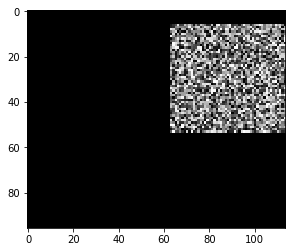

Iteration 306. Loss -275315.46875


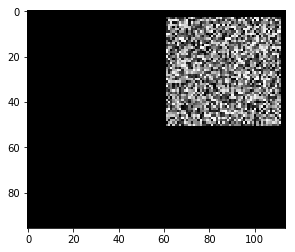

Iteration 307. Loss -275717.25


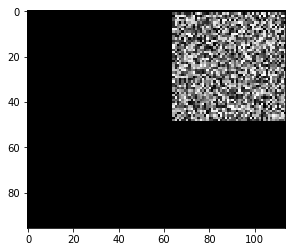

Iteration 308. Loss -262439.09375


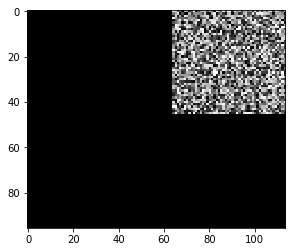

Iteration 309. Loss -254473.140625


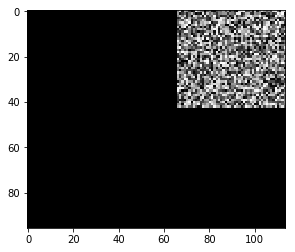

Iteration 310. Loss -241953.71875


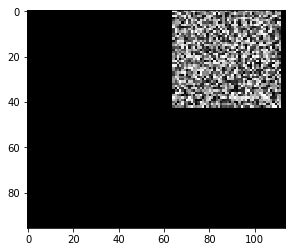

Iteration 311. Loss -243921.46875


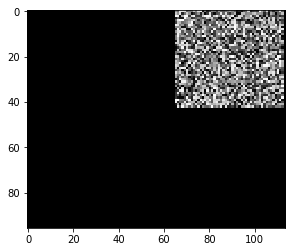

Iteration 312. Loss -241271.640625


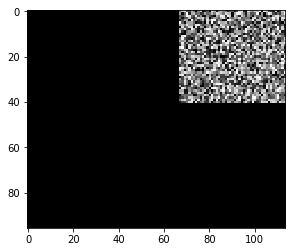

Iteration 313. Loss -227312.296875


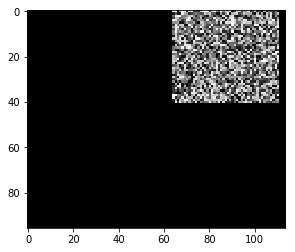

Iteration 314. Loss -238282.171875


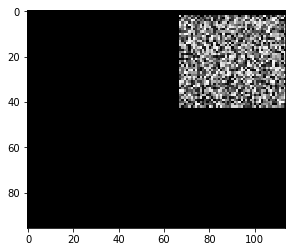

Iteration 315. Loss -239635.0625


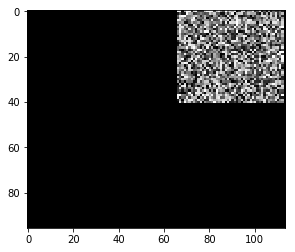

Iteration 316. Loss -234093.234375


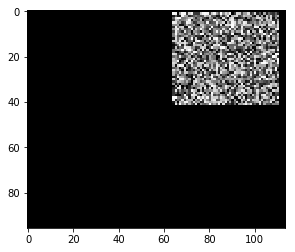

Iteration 317. Loss -240864.0


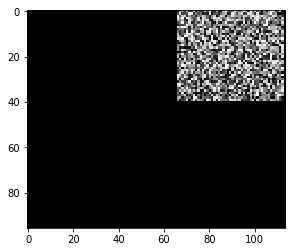

Iteration 318. Loss -234293.625


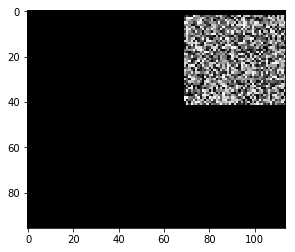

Iteration 319. Loss -230067.5625


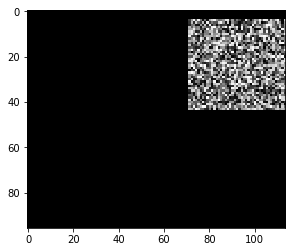

Iteration 320. Loss -228623.5625


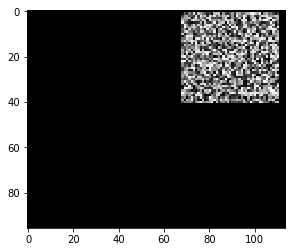

Iteration 321. Loss -230243.703125


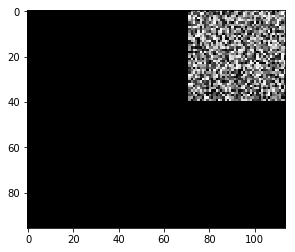

Iteration 322. Loss -223717.796875


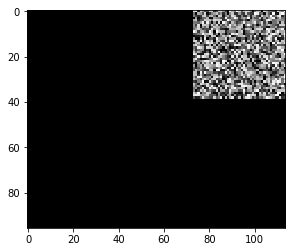

Iteration 323. Loss -217315.5625


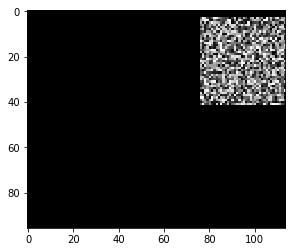

Iteration 324. Loss -217098.4375


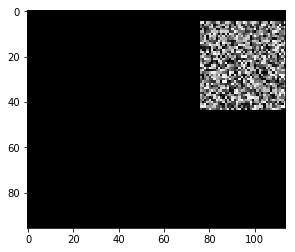

Iteration 325. Loss -220761.1875


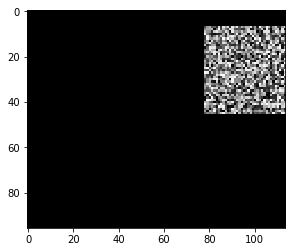

Iteration 326. Loss -214332.46875


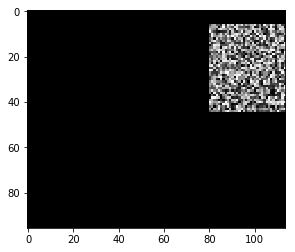

Iteration 327. Loss -209792.484375


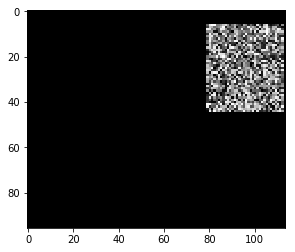

Iteration 328. Loss -211725.4375


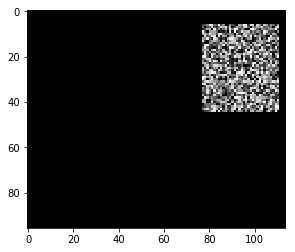

Iteration 329. Loss -212320.484375


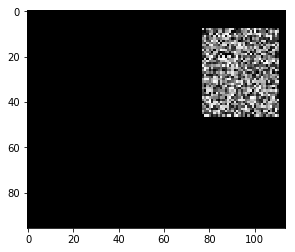

Iteration 330. Loss -209592.625


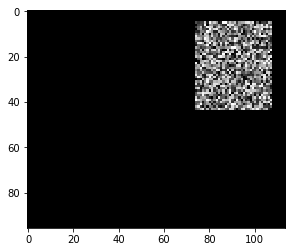

Iteration 331. Loss -216940.625


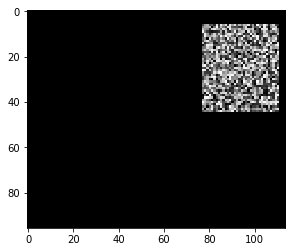

Iteration 332. Loss -215523.859375


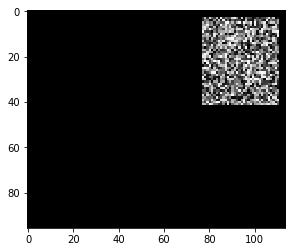

Iteration 333. Loss -210411.65625


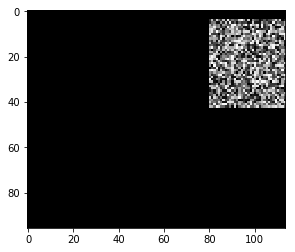

Iteration 334. Loss -205746.890625


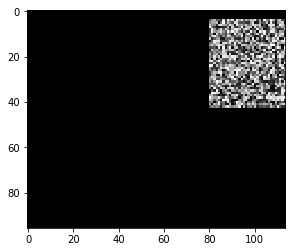

Iteration 335. Loss -207413.171875


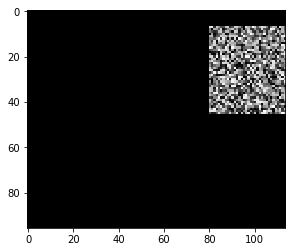

Iteration 336. Loss -208919.65625


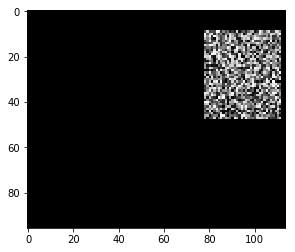

Iteration 337. Loss -213359.328125


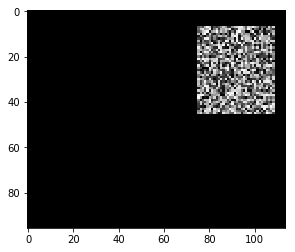

Iteration 338. Loss -219022.828125


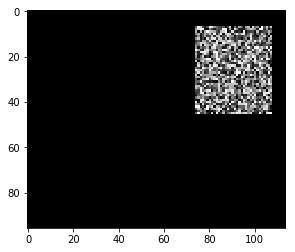

Iteration 339. Loss -219022.828125


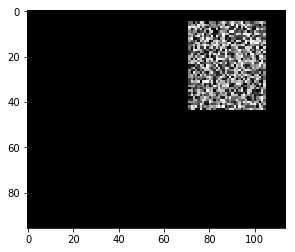

Iteration 340. Loss -219022.828125


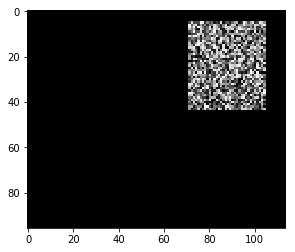

Iteration 341. Loss -219022.828125


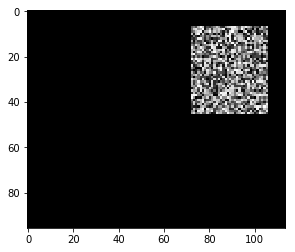

Iteration 342. Loss -219022.828125


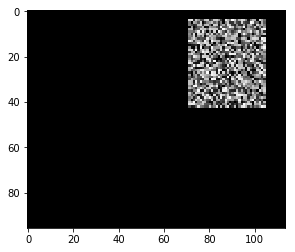

Iteration 343. Loss -217358.671875


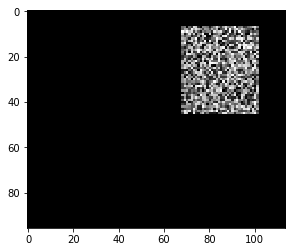

Iteration 344. Loss -219022.828125


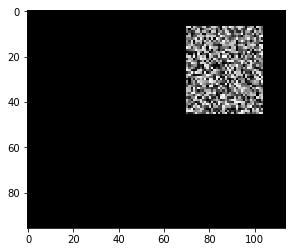

Iteration 345. Loss -219022.828125


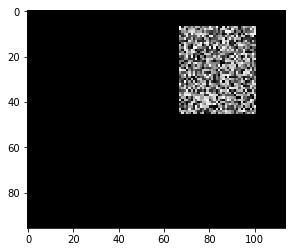

Iteration 346. Loss -219022.828125


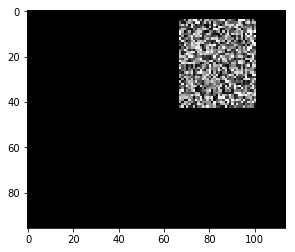

Iteration 347. Loss -217358.671875


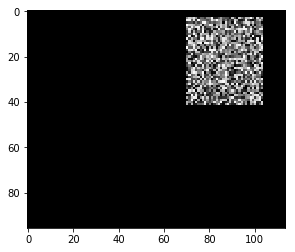

Iteration 348. Loss -215524.203125


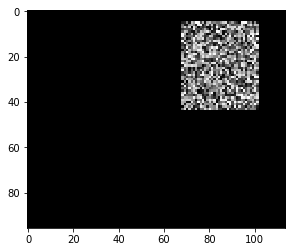

Iteration 349. Loss -219022.828125


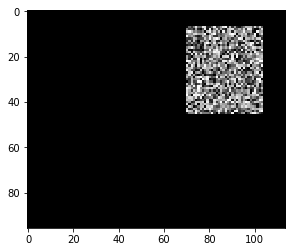

Iteration 350. Loss -219022.828125


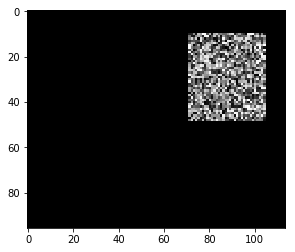

Iteration 351. Loss -219022.828125


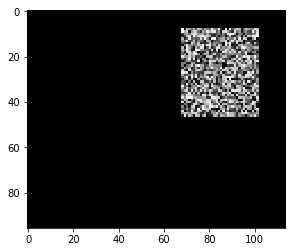

Iteration 352. Loss -219022.828125


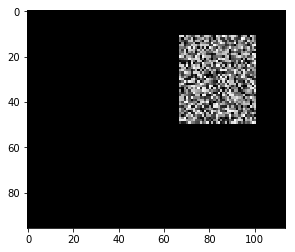

Iteration 353. Loss -219022.828125


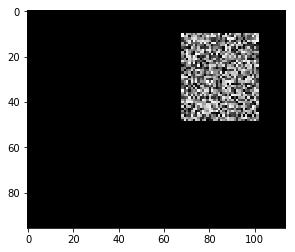

Iteration 354. Loss -219022.828125


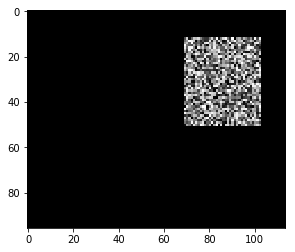

Iteration 355. Loss -219022.828125


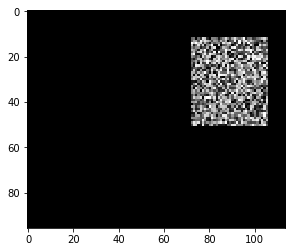

Iteration 356. Loss -219022.8125


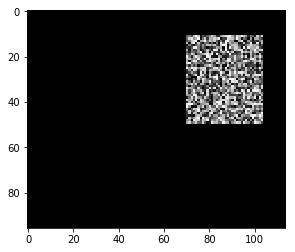

Iteration 357. Loss -219022.828125


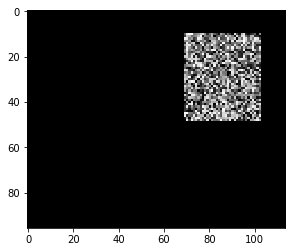

Iteration 358. Loss -219022.828125


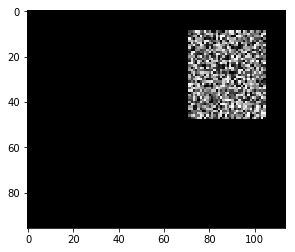

Iteration 359. Loss -215673.828125


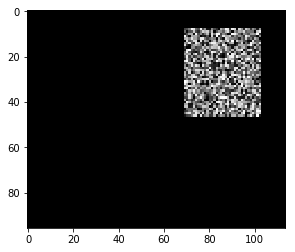

Iteration 360. Loss -215673.828125


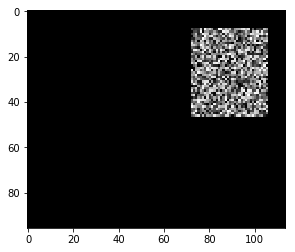

Iteration 361. Loss -216940.625


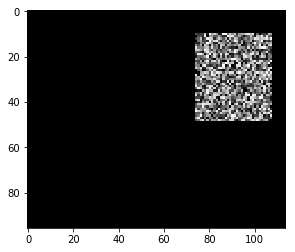

Iteration 362. Loss -216940.625


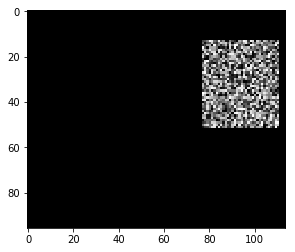

Iteration 363. Loss -212254.34375


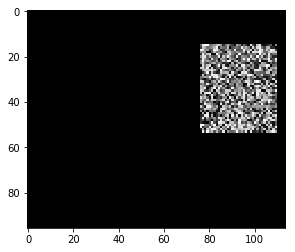

Iteration 364. Loss -217563.15625


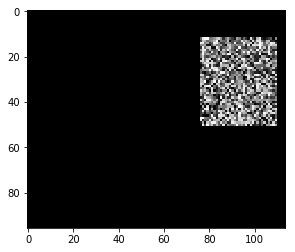

Iteration 365. Loss -217563.15625


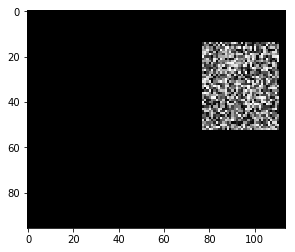

Iteration 366. Loss -213823.203125


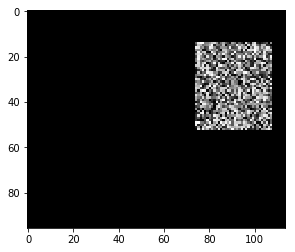

Iteration 367. Loss -219022.828125


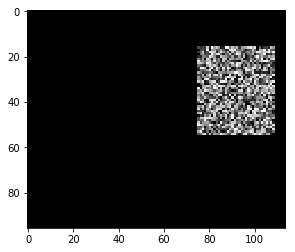

Iteration 368. Loss -216940.625


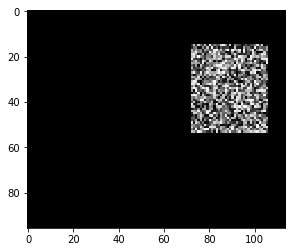

Iteration 369. Loss -217316.703125


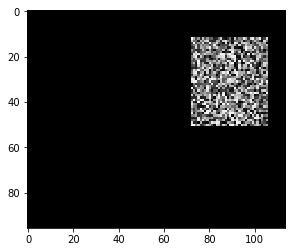

Iteration 370. Loss -214311.53125


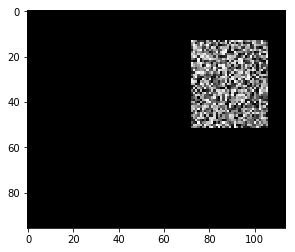

Iteration 371. Loss -211471.53125


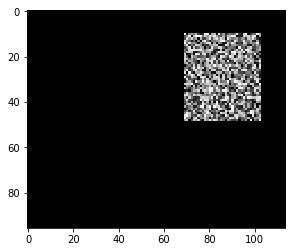

Iteration 372. Loss -208616.6875


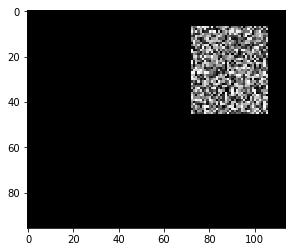

Iteration 373. Loss -207187.828125


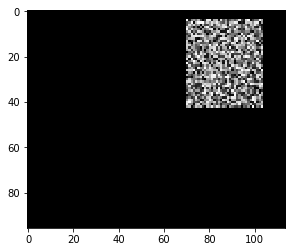

Iteration 374. Loss -207099.140625


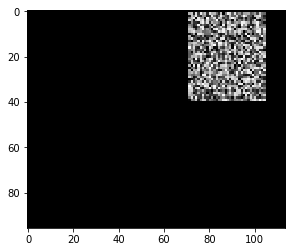

Iteration 375. Loss -198116.734375


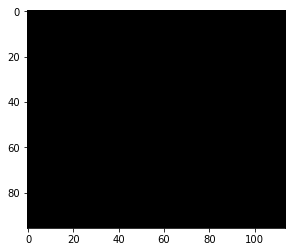

Iteration 376. Loss -194210.40625


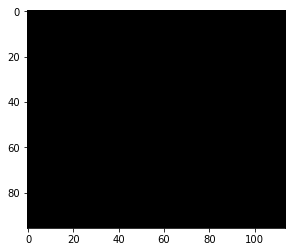

Iteration 377. Loss -185996.28125


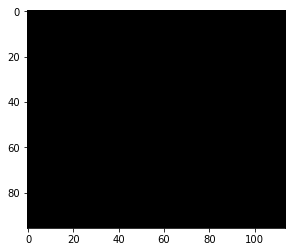

Iteration 378. Loss -186332.0625


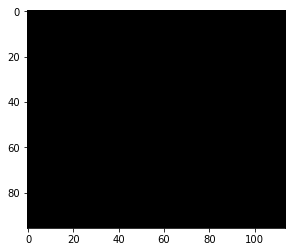

Iteration 379. Loss -187587.15625


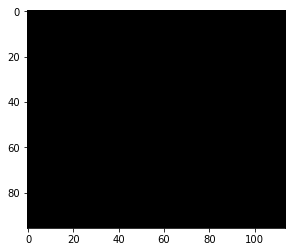

Iteration 380. Loss -191378.015625


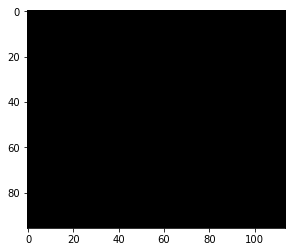

Iteration 381. Loss -188799.34375


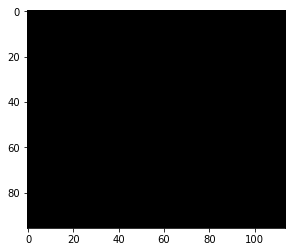

Iteration 382. Loss -187369.1875


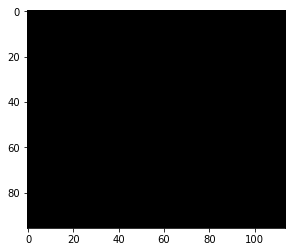

Iteration 383. Loss -187642.875


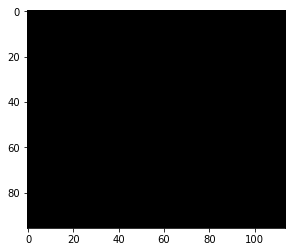

Iteration 384. Loss -187532.5625


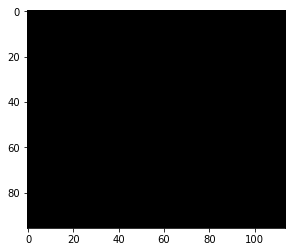

Iteration 385. Loss -187434.09375


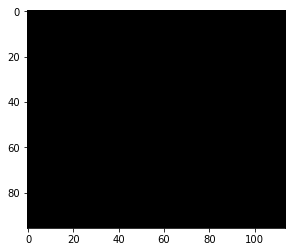

Iteration 386. Loss -187610.703125


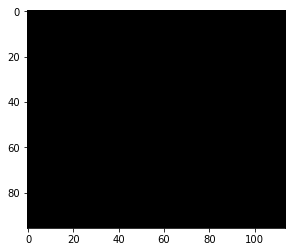

Iteration 387. Loss -191291.109375


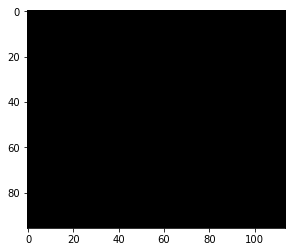

Iteration 388. Loss -190071.953125


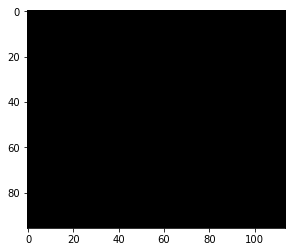

Iteration 389. Loss -189136.3125


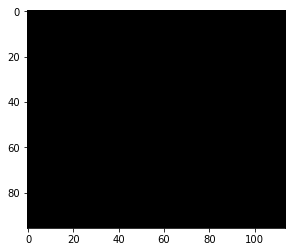

Iteration 390. Loss -190700.359375


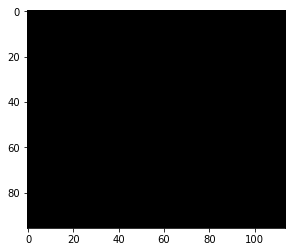

Iteration 391. Loss -189431.8125


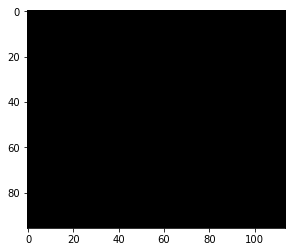

Iteration 392. Loss -189431.8125


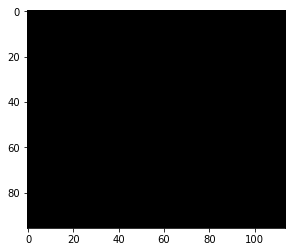

Iteration 393. Loss -183354.15625


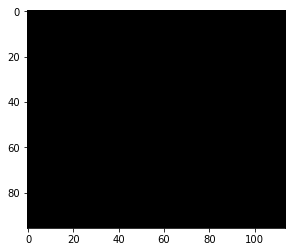

Iteration 394. Loss -184763.890625


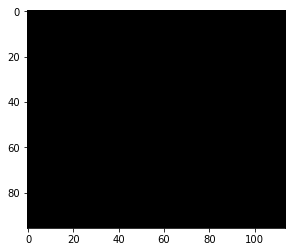

Iteration 395. Loss -186279.859375


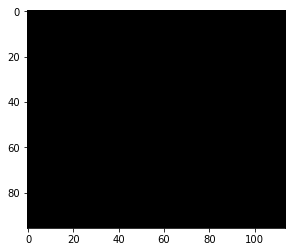

Iteration 396. Loss -188595.71875


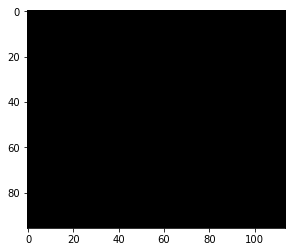

Iteration 397. Loss -186391.5625


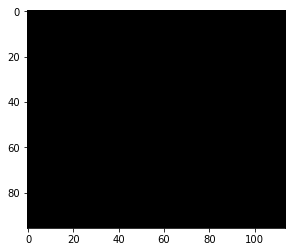

Iteration 398. Loss -187630.4375


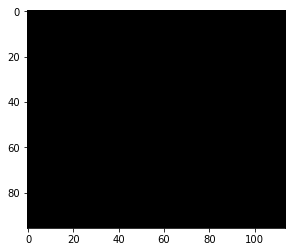

Iteration 399. Loss -184829.171875


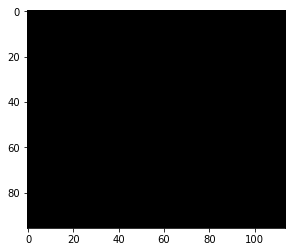

Iteration 400. Loss -177073.859375


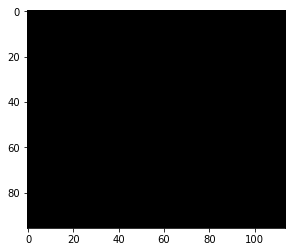

Iteration 401. Loss -178185.75


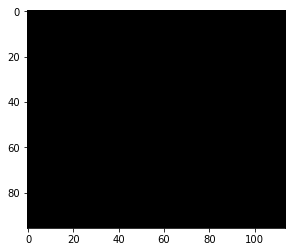

Iteration 402. Loss -172929.328125


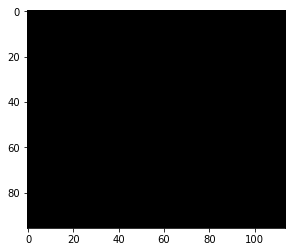

Iteration 403. Loss -177270.703125


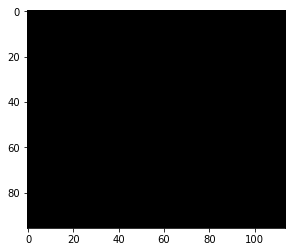

Iteration 404. Loss -180508.515625


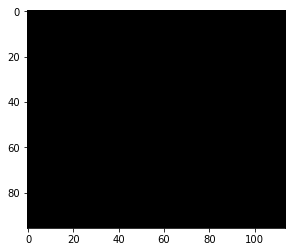

Iteration 405. Loss -183240.828125


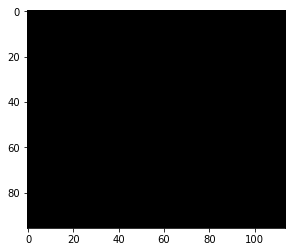

Iteration 406. Loss -184175.796875


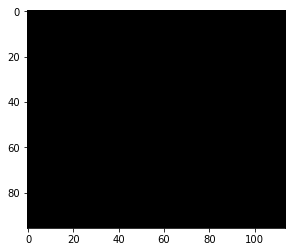

Iteration 407. Loss -184175.796875


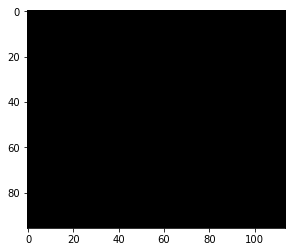

Iteration 408. Loss -184175.796875


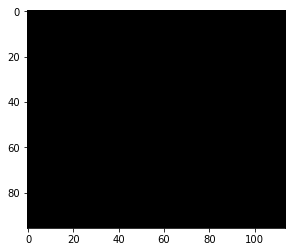

Iteration 409. Loss -184175.796875


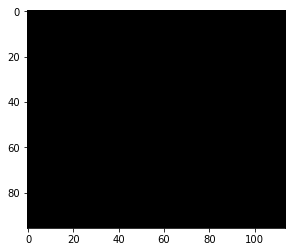

Iteration 410. Loss -184175.796875


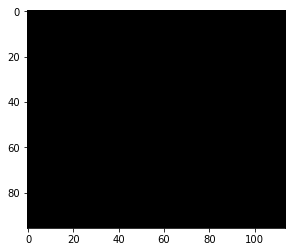

Iteration 411. Loss -184175.796875


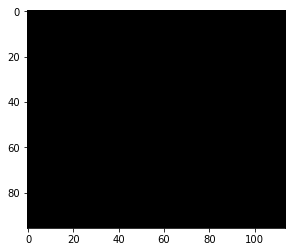

Iteration 412. Loss -183240.84375


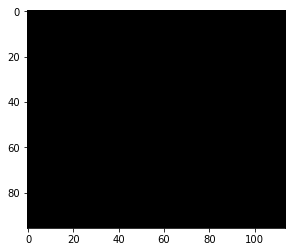

Iteration 413. Loss -181865.515625


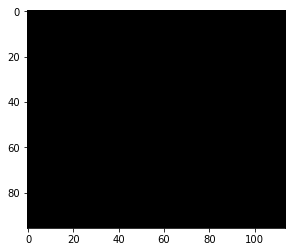

Iteration 414. Loss -183240.828125


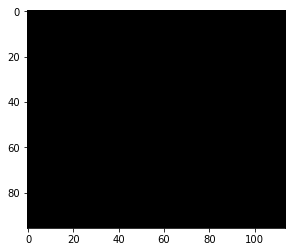

Iteration 415. Loss -180419.265625


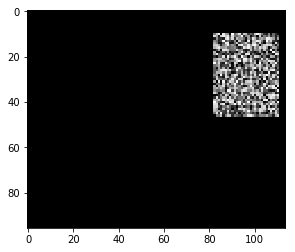

Iteration 416. Loss -181880.109375


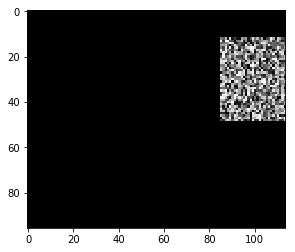

Iteration 417. Loss -177403.8125


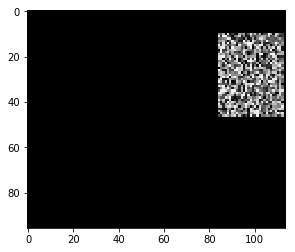

Iteration 418. Loss -178920.390625


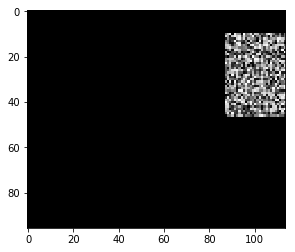

Iteration 419. Loss -174340.96875


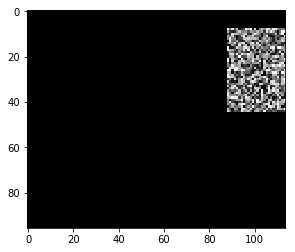

Iteration 420. Loss -172811.59375


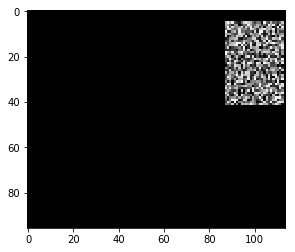

Iteration 421. Loss -174333.5


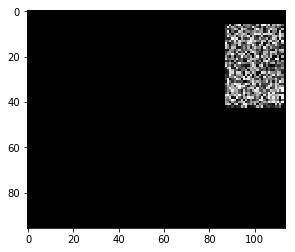

Iteration 422. Loss -174333.5


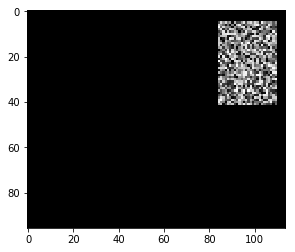

Iteration 423. Loss -178676.109375


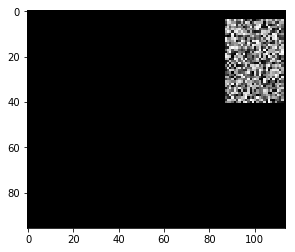

Iteration 424. Loss -173507.890625


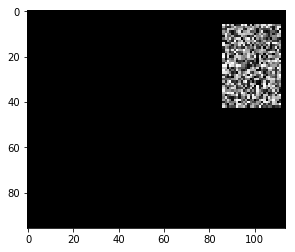

Iteration 425. Loss -175834.609375


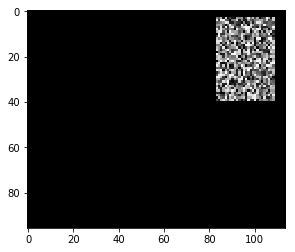

Iteration 426. Loss -177727.6875


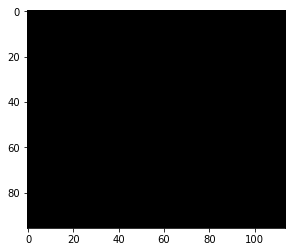

Iteration 427. Loss -172009.625


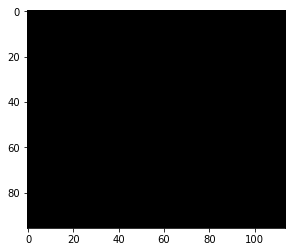

Iteration 428. Loss -177778.359375


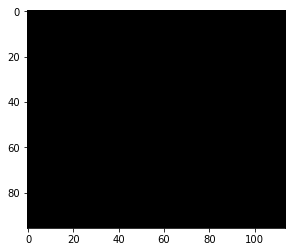

Iteration 429. Loss -175541.28125


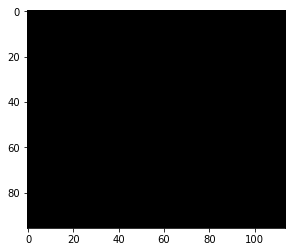

Iteration 430. Loss -177727.6875


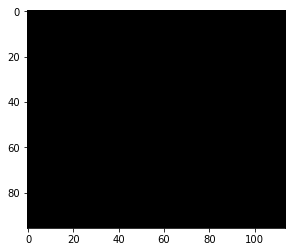

Iteration 431. Loss -176651.171875


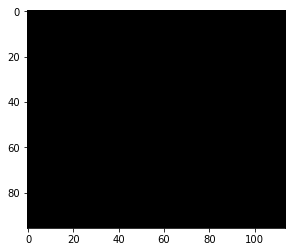

Iteration 432. Loss -178744.140625


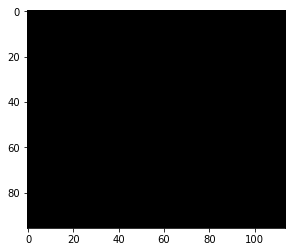

Iteration 433. Loss -176651.171875


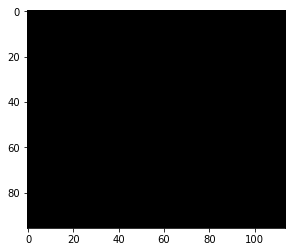

Iteration 434. Loss -176651.171875


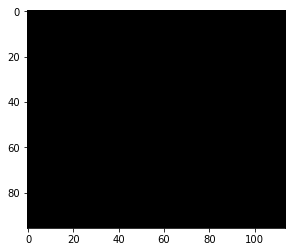

Iteration 435. Loss -175087.21875


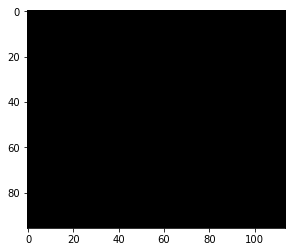

Iteration 436. Loss -176651.171875


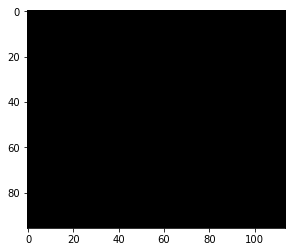

Iteration 437. Loss -174332.03125


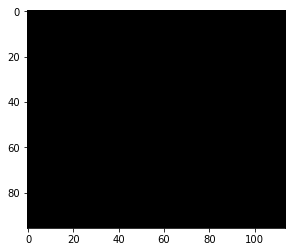

Iteration 438. Loss -174424.1875


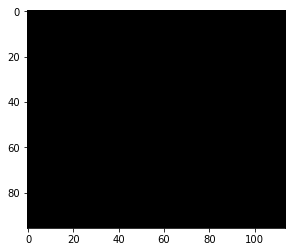

Iteration 439. Loss -176651.171875


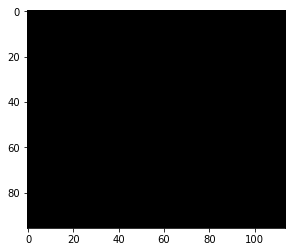

Iteration 440. Loss -177727.671875


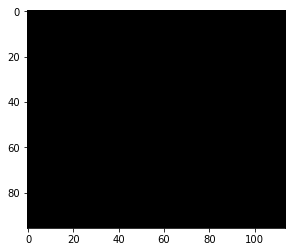

Iteration 441. Loss -178744.140625


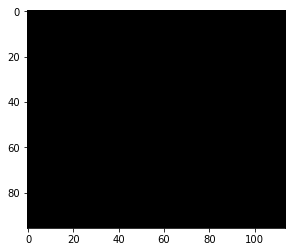

Iteration 442. Loss -179646.5


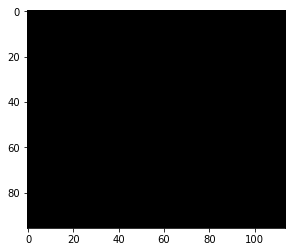

Iteration 443. Loss -179646.5


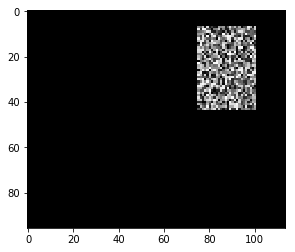

Iteration 444. Loss -179646.515625


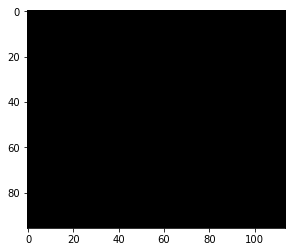

Iteration 445. Loss -179646.515625


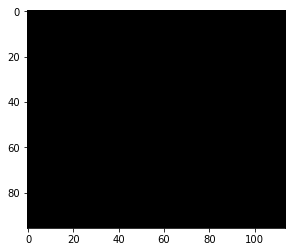

Iteration 446. Loss -179646.5


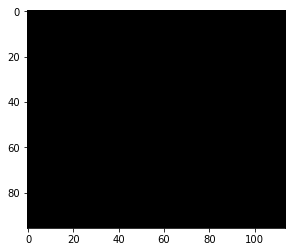

Iteration 447. Loss -176479.609375


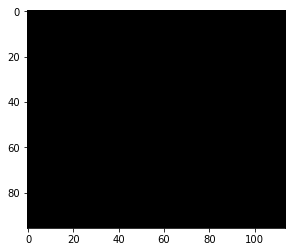

Iteration 448. Loss -177727.671875


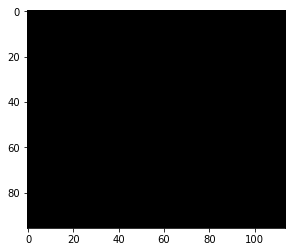

Iteration 449. Loss -177153.890625


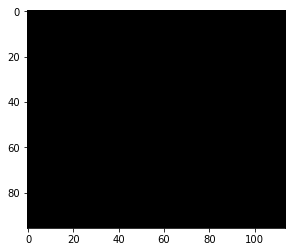

Iteration 450. Loss -171249.921875


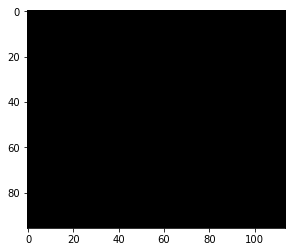

Iteration 451. Loss -173141.546875


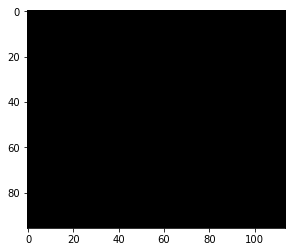

Iteration 452. Loss -176144.171875


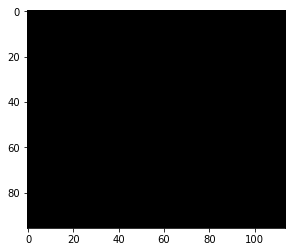

Iteration 453. Loss -176099.203125


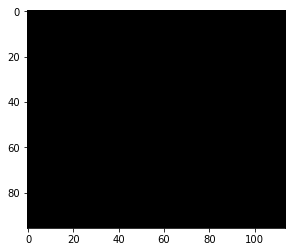

Iteration 454. Loss -177153.890625


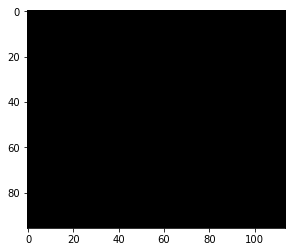

Iteration 455. Loss -176651.171875


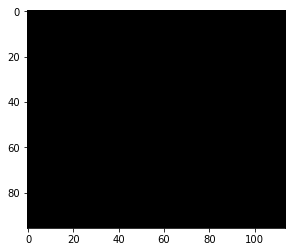

Iteration 456. Loss -178388.09375


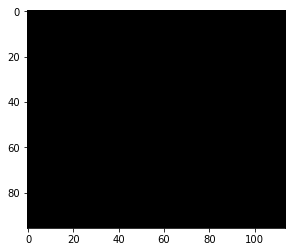

Iteration 457. Loss -176099.203125


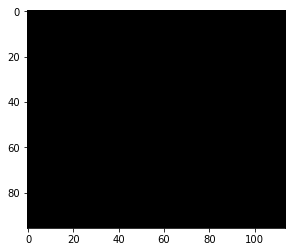

Iteration 458. Loss -177112.9375


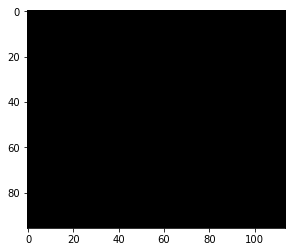

Iteration 459. Loss -175036.921875


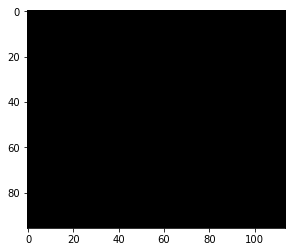

Iteration 460. Loss -173961.515625


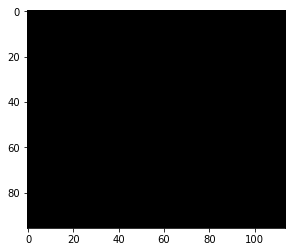

Iteration 461. Loss -176981.734375


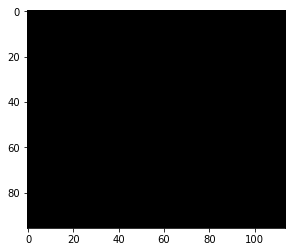

Iteration 462. Loss -176044.34375


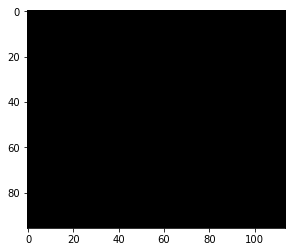

Iteration 463. Loss -176981.734375


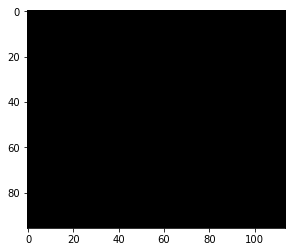

Iteration 464. Loss -177346.078125


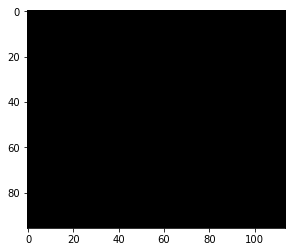

Iteration 465. Loss -178619.171875


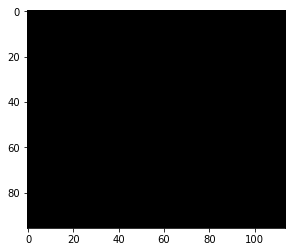

Iteration 466. Loss -178619.171875


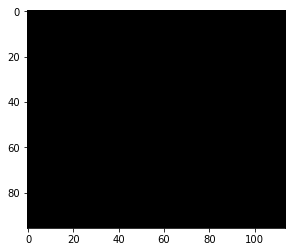

Iteration 467. Loss -178619.171875


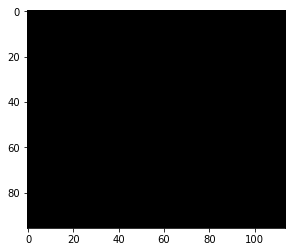

Iteration 468. Loss -178619.171875


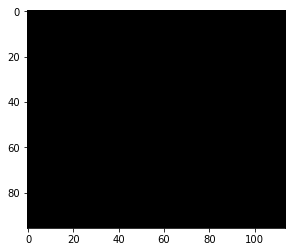

Iteration 469. Loss -178619.171875


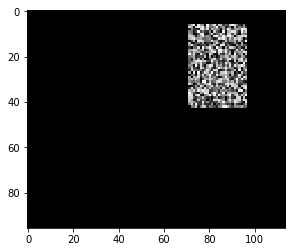

Iteration 470. Loss -178619.15625


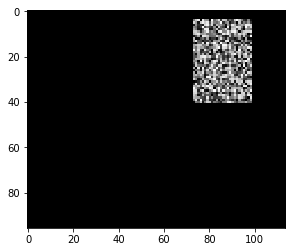

Iteration 471. Loss -177740.734375


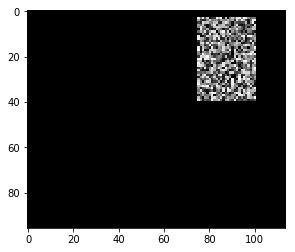

Iteration 472. Loss -176750.21875


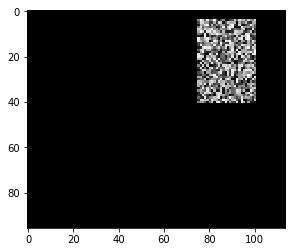

Iteration 473. Loss -177740.734375


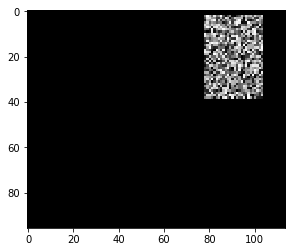

Iteration 474. Loss -175702.171875


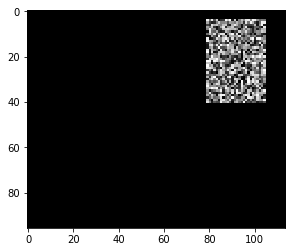

Iteration 475. Loss -177740.734375


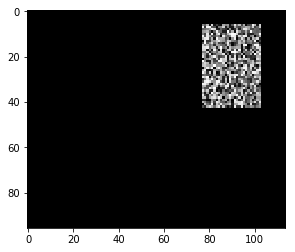

Iteration 476. Loss -178619.171875


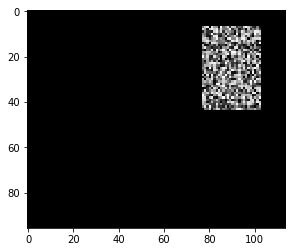

Iteration 477. Loss -178619.171875


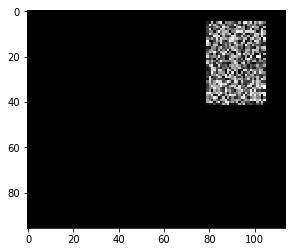

Iteration 478. Loss -178619.171875


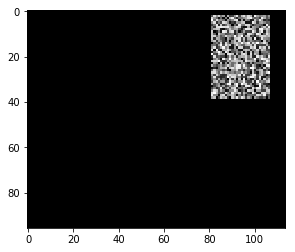

Iteration 479. Loss -175702.171875


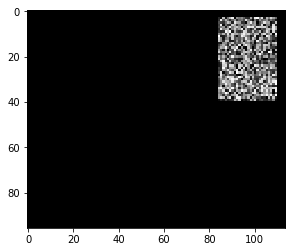

Iteration 480. Loss -175812.578125


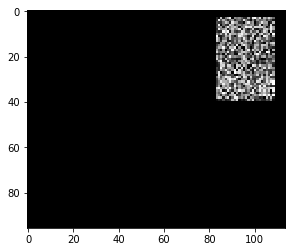

Iteration 481. Loss -176750.234375


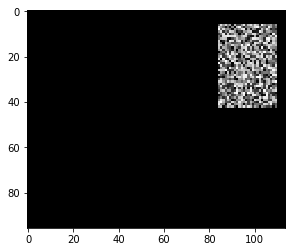

Iteration 482. Loss -177669.609375


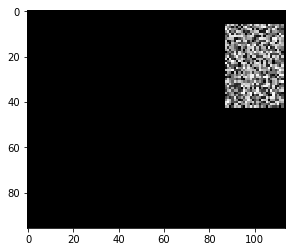

Iteration 483. Loss -173426.140625


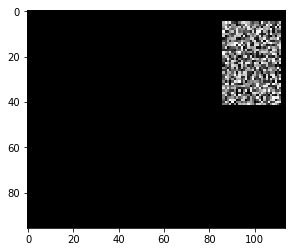

Iteration 484. Loss -174894.4375


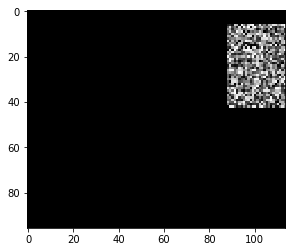

Iteration 485. Loss -171938.28125


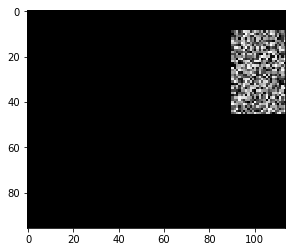

Iteration 486. Loss -168942.375


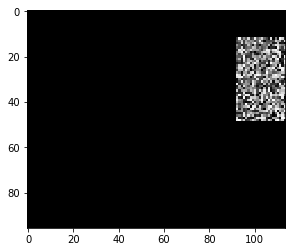

Iteration 487. Loss -165949.609375


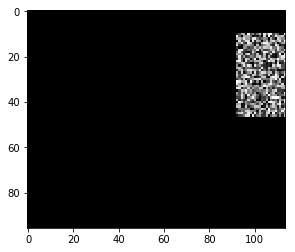

Iteration 488. Loss -165949.625


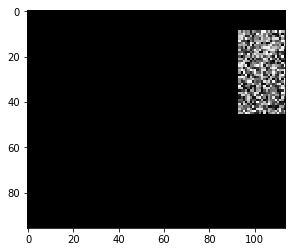

Iteration 489. Loss -164451.421875


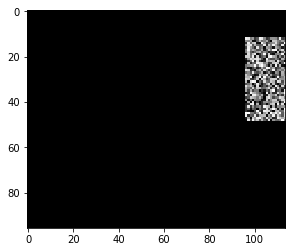

Iteration 490. Loss -159950.578125


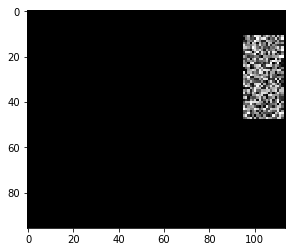

Iteration 491. Loss -161441.75


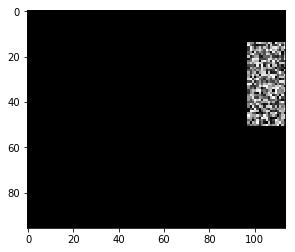

Iteration 492. Loss -158446.3125


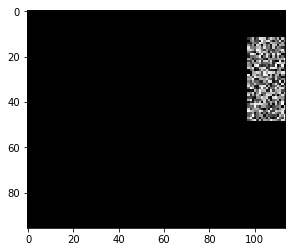

Iteration 493. Loss -158446.3125


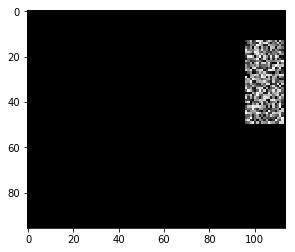

Iteration 494. Loss -159939.421875


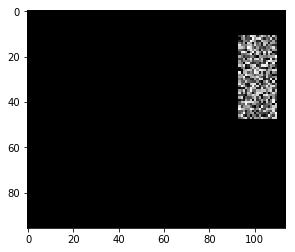

Iteration 495. Loss -164181.3125


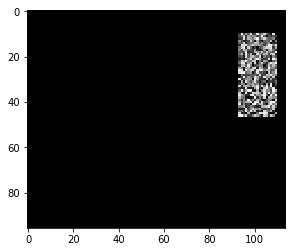

Iteration 496. Loss -164181.3125


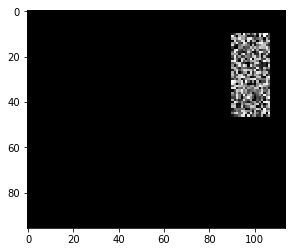

Iteration 497. Loss -165112.4375


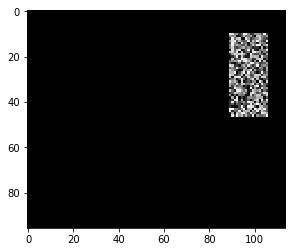

Iteration 498. Loss -165112.421875


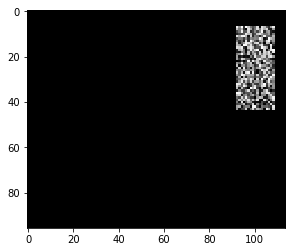

Iteration 499. Loss -165112.421875


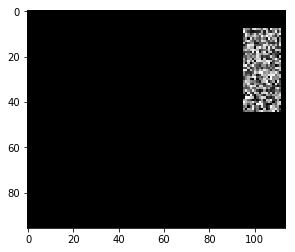

Iteration 500. Loss -161406.71875


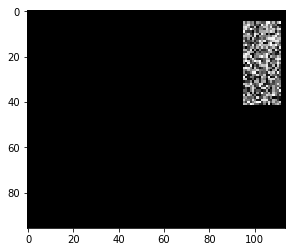

Iteration 501. Loss -161406.71875


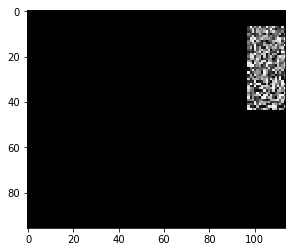

Iteration 502. Loss -158446.3125


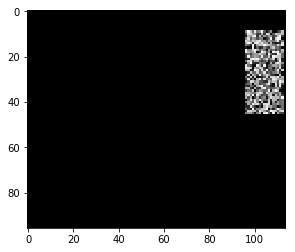

Iteration 503. Loss -159939.421875


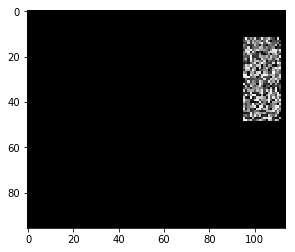

Iteration 504. Loss -161406.71875


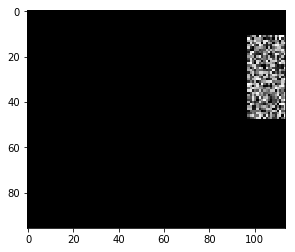

Iteration 505. Loss -158446.3125


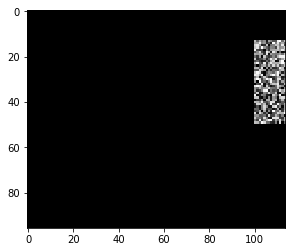

Iteration 506. Loss -153928.921875


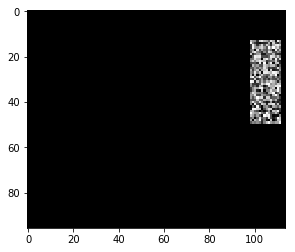

Iteration 507. Loss -156883.609375


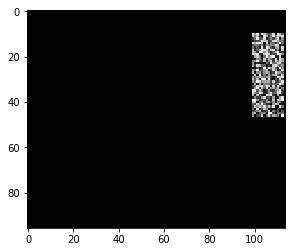

Iteration 508. Loss -155420.28125


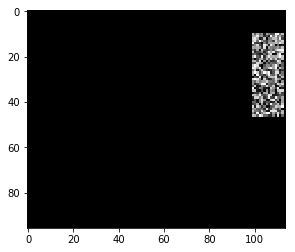

Iteration 509. Loss -155420.28125


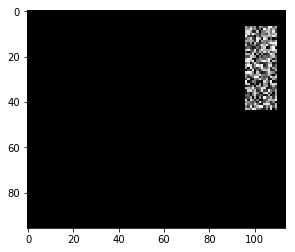

Iteration 510. Loss -159642.953125


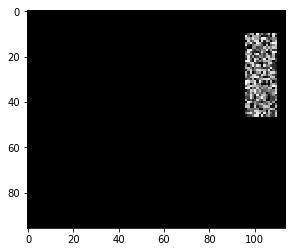

Iteration 511. Loss -159642.953125


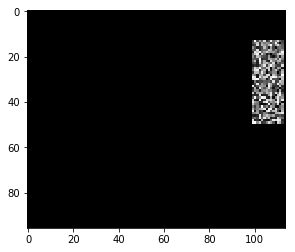

Iteration 512. Loss -155420.28125


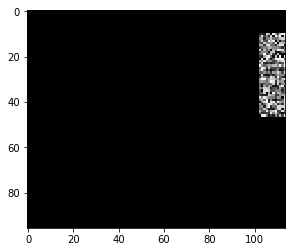

Iteration 513. Loss -150912.75


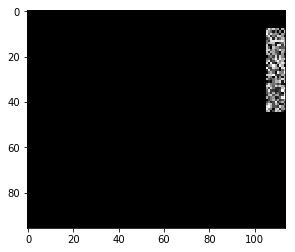

Iteration 514. Loss -146395.15625


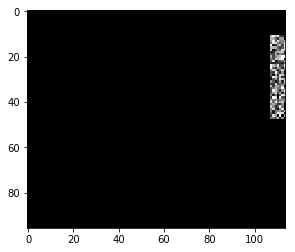

Iteration 515. Loss -143394.71875


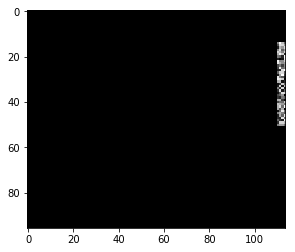

Iteration 516. Loss -138870.53125


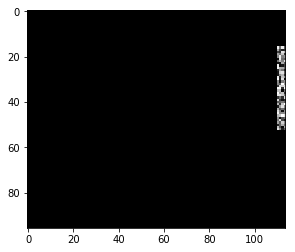

Iteration 517. Loss -138870.546875


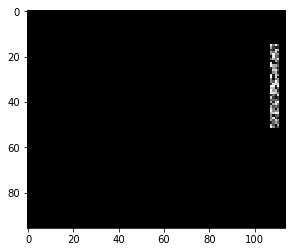

Iteration 518. Loss -143262.03125


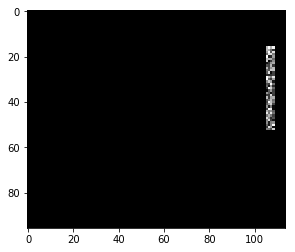

Iteration 519. Loss -145515.15625


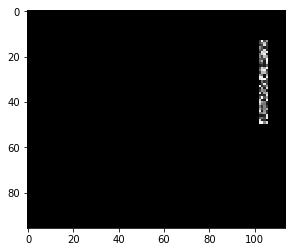

Iteration 520. Loss -145515.15625


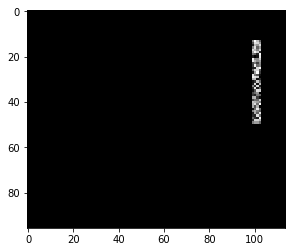

Iteration 521. Loss -145515.15625


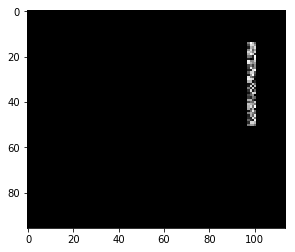

Iteration 522. Loss -145515.15625


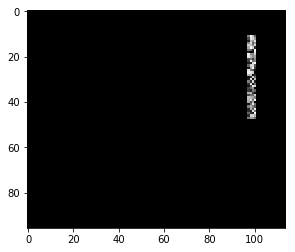

Iteration 523. Loss -145515.15625


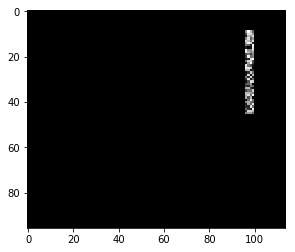

Iteration 524. Loss -145515.15625


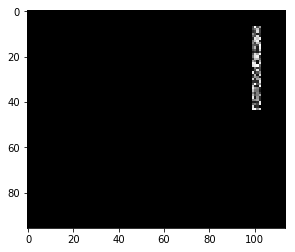

Iteration 525. Loss -145515.15625


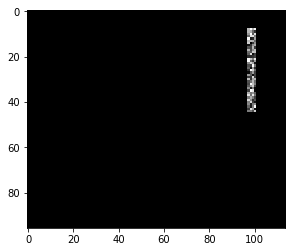

Iteration 526. Loss -145515.15625


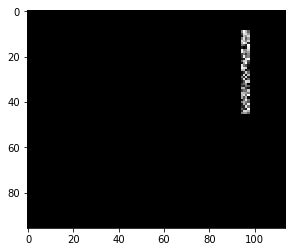

Iteration 527. Loss -145515.15625


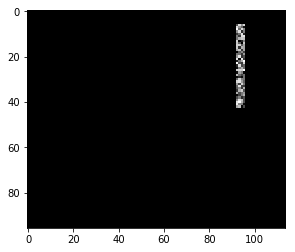

Iteration 528. Loss -145515.15625


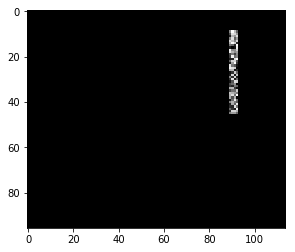

Iteration 529. Loss -145515.15625


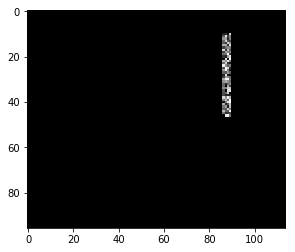

Iteration 530. Loss -145515.15625


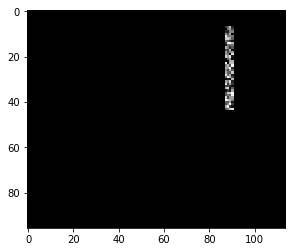

Iteration 531. Loss -145515.15625


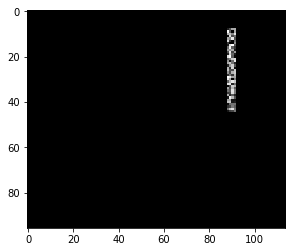

Iteration 532. Loss -145515.15625


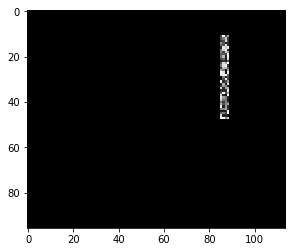

Iteration 533. Loss -145515.15625


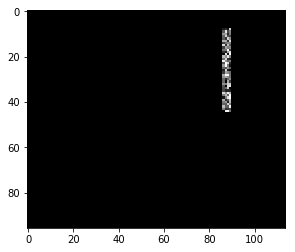

Iteration 534. Loss -145515.15625


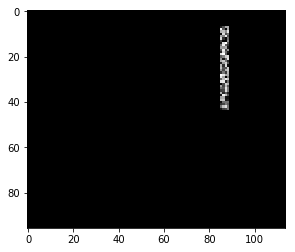

Iteration 535. Loss -145515.15625


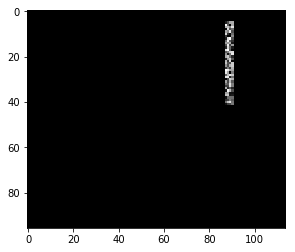

Iteration 536. Loss -145515.140625


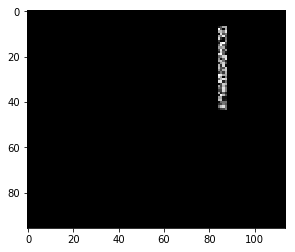

Iteration 537. Loss -145515.15625


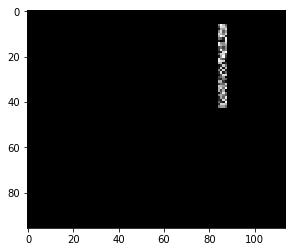

Iteration 538. Loss -145515.171875


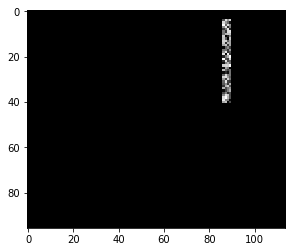

Iteration 539. Loss -145336.328125


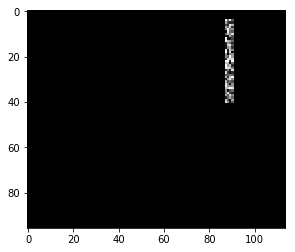

Iteration 540. Loss -145336.328125


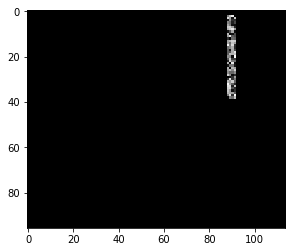

Iteration 541. Loss -144827.8125


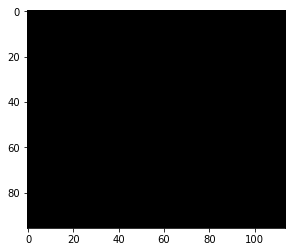

Iteration 542. Loss -145102.890625


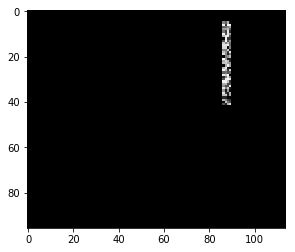

Iteration 543. Loss -145515.15625


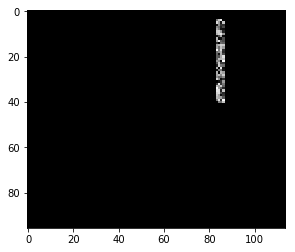

Iteration 544. Loss -145336.328125


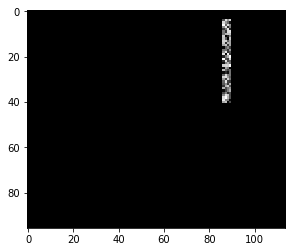

Iteration 545. Loss -145336.328125


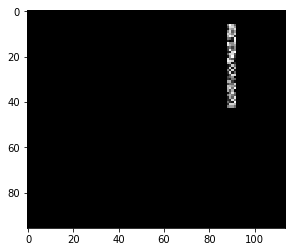

Iteration 546. Loss -145515.15625


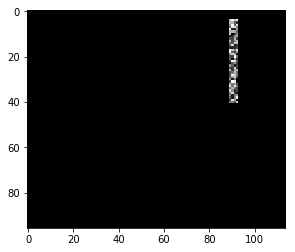

Iteration 547. Loss -145336.328125


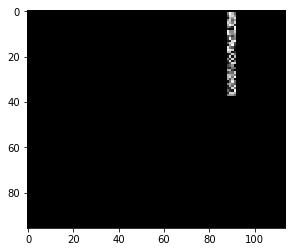

Iteration 548. Loss -144533.5625


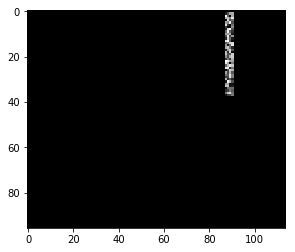

Iteration 549. Loss -144533.5625


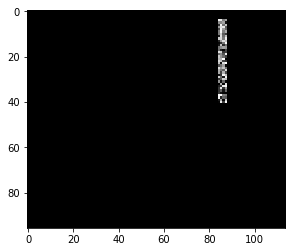

Iteration 550. Loss -145336.328125


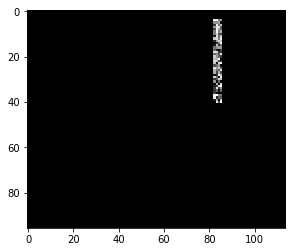

Iteration 551. Loss -145336.328125


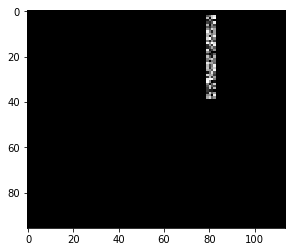

Iteration 552. Loss -144827.796875


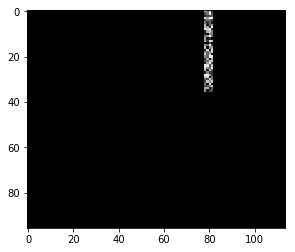

Iteration 553. Loss -143932.890625


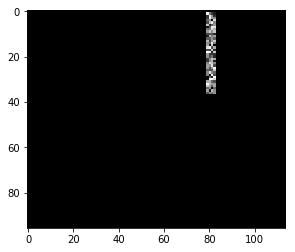

Iteration 554. Loss -144229.28125


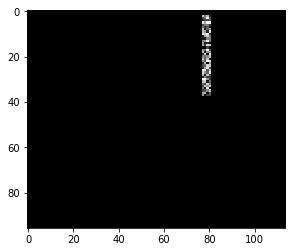

Iteration 555. Loss -144522.59375


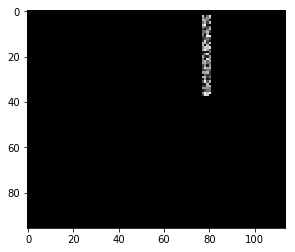

Iteration 556. Loss -144522.609375


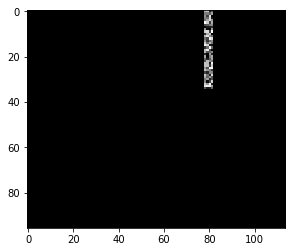

Iteration 557. Loss -143628.375


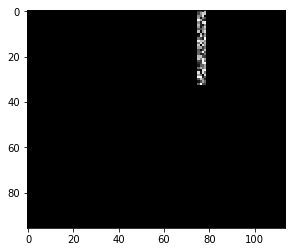

Iteration 558. Loss -143020.25


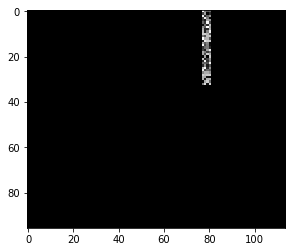

Iteration 559. Loss -143020.265625


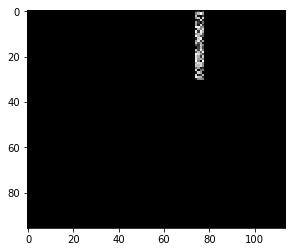

Iteration 560. Loss -142410.078125


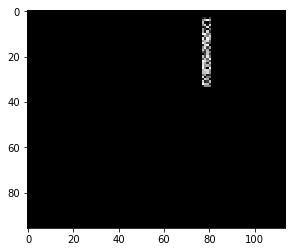

Iteration 561. Loss -143279.1875


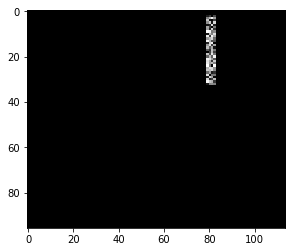

Iteration 562. Loss -143004.390625


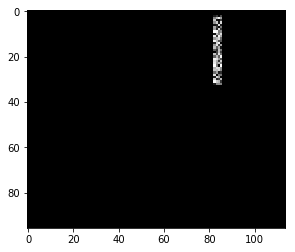

Iteration 563. Loss -143004.390625


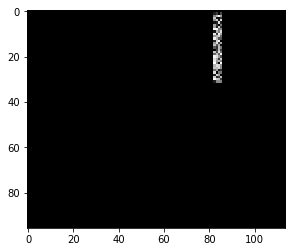

Iteration 564. Loss -142709.203125


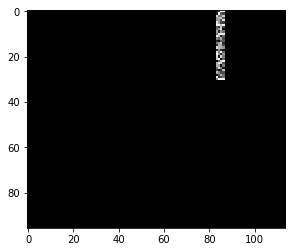

Iteration 565. Loss -142410.09375


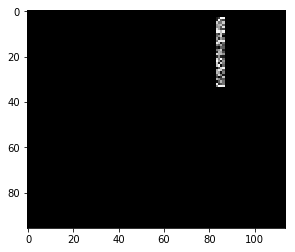

Iteration 566. Loss -143279.1875


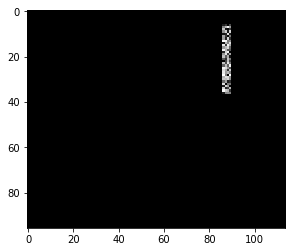

Iteration 567. Loss -143679.53125


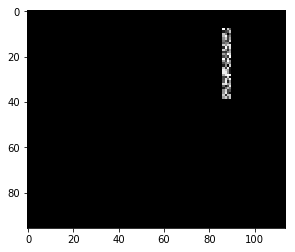

Iteration 568. Loss -143679.53125


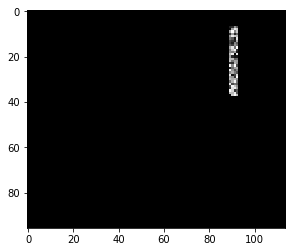

Iteration 569. Loss -143679.546875


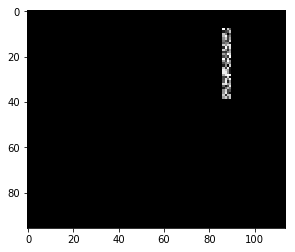

Iteration 570. Loss -143679.53125


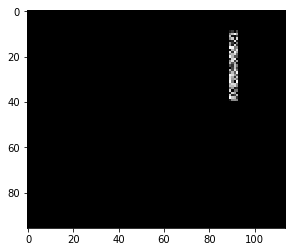

Iteration 571. Loss -143679.53125


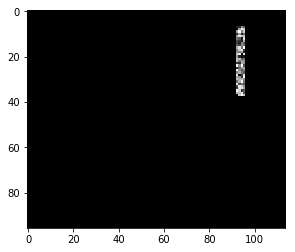

Iteration 572. Loss -143679.53125


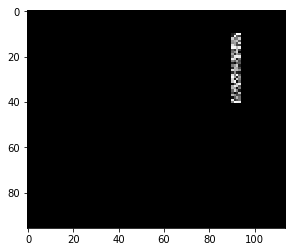

Iteration 573. Loss -143679.546875


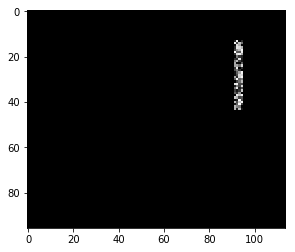

Iteration 574. Loss -143679.53125


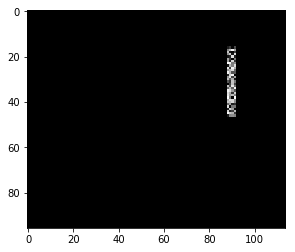

Iteration 575. Loss -143679.53125


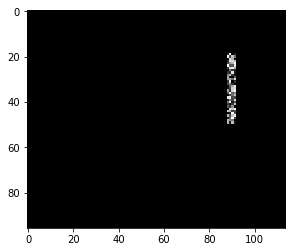

Iteration 576. Loss -143679.546875


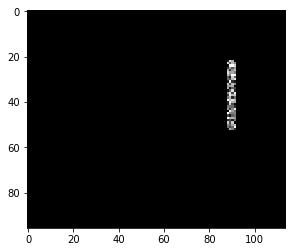

Iteration 577. Loss -143679.53125


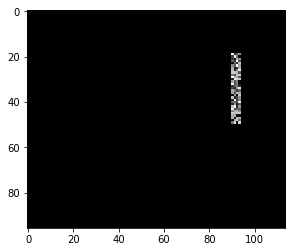

Iteration 578. Loss -143679.53125


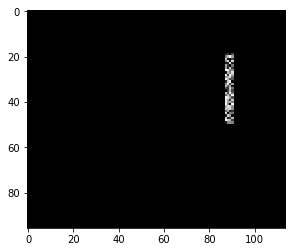

Iteration 579. Loss -143679.53125


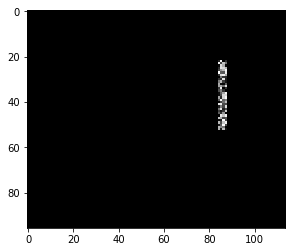

Iteration 580. Loss -143679.546875


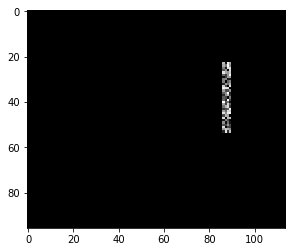

Iteration 581. Loss -143679.546875


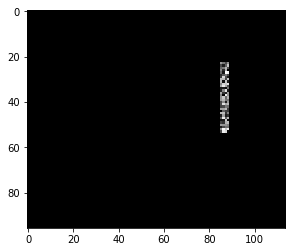

Iteration 582. Loss -143679.53125


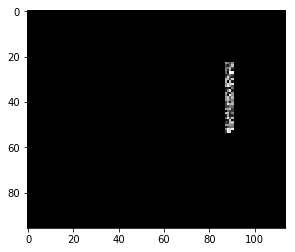

Iteration 583. Loss -143679.546875


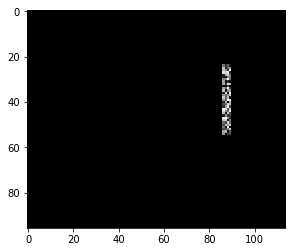

Iteration 584. Loss -143679.53125


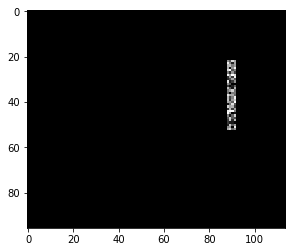

Iteration 585. Loss -143679.546875


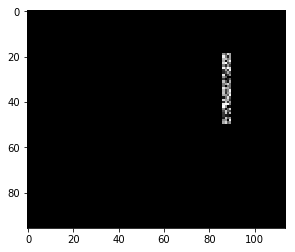

Iteration 586. Loss -143679.53125


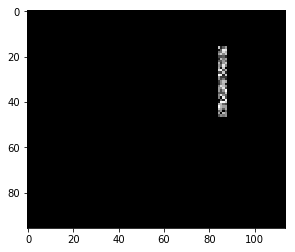

Iteration 587. Loss -143679.546875


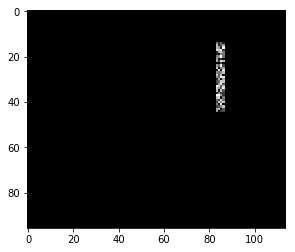

Iteration 588. Loss -143679.546875


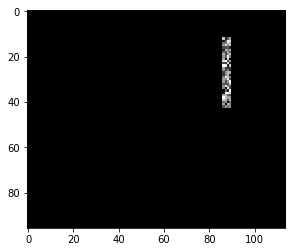

Iteration 589. Loss -143679.546875


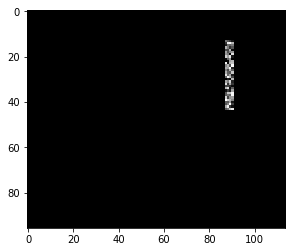

Iteration 590. Loss -143679.53125


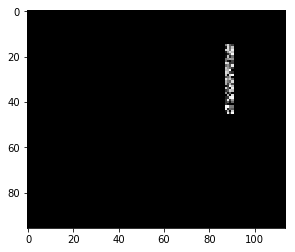

Iteration 591. Loss -143679.53125


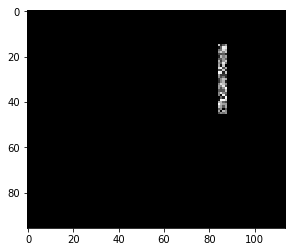

Iteration 592. Loss -143679.53125


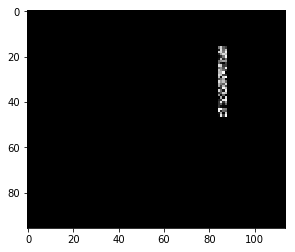

Iteration 593. Loss -143679.546875


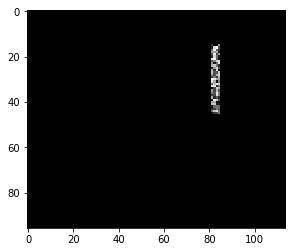

Iteration 594. Loss -143679.546875


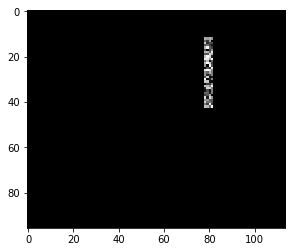

Iteration 595. Loss -143679.546875


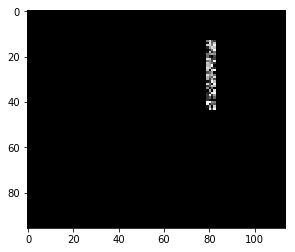

Iteration 596. Loss -143679.53125


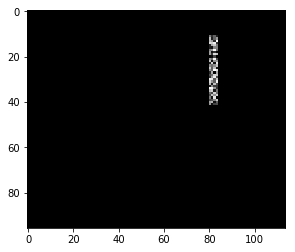

Iteration 597. Loss -143679.546875


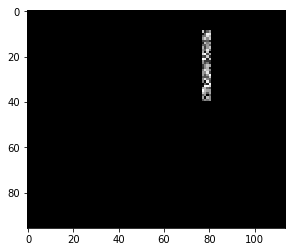

Iteration 598. Loss -143679.53125


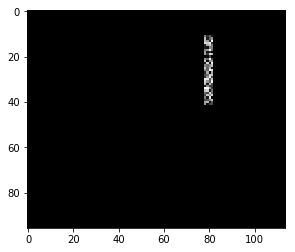

Iteration 599. Loss -143679.546875


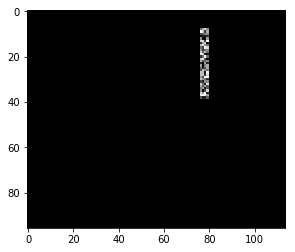

Iteration 600. Loss -143679.53125


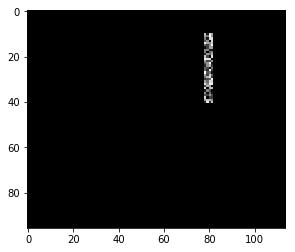

Iteration 601. Loss -143679.53125


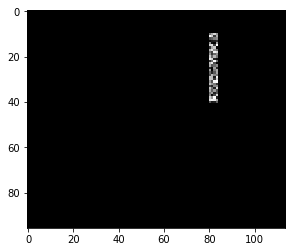

Iteration 602. Loss -143679.546875


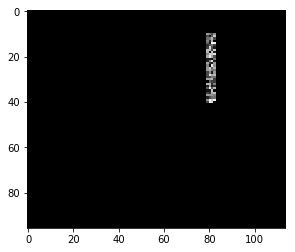

Iteration 603. Loss -143679.53125


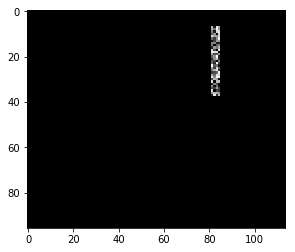

Iteration 604. Loss -143679.53125


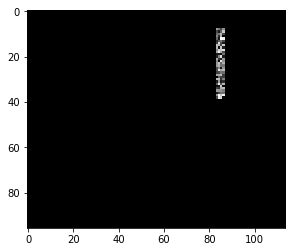

Iteration 605. Loss -143679.546875


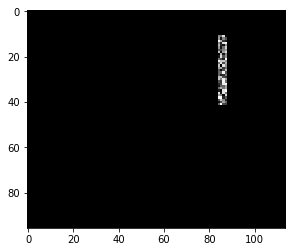

Iteration 606. Loss -143679.53125


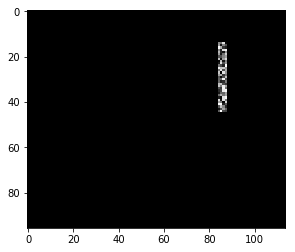

Iteration 607. Loss -143679.53125


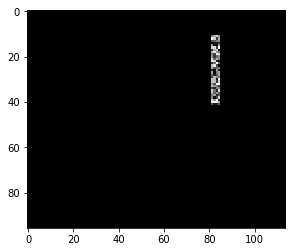

Iteration 608. Loss -143679.53125


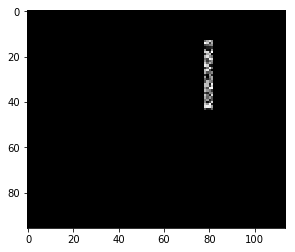

Iteration 609. Loss -143679.546875


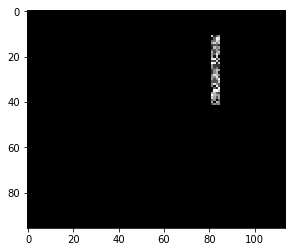

Iteration 610. Loss -143679.53125


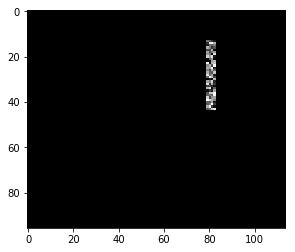

Iteration 611. Loss -143679.53125


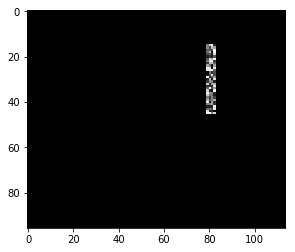

Iteration 612. Loss -143679.53125


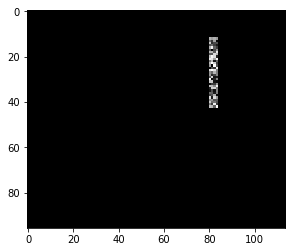

Iteration 613. Loss -143679.546875


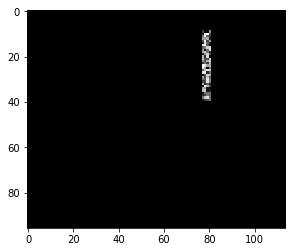

Iteration 614. Loss -143679.546875


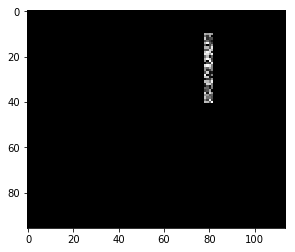

Iteration 615. Loss -143679.53125


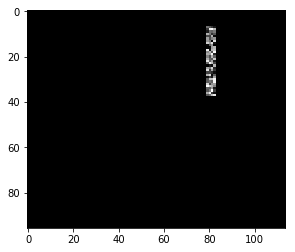

Iteration 616. Loss -143679.546875


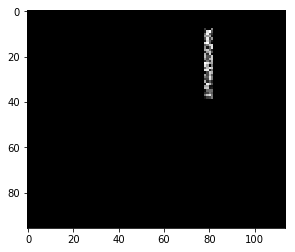

Iteration 617. Loss -143679.53125


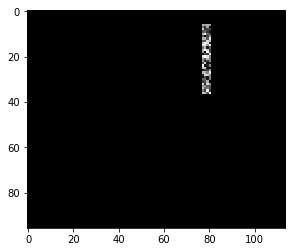

Iteration 618. Loss -143679.546875


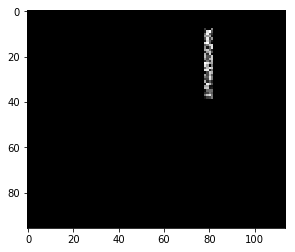

Iteration 619. Loss -143679.53125


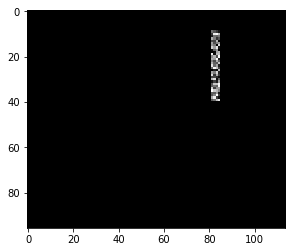

Iteration 620. Loss -143679.53125


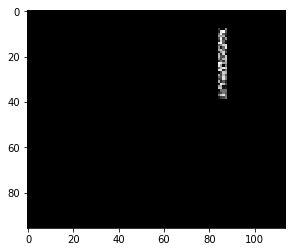

Iteration 621. Loss -143679.53125


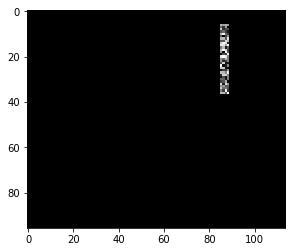

Iteration 622. Loss -143679.53125


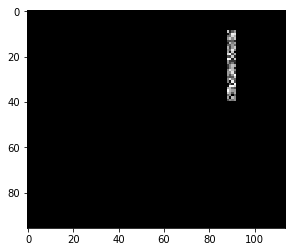

Iteration 623. Loss -143679.53125


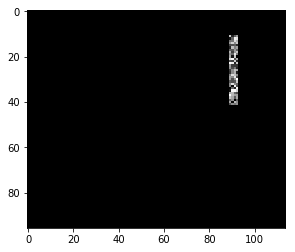

Iteration 624. Loss -143679.53125


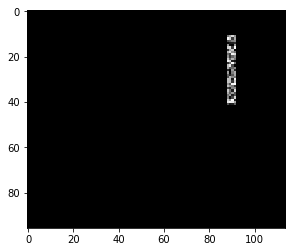

Iteration 625. Loss -143679.546875


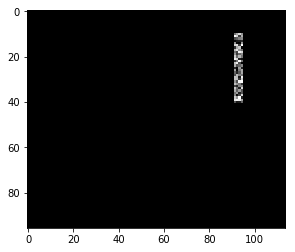

Iteration 626. Loss -143679.546875


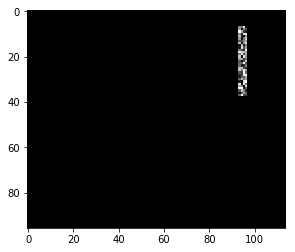

Iteration 627. Loss -143679.546875


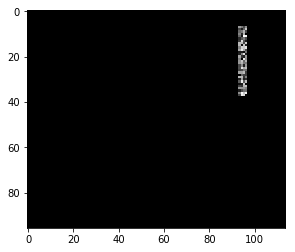

Iteration 628. Loss -143679.53125


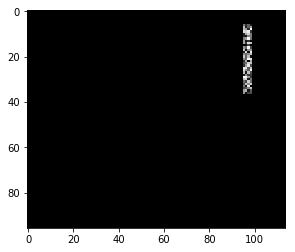

Iteration 629. Loss -143679.546875


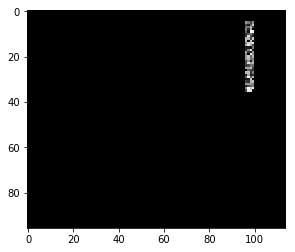

Iteration 630. Loss -143679.546875


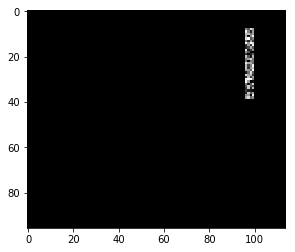

Iteration 631. Loss -143679.546875


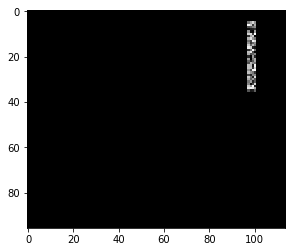

Iteration 632. Loss -143679.53125


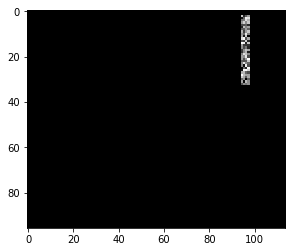

Iteration 633. Loss -143004.390625


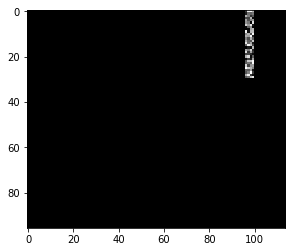

Iteration 634. Loss -142104.453125


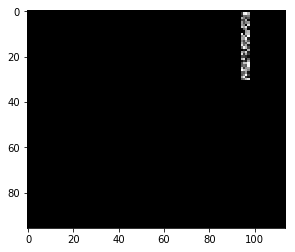

Iteration 635. Loss -142402.765625


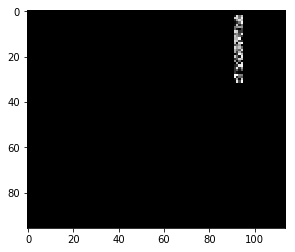

Iteration 636. Loss -142697.171875


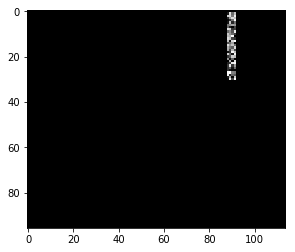

Iteration 637. Loss -142402.765625


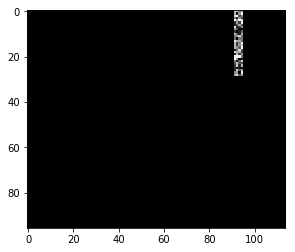

Iteration 638. Loss -141799.421875


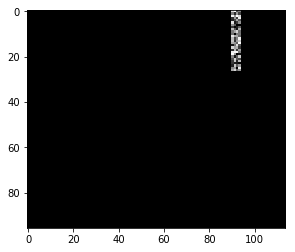

Iteration 639. Loss -141191.125


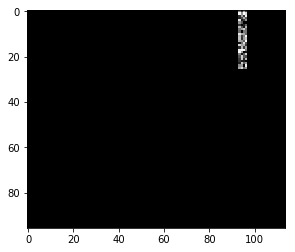

Iteration 640. Loss -140885.6875


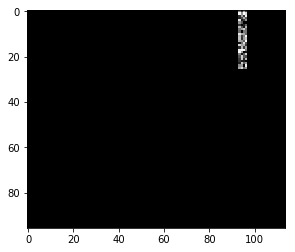

Iteration 641. Loss -140885.6875


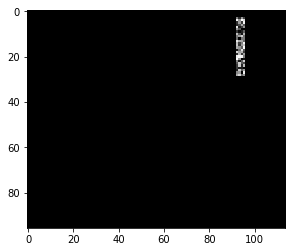

Iteration 642. Loss -141746.125


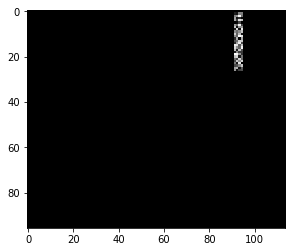

Iteration 643. Loss -141183.25


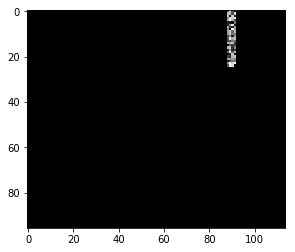

Iteration 644. Loss -140582.390625


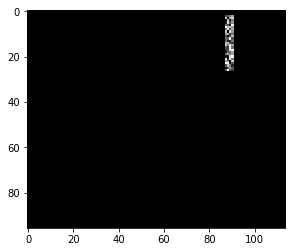

Iteration 645. Loss -141173.9375


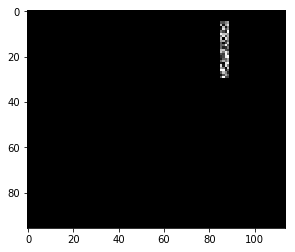

Iteration 646. Loss -141844.671875


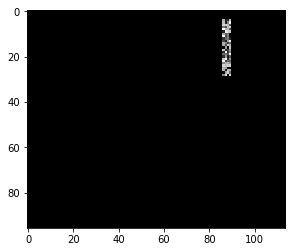

Iteration 647. Loss -141678.5


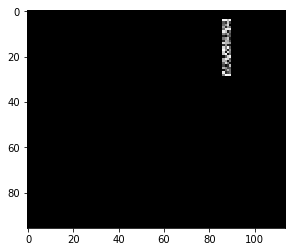

Iteration 648. Loss -141678.515625


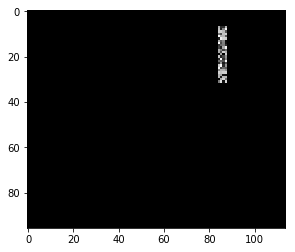

Iteration 649. Loss -141844.671875


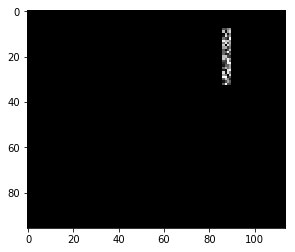

Iteration 650. Loss -141844.671875


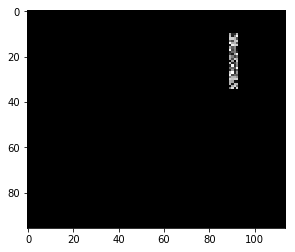

Iteration 651. Loss -141844.671875


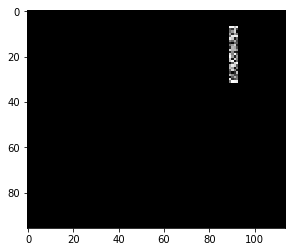

Iteration 652. Loss -141844.671875


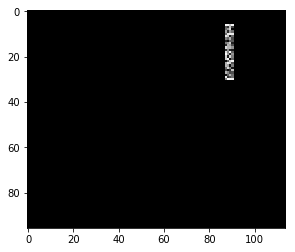

Iteration 653. Loss -141844.671875


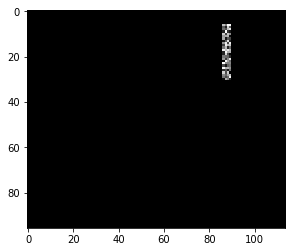

Iteration 654. Loss -141844.671875


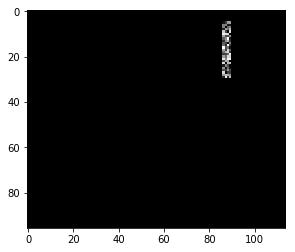

Iteration 655. Loss -141844.671875


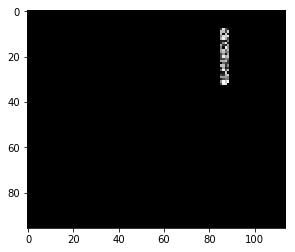

Iteration 656. Loss -141844.671875


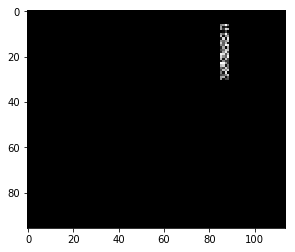

Iteration 657. Loss -141844.671875


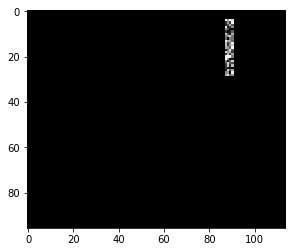

Iteration 658. Loss -141678.515625


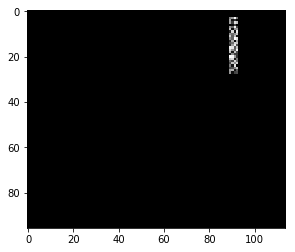

Iteration 659. Loss -141445.0


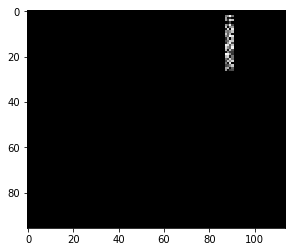

Iteration 660. Loss -141173.9375


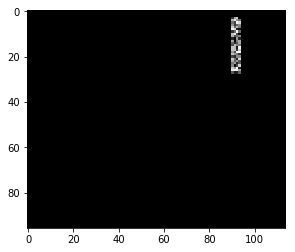

Iteration 661. Loss -141444.984375


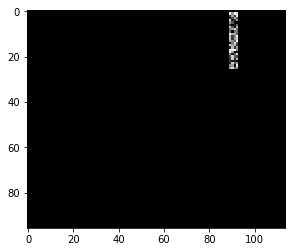

Iteration 662. Loss -140879.703125


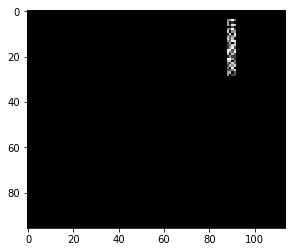

Iteration 663. Loss -141678.515625


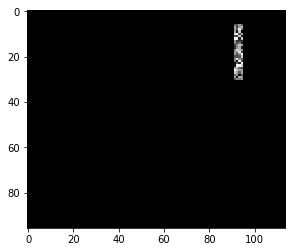

Iteration 664. Loss -141844.671875


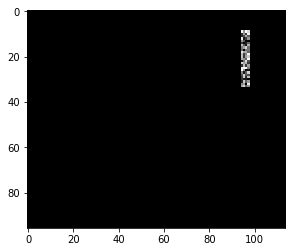

Iteration 665. Loss -141844.671875


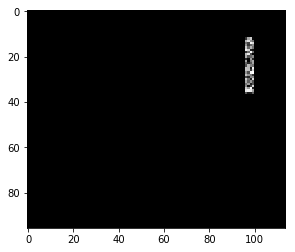

Iteration 666. Loss -141844.671875


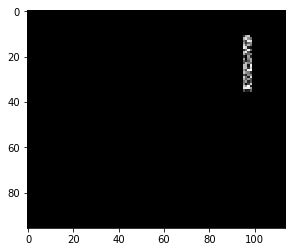

Iteration 667. Loss -141844.671875


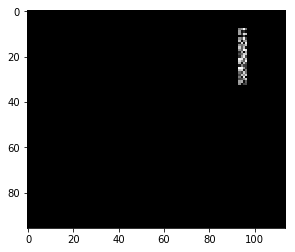

Iteration 668. Loss -141844.671875


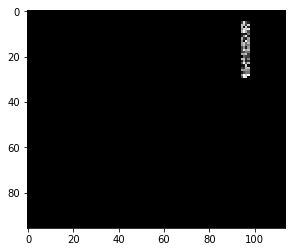

Iteration 669. Loss -141844.671875


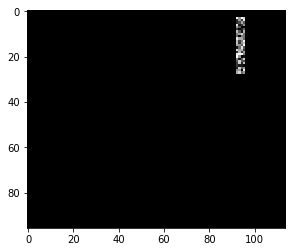

Iteration 670. Loss -141445.0


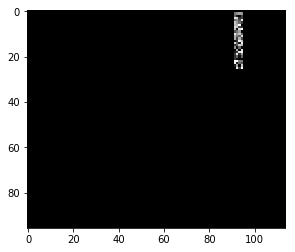

Iteration 671. Loss -140879.703125


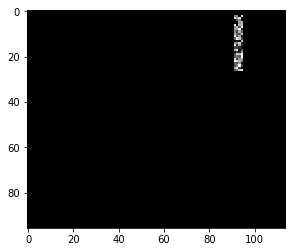

Iteration 672. Loss -141173.953125


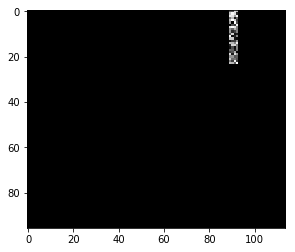

Iteration 673. Loss -140279.078125


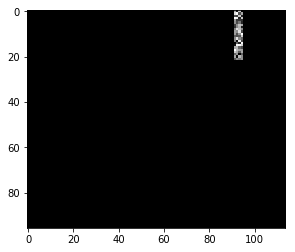

Iteration 674. Loss -139669.21875


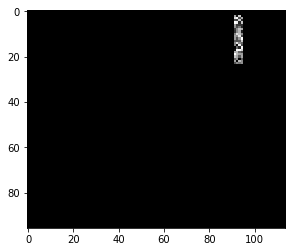

Iteration 675. Loss -140262.625


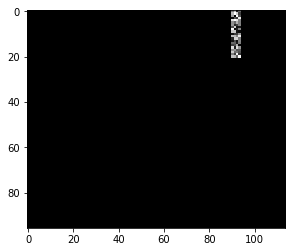

Iteration 676. Loss -139362.984375


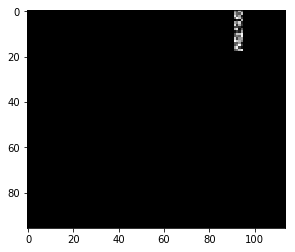

Iteration 677. Loss -138447.5625


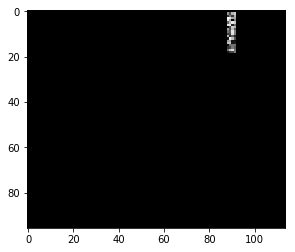

Iteration 678. Loss -138745.03125


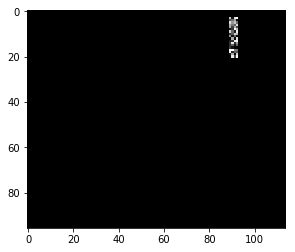

Iteration 679. Loss -139313.078125


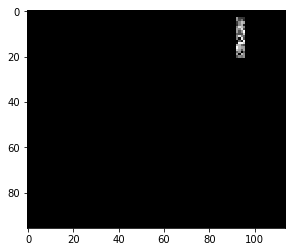

Iteration 680. Loss -139313.078125


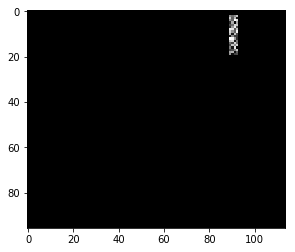

Iteration 681. Loss -139039.671875


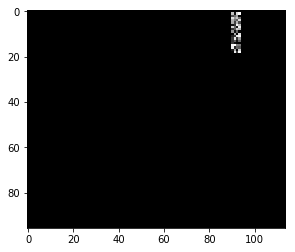

Iteration 682. Loss -138745.03125


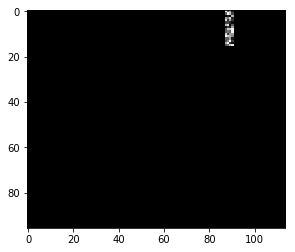

Iteration 683. Loss -137838.0625


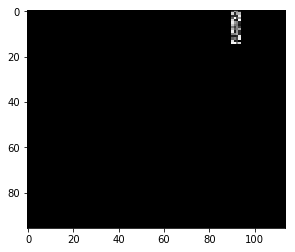

Iteration 684. Loss -137533.515625


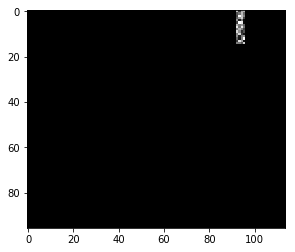

Iteration 685. Loss -137533.515625


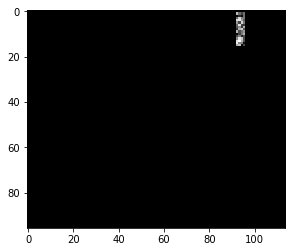

Iteration 686. Loss -137831.8125


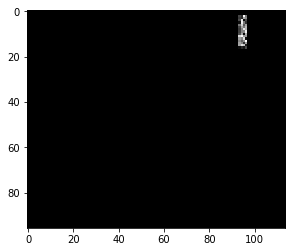

Iteration 687. Loss -138126.15625


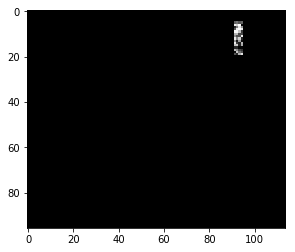

Iteration 688. Loss -138794.53125


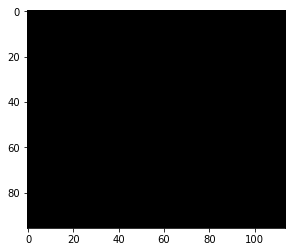

Iteration 689. Loss -138794.5625


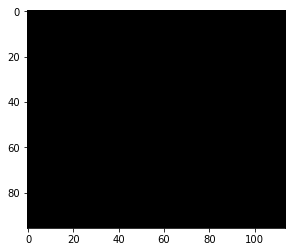

Iteration 690. Loss -138794.546875


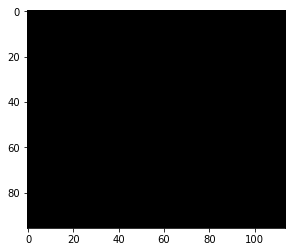

Iteration 691. Loss -138794.546875


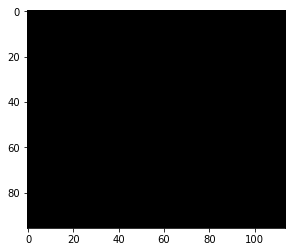

Iteration 692. Loss -138699.984375


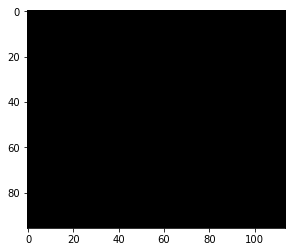

Iteration 693. Loss -138610.453125


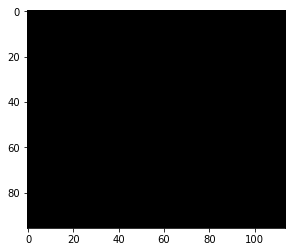

Iteration 694. Loss -138610.46875


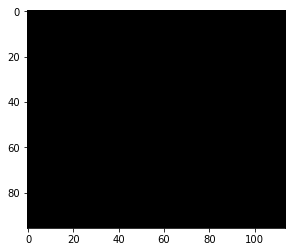

Iteration 695. Loss -138699.984375


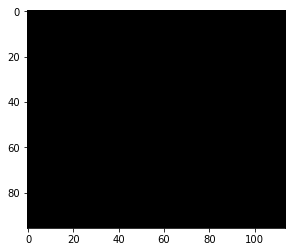

Iteration 696. Loss -138414.953125


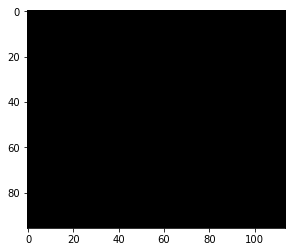

Iteration 697. Loss -138157.453125


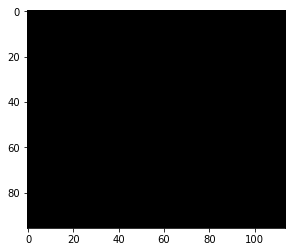

Iteration 698. Loss -137893.203125


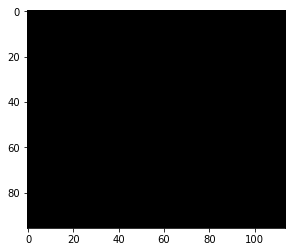

Iteration 699. Loss -137626.671875


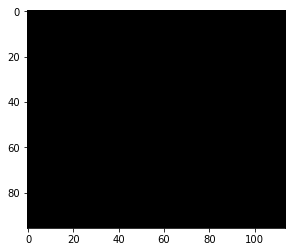

Iteration 700. Loss -137867.6875


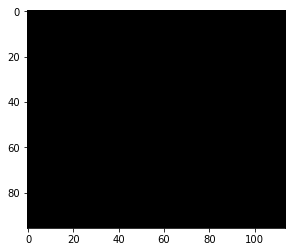

Iteration 701. Loss -137626.671875


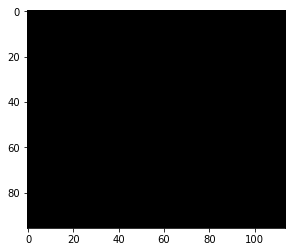

Iteration 702. Loss -137955.359375


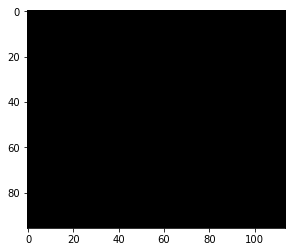

Iteration 703. Loss -138136.4375


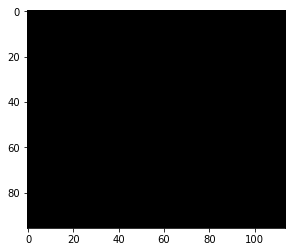

Iteration 704. Loss -137955.359375


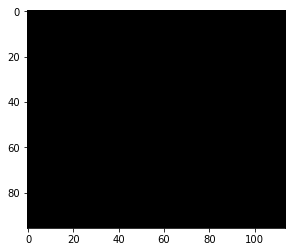

Iteration 705. Loss -137810.171875


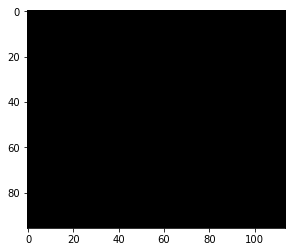

Iteration 706. Loss -137955.359375


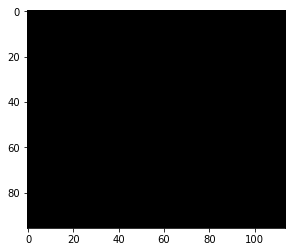

Iteration 707. Loss -137867.703125


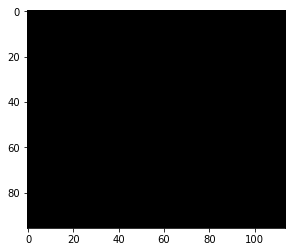

Iteration 708. Loss -137626.671875


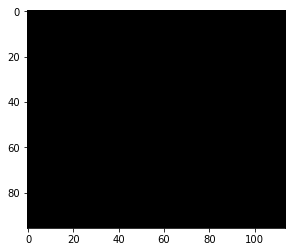

Iteration 709. Loss -137955.34375


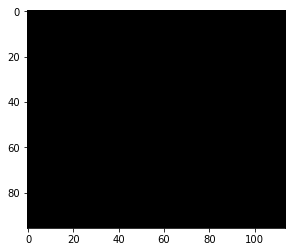

Iteration 710. Loss -137867.6875


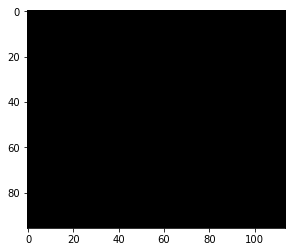

Iteration 711. Loss -137755.203125


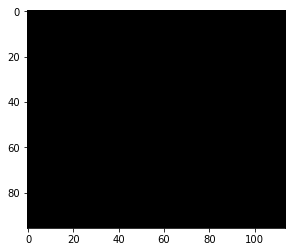

Iteration 712. Loss -137867.703125


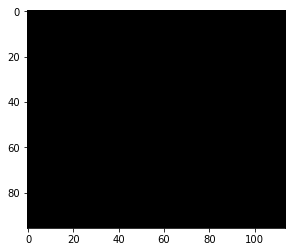

Iteration 713. Loss -138136.4375


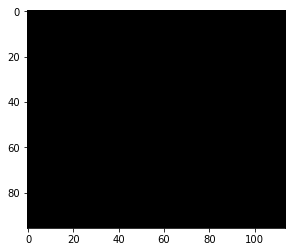

Iteration 714. Loss -137793.53125


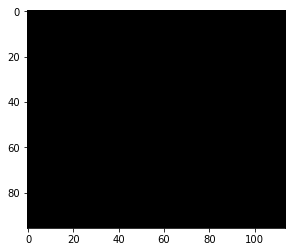

Iteration 715. Loss -137084.421875


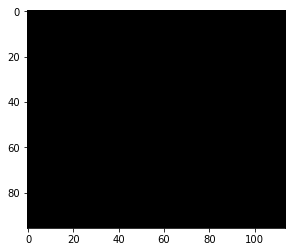

Iteration 716. Loss -137552.21875


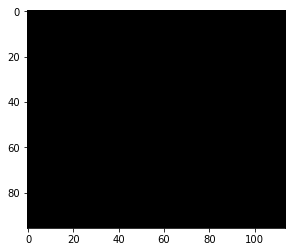

Iteration 717. Loss -136518.390625


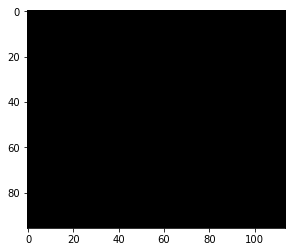

Iteration 718. Loss -136025.40625


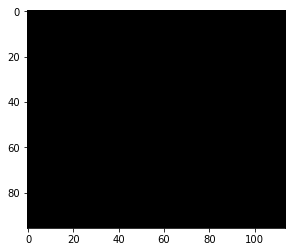

Iteration 719. Loss -135250.15625


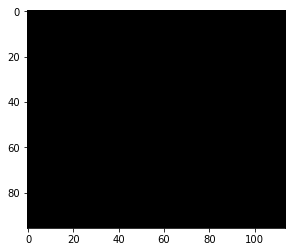

Iteration 720. Loss -135177.875


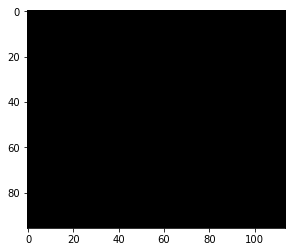

Iteration 721. Loss -135127.3125


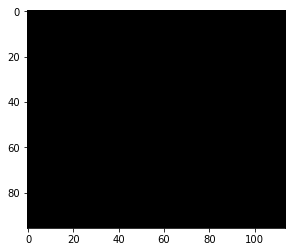

Iteration 722. Loss -134539.921875


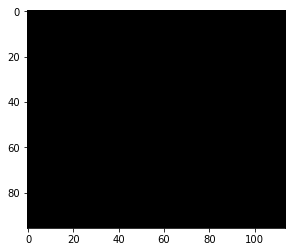

Iteration 723. Loss -133862.203125


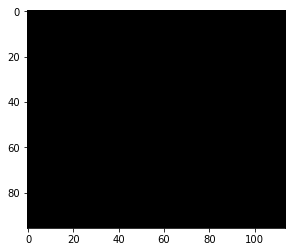

Iteration 724. Loss -133383.65625


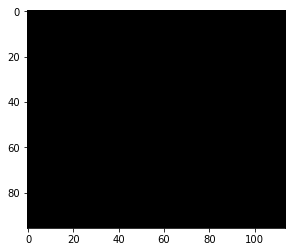

Iteration 725. Loss -133383.65625


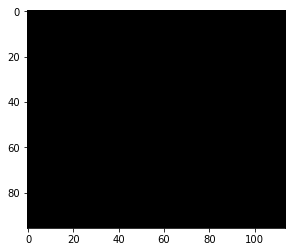

Iteration 726. Loss -133383.65625


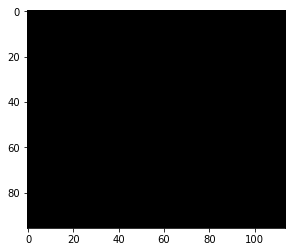

Iteration 727. Loss -133383.65625


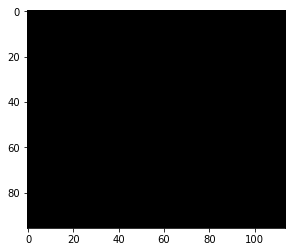

Iteration 728. Loss -133383.65625


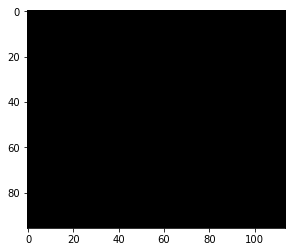

Iteration 729. Loss -133383.65625


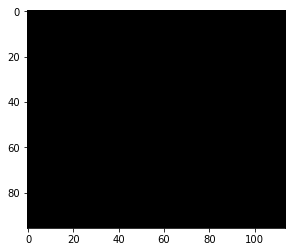

Iteration 730. Loss -133383.65625


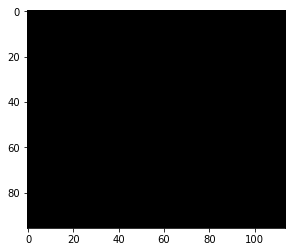

Iteration 731. Loss -133383.65625


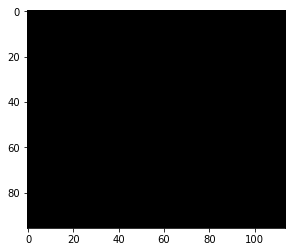

Iteration 732. Loss -133383.65625


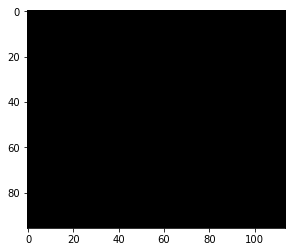

Iteration 733. Loss -133383.65625


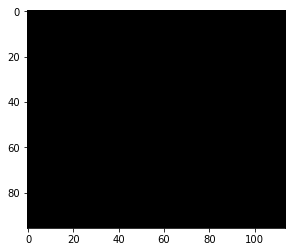

Iteration 734. Loss -133383.65625


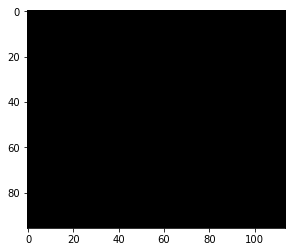

Iteration 735. Loss -133383.65625


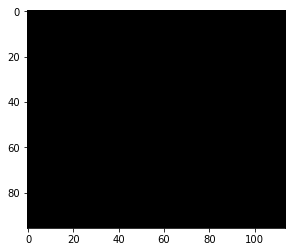

Iteration 736. Loss -133383.65625


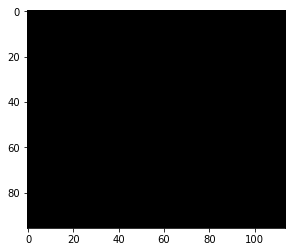

Iteration 737. Loss -133383.65625


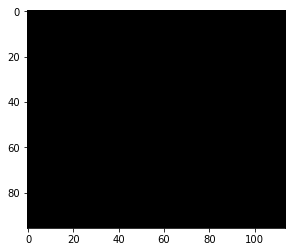

Iteration 738. Loss -133383.65625


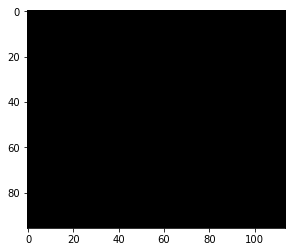

Iteration 739. Loss -133383.65625


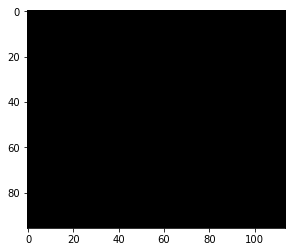

Iteration 740. Loss -133383.65625


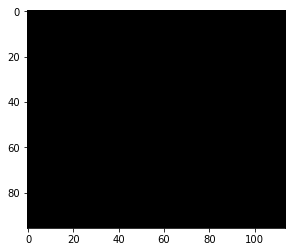

Iteration 741. Loss -133383.65625


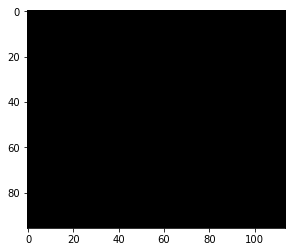

Iteration 742. Loss -133383.65625


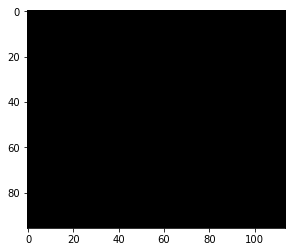

Iteration 743. Loss -133383.65625


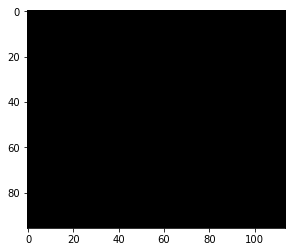

Iteration 744. Loss -133383.65625


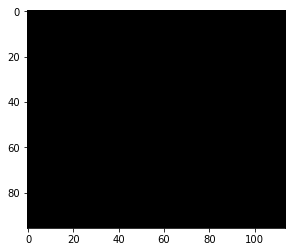

Iteration 745. Loss -133383.65625


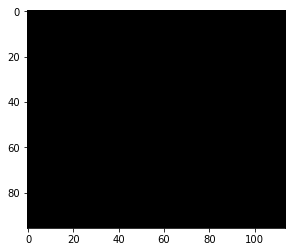

Iteration 746. Loss -133383.65625


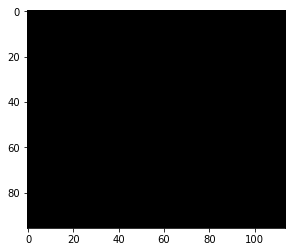

Iteration 747. Loss -133383.65625


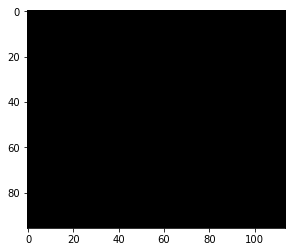

Iteration 748. Loss -133383.65625


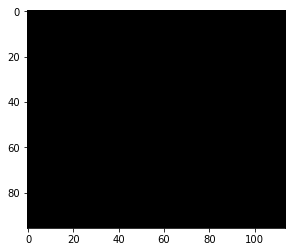

Iteration 749. Loss -133383.65625


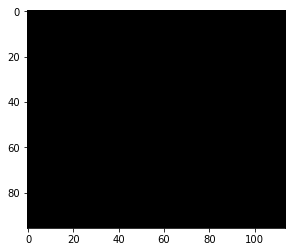

Iteration 750. Loss -133383.65625


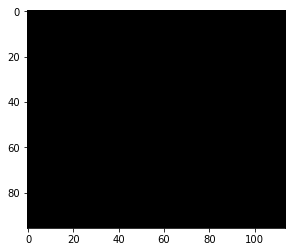

Iteration 751. Loss -133383.65625


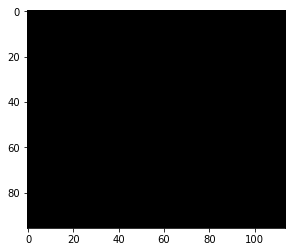

Iteration 752. Loss -133383.65625


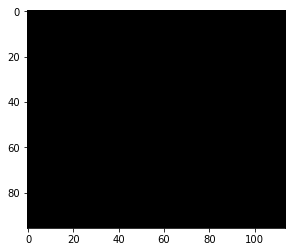

Iteration 753. Loss -133383.65625


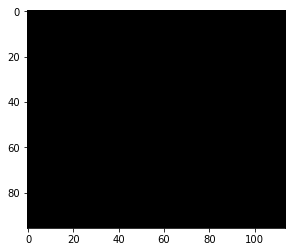

Iteration 754. Loss -133383.65625


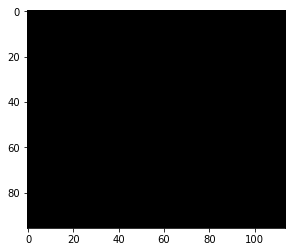

Iteration 755. Loss -133383.65625


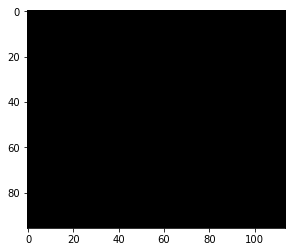

Iteration 756. Loss -133383.65625


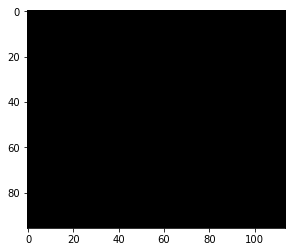

Iteration 757. Loss -133383.65625


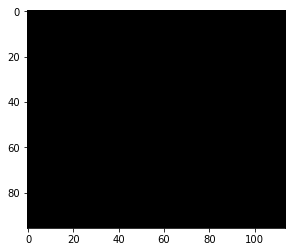

Iteration 758. Loss -133383.65625


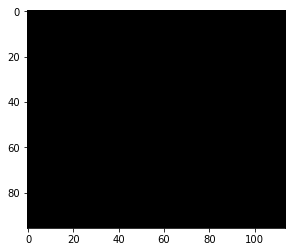

Iteration 759. Loss -133383.65625


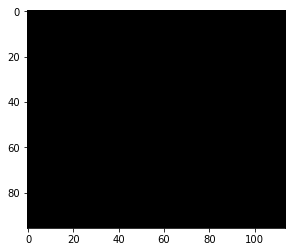

Iteration 760. Loss -133383.65625


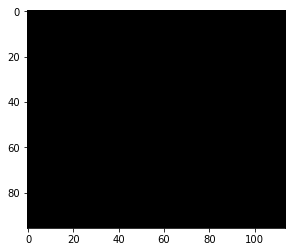

Iteration 761. Loss -133383.65625


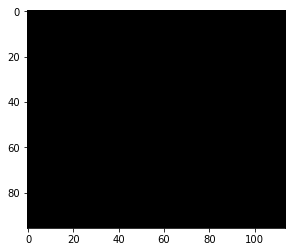

Iteration 762. Loss -133383.65625


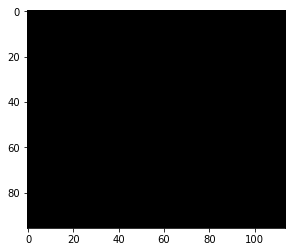

Iteration 763. Loss -133383.65625


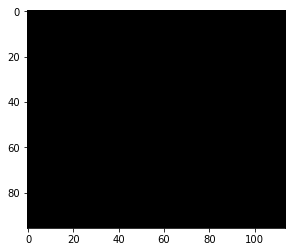

Iteration 764. Loss -133383.65625


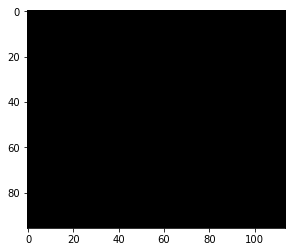

Iteration 765. Loss -133383.65625


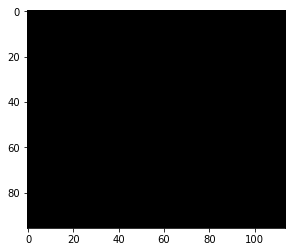

Iteration 766. Loss -133383.65625


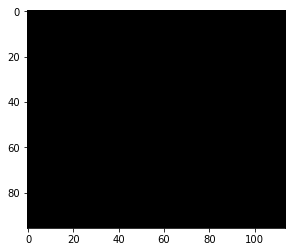

Iteration 767. Loss -133383.65625


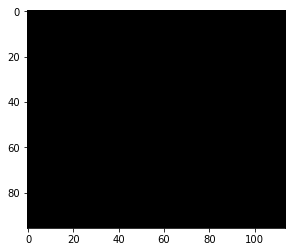

Iteration 768. Loss -133383.65625


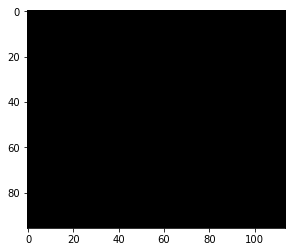

Iteration 769. Loss -133383.65625


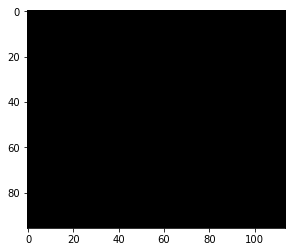

Iteration 770. Loss -133383.65625


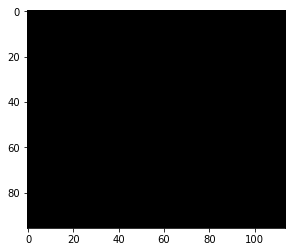

Iteration 771. Loss -133383.65625


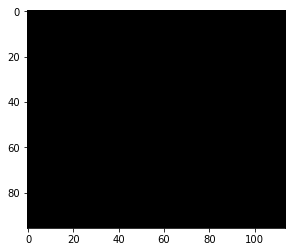

Iteration 772. Loss -133383.65625


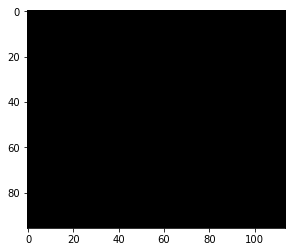

Iteration 773. Loss -133383.65625


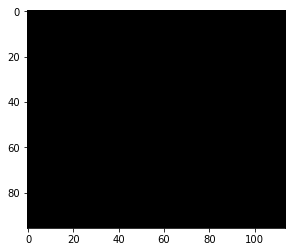

Iteration 774. Loss -133383.65625


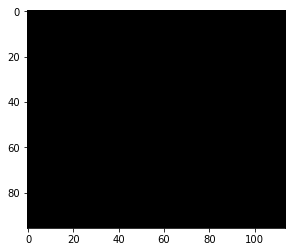

Iteration 775. Loss -133383.65625


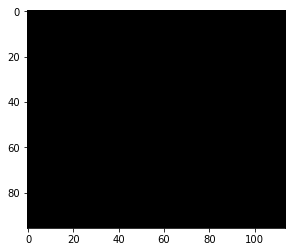

Iteration 776. Loss -133383.65625


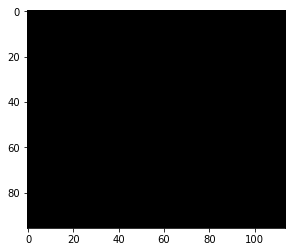

Iteration 777. Loss -133383.65625


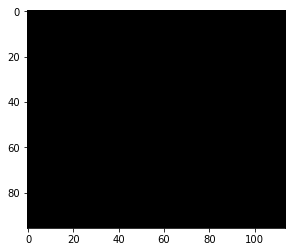

Iteration 778. Loss -133383.65625


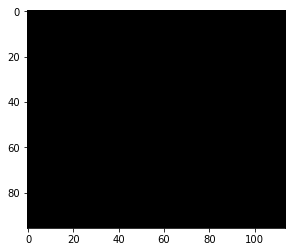

Iteration 779. Loss -133383.65625


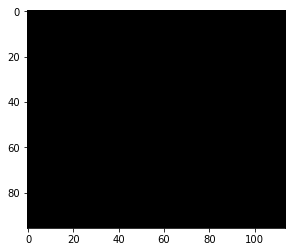

Iteration 780. Loss -133383.65625


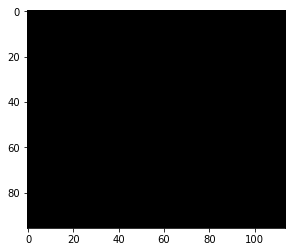

Iteration 781. Loss -133383.65625


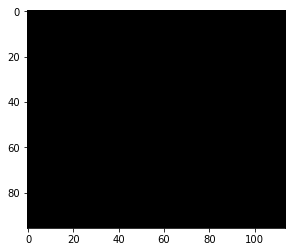

Iteration 782. Loss -133383.65625


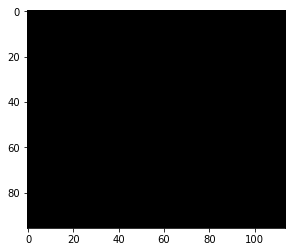

Iteration 783. Loss -133383.65625


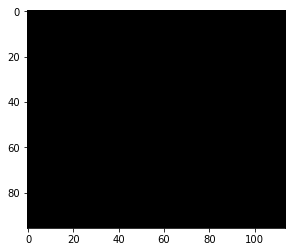

Iteration 784. Loss -133383.65625


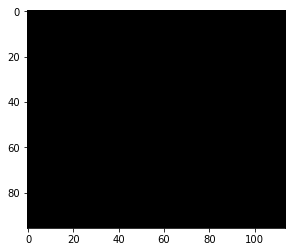

Iteration 785. Loss -133383.65625


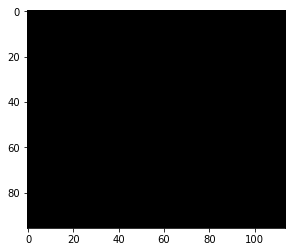

Iteration 786. Loss -133383.65625


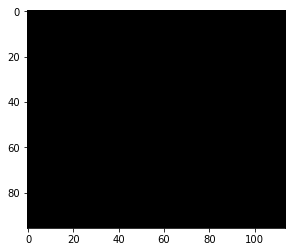

Iteration 787. Loss -133383.65625


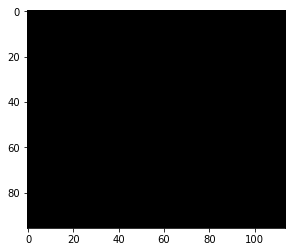

Iteration 788. Loss -133383.65625


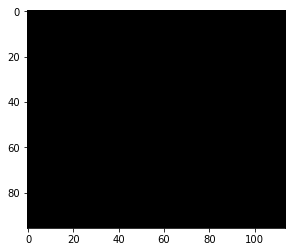

Iteration 789. Loss -133383.65625


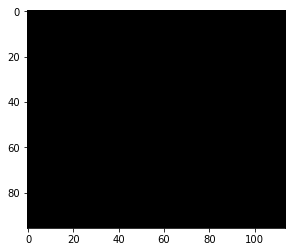

Iteration 790. Loss -133383.65625


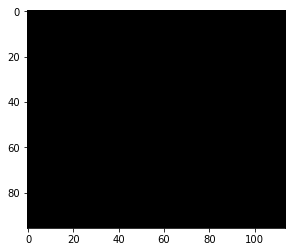

Iteration 791. Loss -133383.65625


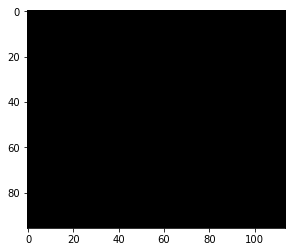

Iteration 792. Loss -133383.65625


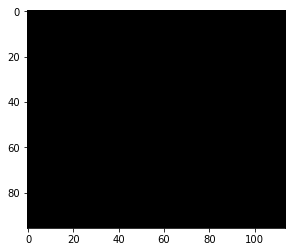

Iteration 793. Loss -133383.65625


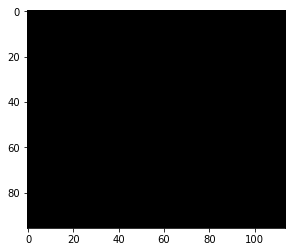

Iteration 794. Loss -133383.65625


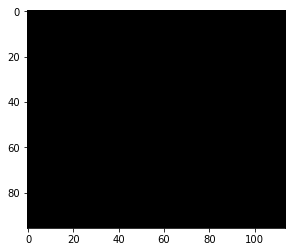

Iteration 795. Loss -133383.65625


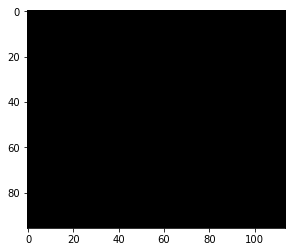

Iteration 796. Loss -133383.65625


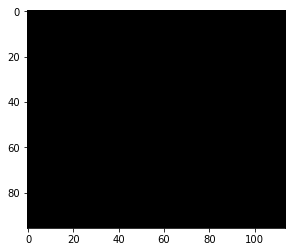

Iteration 797. Loss -133383.65625


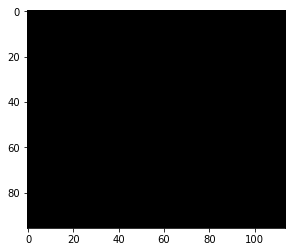

Iteration 798. Loss -133383.65625


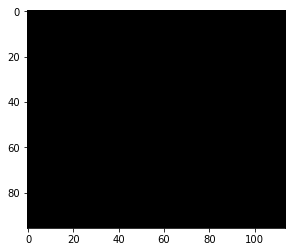

Iteration 799. Loss -133383.65625


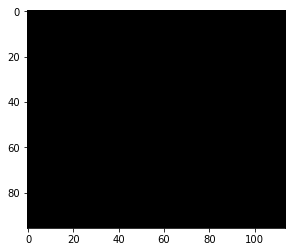

Iteration 800. Loss -133383.65625


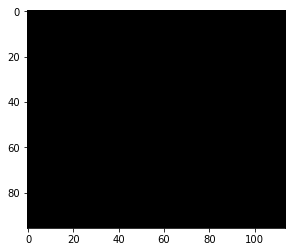

Iteration 801. Loss -133383.65625


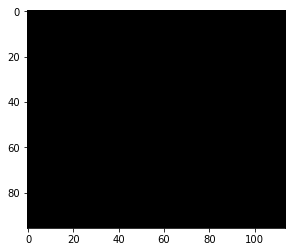

Iteration 802. Loss -133383.65625


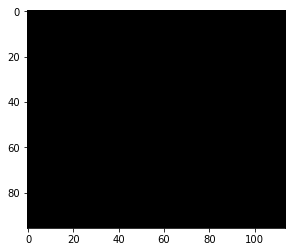

Iteration 803. Loss -133383.65625


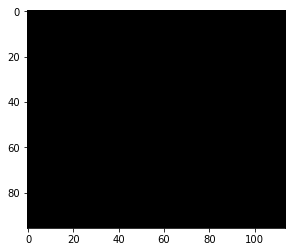

Iteration 804. Loss -133383.65625


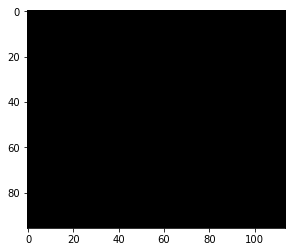

Iteration 805. Loss -133383.65625


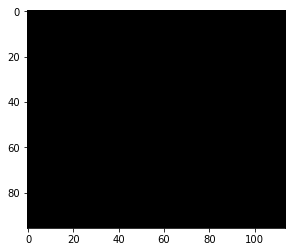

Iteration 806. Loss -133383.65625


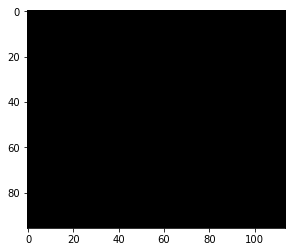

Iteration 807. Loss -133383.65625


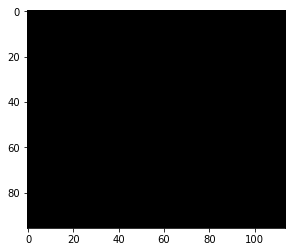

Iteration 808. Loss -133383.65625


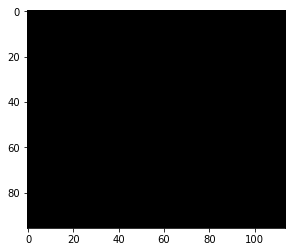

Iteration 809. Loss -133383.65625


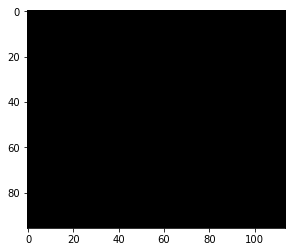

Iteration 810. Loss -133383.65625


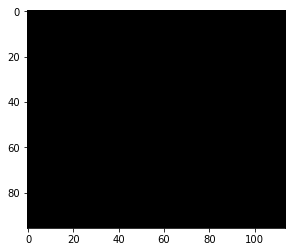

Iteration 811. Loss -133383.65625


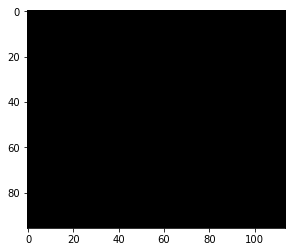

Iteration 812. Loss -133383.65625


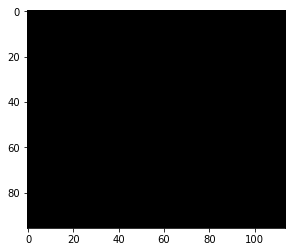

Iteration 813. Loss -133383.65625


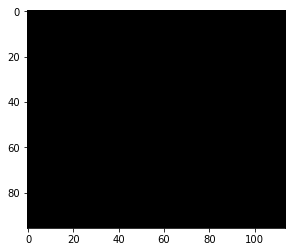

Iteration 814. Loss -133383.65625


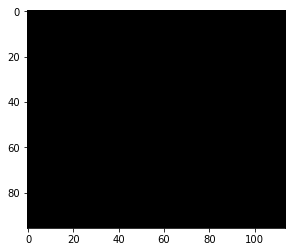

Iteration 815. Loss -133383.65625


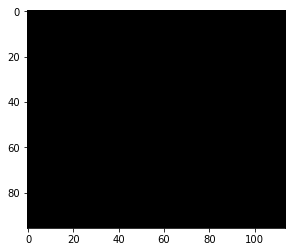

Iteration 816. Loss -133383.65625


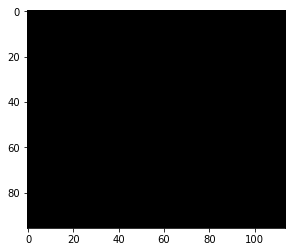

Iteration 817. Loss -133383.65625


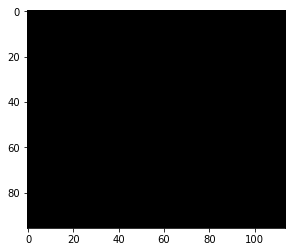

Iteration 818. Loss -133383.65625


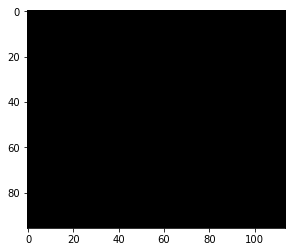

Iteration 819. Loss -133383.65625


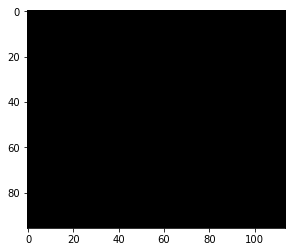

Iteration 820. Loss -133383.65625


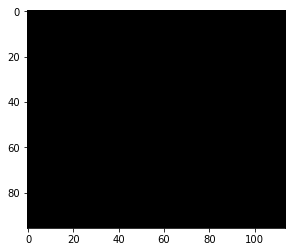

Iteration 821. Loss -133383.65625


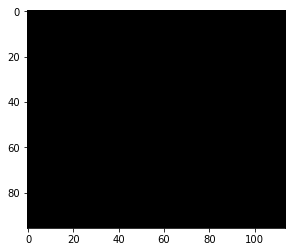

Iteration 822. Loss -133383.65625


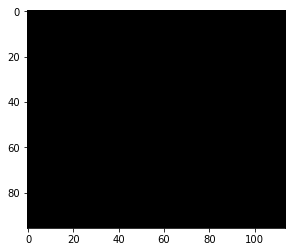

Iteration 823. Loss -133383.65625


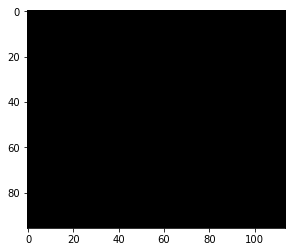

Iteration 824. Loss -133383.65625


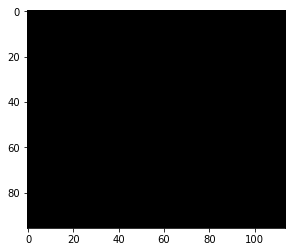

Iteration 825. Loss -133383.65625


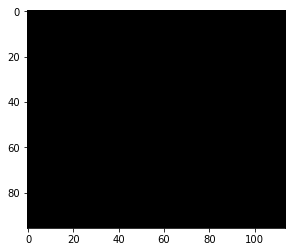

Iteration 826. Loss -133383.65625


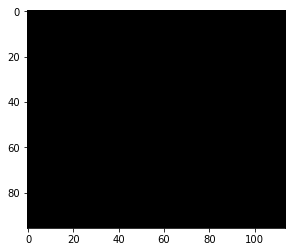

Iteration 827. Loss -133383.65625


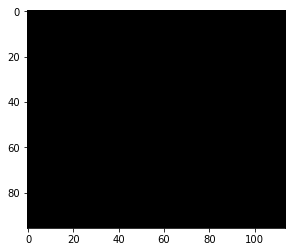

Iteration 828. Loss -133383.65625


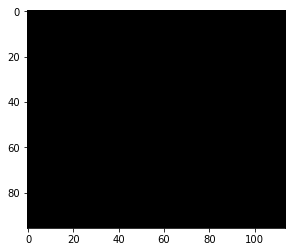

Iteration 829. Loss -133383.65625


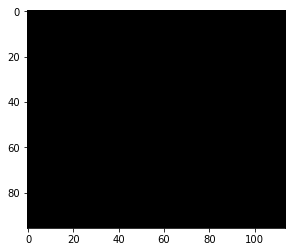

Iteration 830. Loss -133383.65625


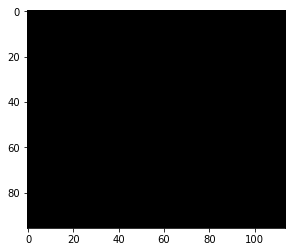

Iteration 831. Loss -133383.65625


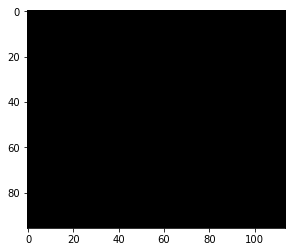

Iteration 832. Loss -133383.65625


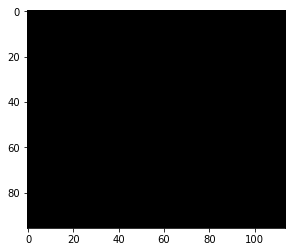

Iteration 833. Loss -133383.65625


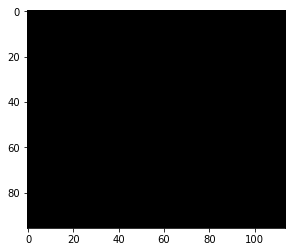

Iteration 834. Loss -133383.65625


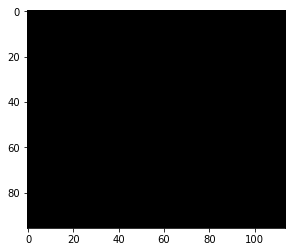

Iteration 835. Loss -133383.65625


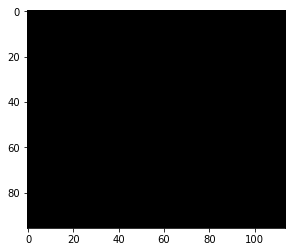

Iteration 836. Loss -133383.65625


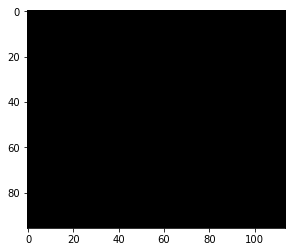

Iteration 837. Loss -133383.65625


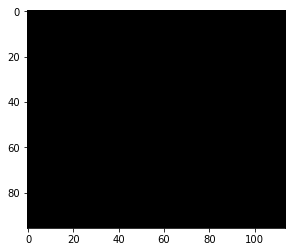

Iteration 838. Loss -133383.65625


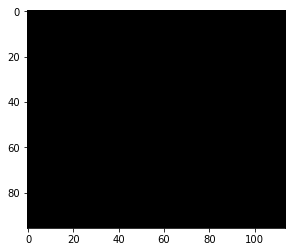

Iteration 839. Loss -133383.65625


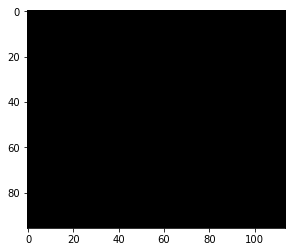

Iteration 840. Loss -133383.65625


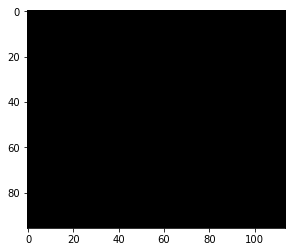

Iteration 841. Loss -133383.65625


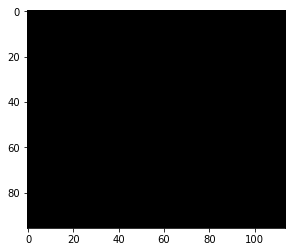

Iteration 842. Loss -133383.65625


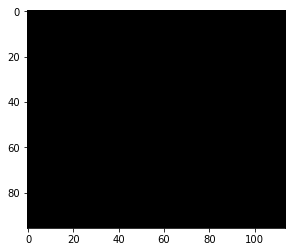

Iteration 843. Loss -133383.65625


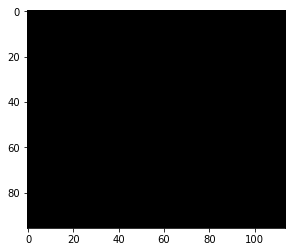

Iteration 844. Loss -133383.65625


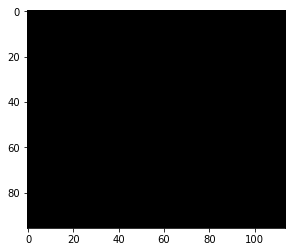

Iteration 845. Loss -133383.65625


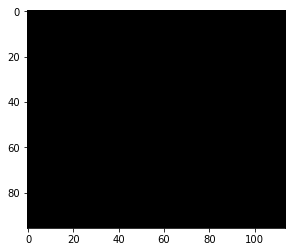

Iteration 846. Loss -133383.65625


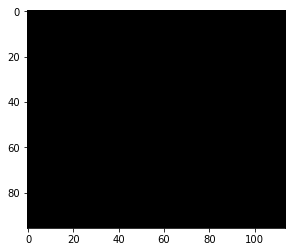

Iteration 847. Loss -133383.65625


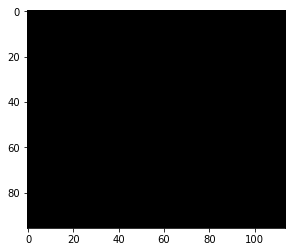

Iteration 848. Loss -133383.65625


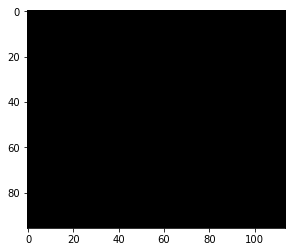

Iteration 849. Loss -133383.65625


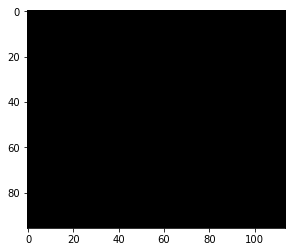

Iteration 850. Loss -133383.65625


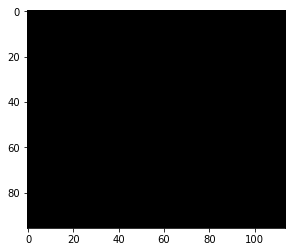

Iteration 851. Loss -133383.65625


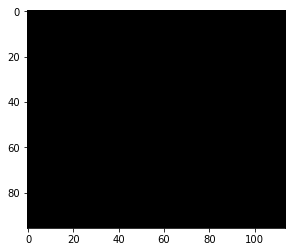

Iteration 852. Loss -133383.65625


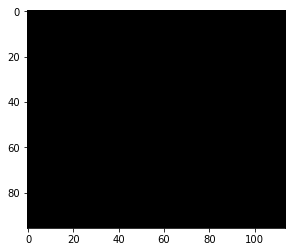

Iteration 853. Loss -133383.65625


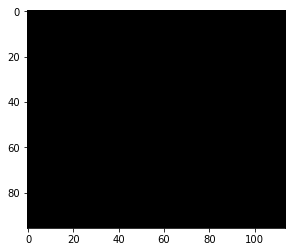

Iteration 854. Loss -133383.65625


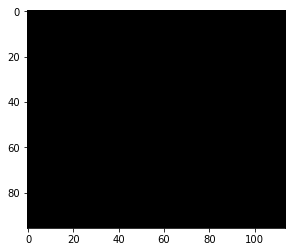

Iteration 855. Loss -133383.65625


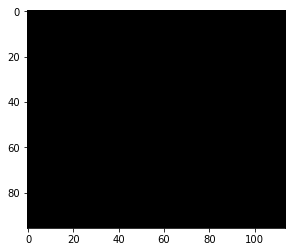

Iteration 856. Loss -133383.65625


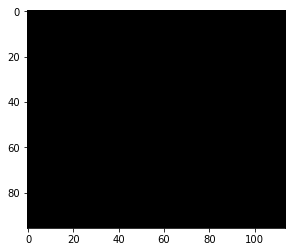

Iteration 857. Loss -133383.65625


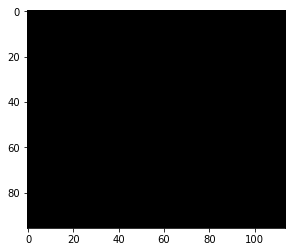

Iteration 858. Loss -133383.65625


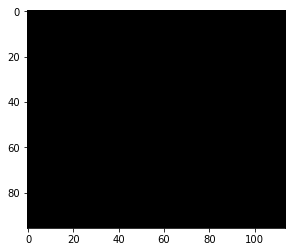

Iteration 859. Loss -133383.65625


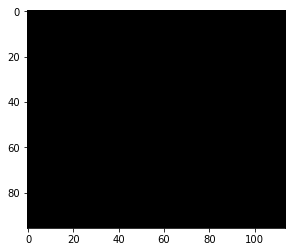

Iteration 860. Loss -133383.65625


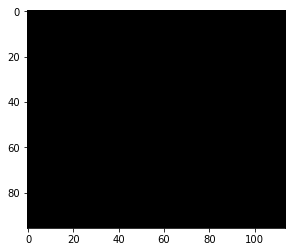

Iteration 861. Loss -133383.65625


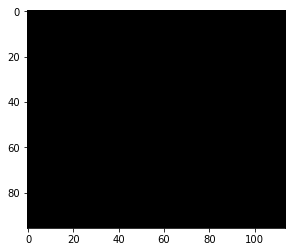

Iteration 862. Loss -133383.65625


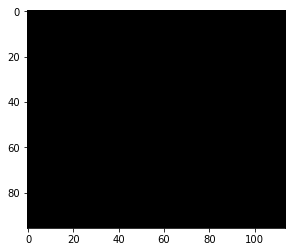

Iteration 863. Loss -133383.65625


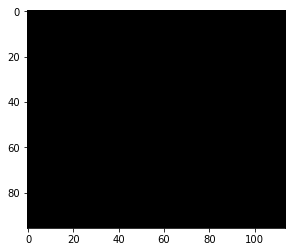

Iteration 864. Loss -133383.65625


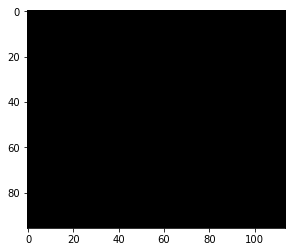

Iteration 865. Loss -133383.65625


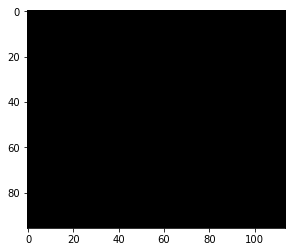

Iteration 866. Loss -133383.65625


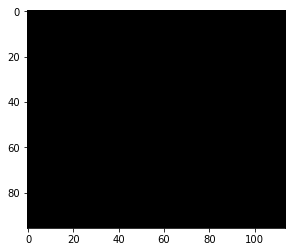

Iteration 867. Loss -133383.65625


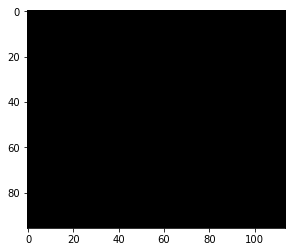

Iteration 868. Loss -133383.65625


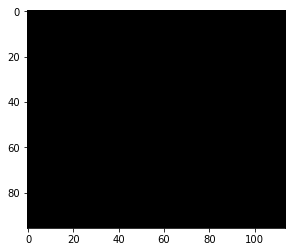

Iteration 869. Loss -133383.65625


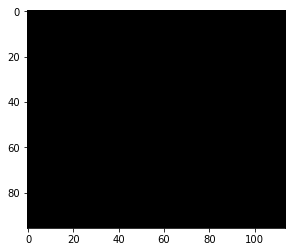

Iteration 870. Loss -133383.65625


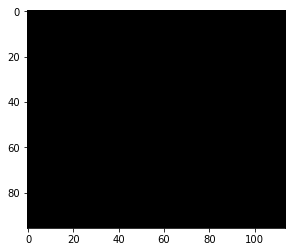

Iteration 871. Loss -133383.65625


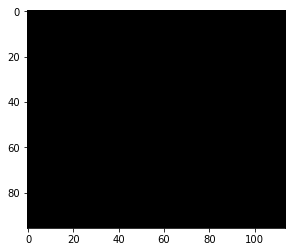

Iteration 872. Loss -133383.65625


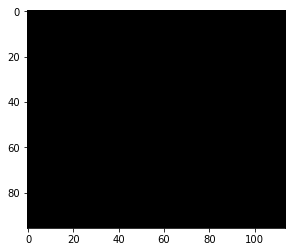

Iteration 873. Loss -133383.65625


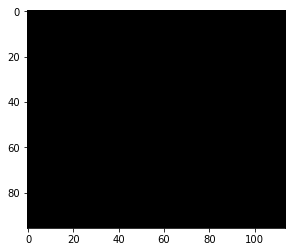

Iteration 874. Loss -133383.65625


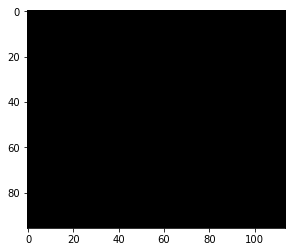

Iteration 875. Loss -133383.65625


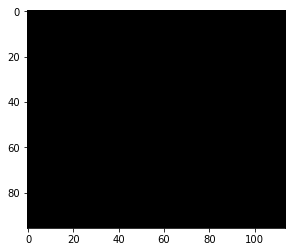

Iteration 876. Loss -133383.65625


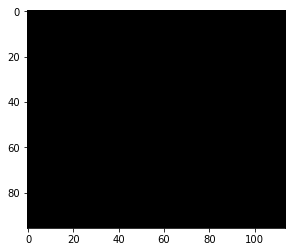

Iteration 877. Loss -133383.65625


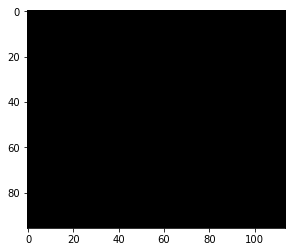

Iteration 878. Loss -133383.65625


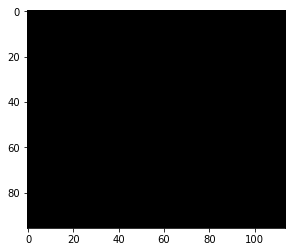

Iteration 879. Loss -133383.65625


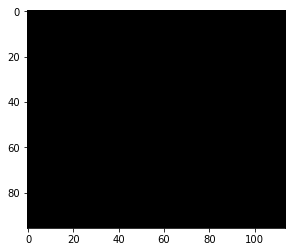

Iteration 880. Loss -133383.65625


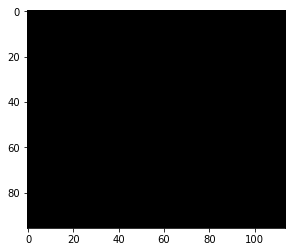

Iteration 881. Loss -133383.65625


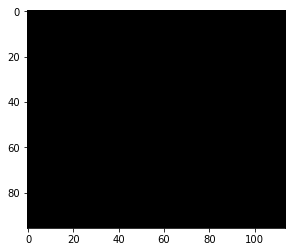

Iteration 882. Loss -133383.65625


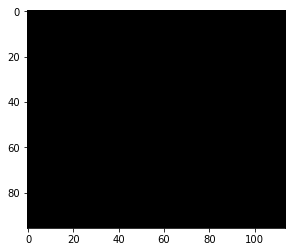

Iteration 883. Loss -133383.65625


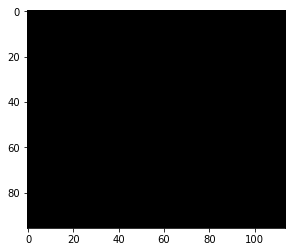

Iteration 884. Loss -133383.65625


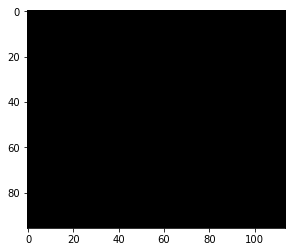

Iteration 885. Loss -133383.65625


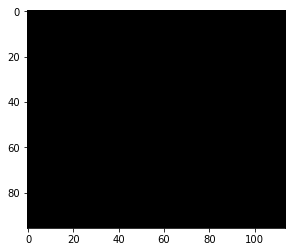

Iteration 886. Loss -133383.65625


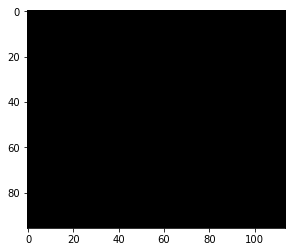

Iteration 887. Loss -133383.65625


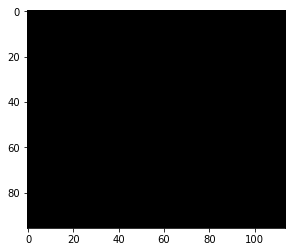

Iteration 888. Loss -133383.65625


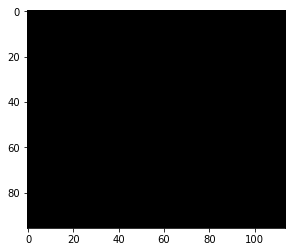

Iteration 889. Loss -133383.65625


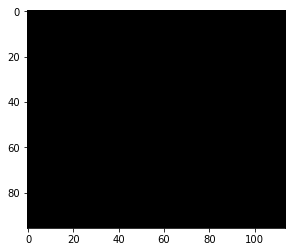

Iteration 890. Loss -133383.65625


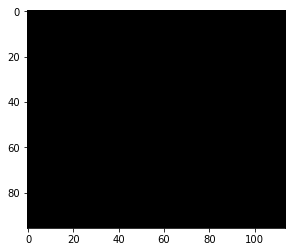

Iteration 891. Loss -133383.65625


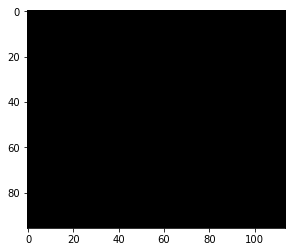

Iteration 892. Loss -133383.65625


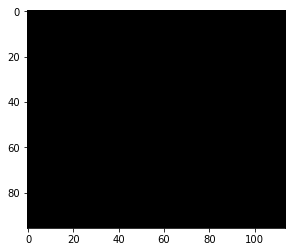

Iteration 893. Loss -133383.65625


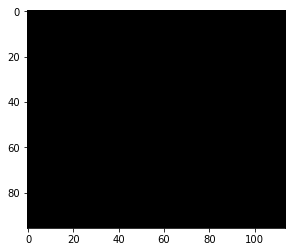

Iteration 894. Loss -133383.65625


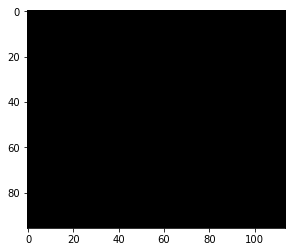

Iteration 895. Loss -133383.65625


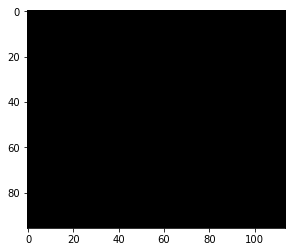

Iteration 896. Loss -133383.65625


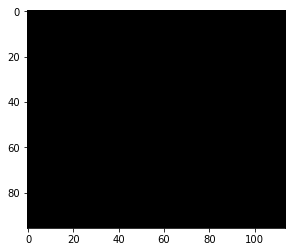

Iteration 897. Loss -133383.65625


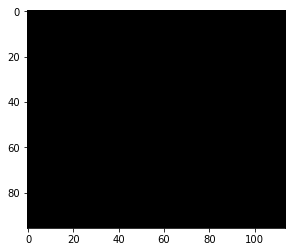

Iteration 898. Loss -133383.65625


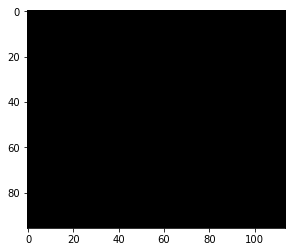

Iteration 899. Loss -133383.65625


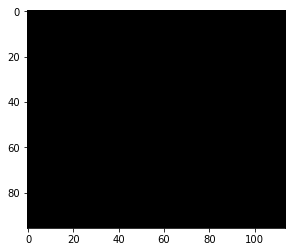

Iteration 900. Loss -133383.65625


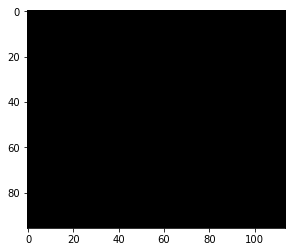

Iteration 901. Loss -133383.65625


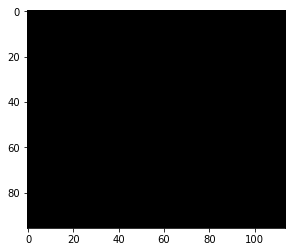

Iteration 902. Loss -133383.65625


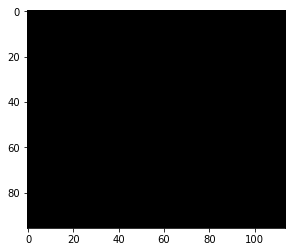

Iteration 903. Loss -133383.65625


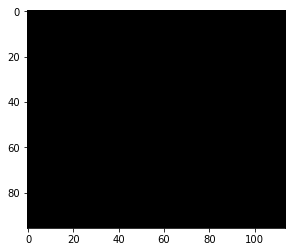

Iteration 904. Loss -133383.65625


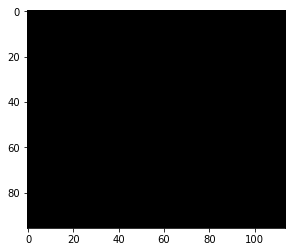

Iteration 905. Loss -133383.65625


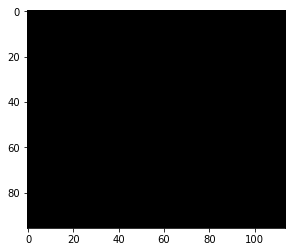

Iteration 906. Loss -133383.65625


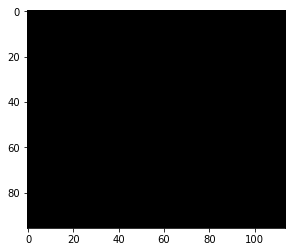

Iteration 907. Loss -133383.65625


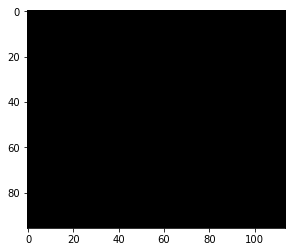

Iteration 908. Loss -133383.65625


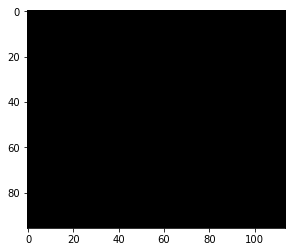

Iteration 909. Loss -133383.65625


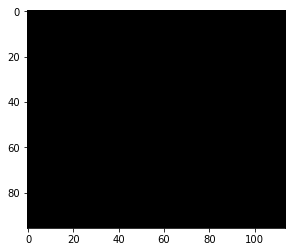

Iteration 910. Loss -133383.65625


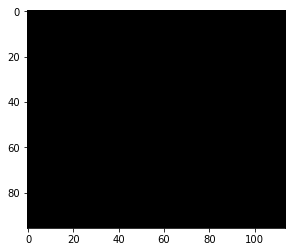

Iteration 911. Loss -133383.65625


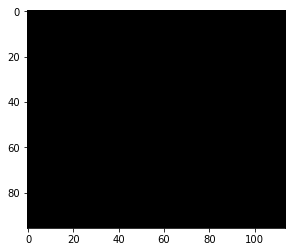

Iteration 912. Loss -133383.65625


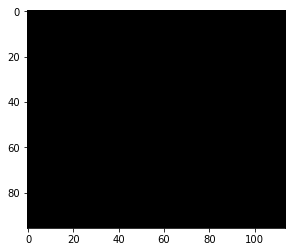

Iteration 913. Loss -133383.65625


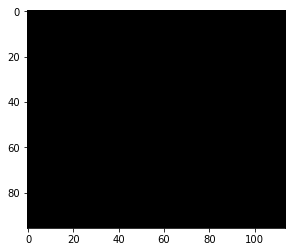

Iteration 914. Loss -133383.65625


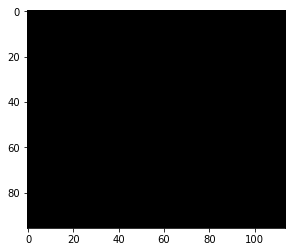

Iteration 915. Loss -133383.65625


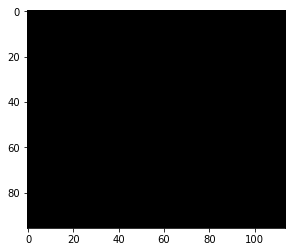

Iteration 916. Loss -133383.65625


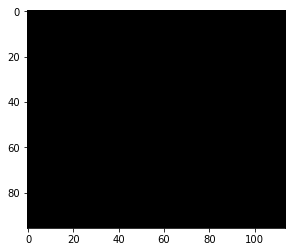

Iteration 917. Loss -133383.65625


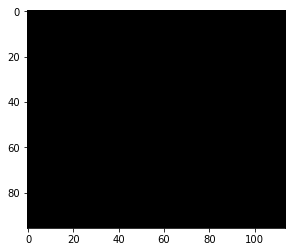

Iteration 918. Loss -133383.65625


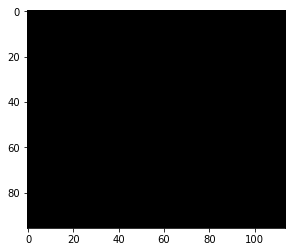

Iteration 919. Loss -133383.65625


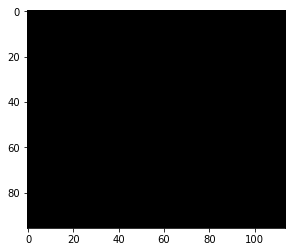

Iteration 920. Loss -133383.65625


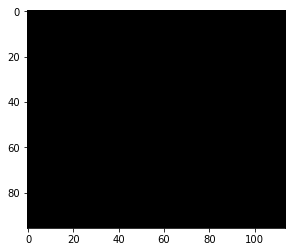

Iteration 921. Loss -133383.65625


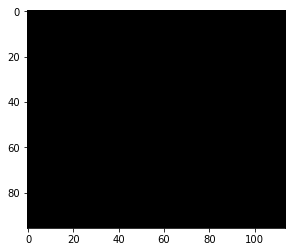

Iteration 922. Loss -133383.65625


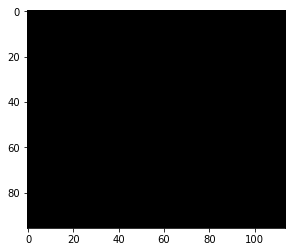

Iteration 923. Loss -133383.65625


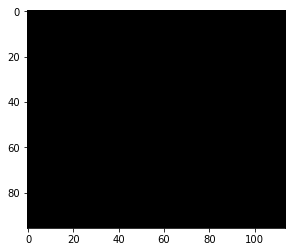

Iteration 924. Loss -133383.65625


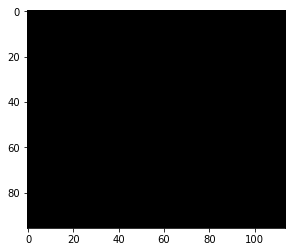

Iteration 925. Loss -133383.65625


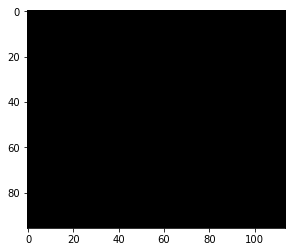

Iteration 926. Loss -133383.65625


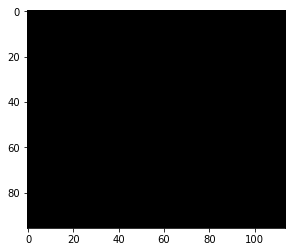

Iteration 927. Loss -133383.65625


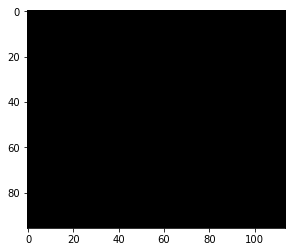

Iteration 928. Loss -133383.65625


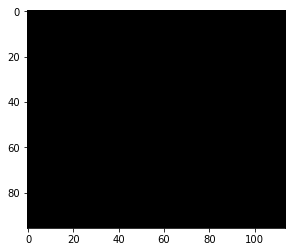

Iteration 929. Loss -133383.65625


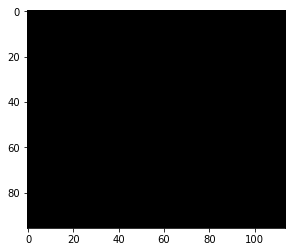

Iteration 930. Loss -133383.65625


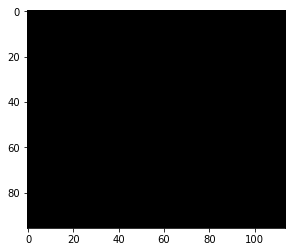

Iteration 931. Loss -133383.65625


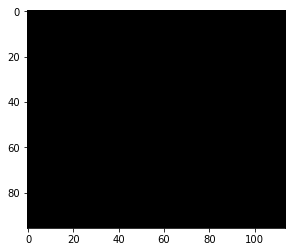

Iteration 932. Loss -133383.65625


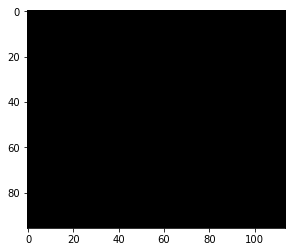

Iteration 933. Loss -133383.65625


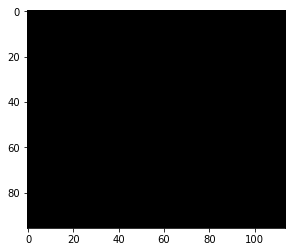

Iteration 934. Loss -133383.65625


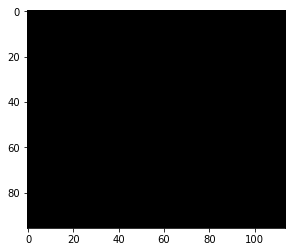

Iteration 935. Loss -133383.65625


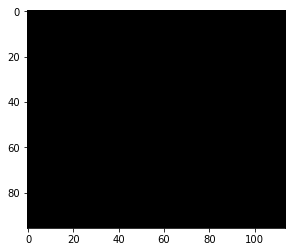

Iteration 936. Loss -133383.65625


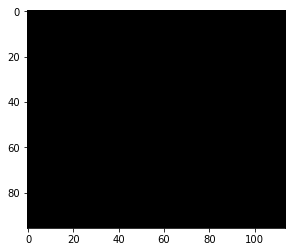

Iteration 937. Loss -133383.65625


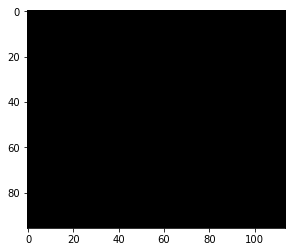

Iteration 938. Loss -133383.65625


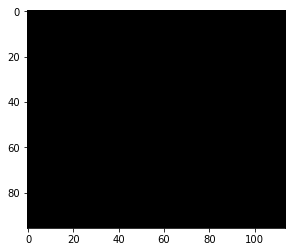

Iteration 939. Loss -133383.65625


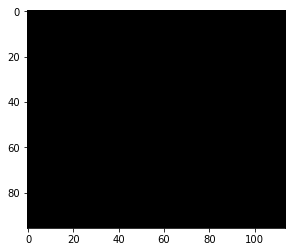

Iteration 940. Loss -133383.65625


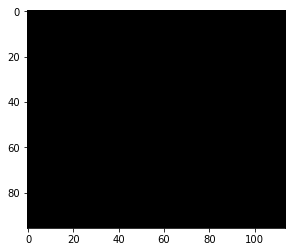

Iteration 941. Loss -133383.65625


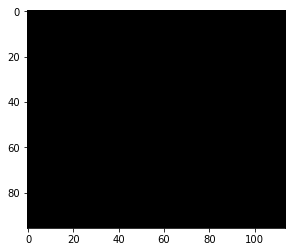

Iteration 942. Loss -133383.65625


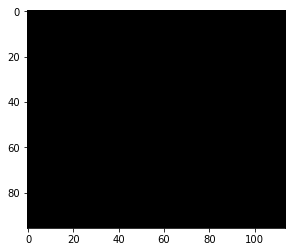

Iteration 943. Loss -133383.65625


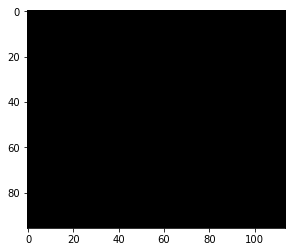

Iteration 944. Loss -133383.65625


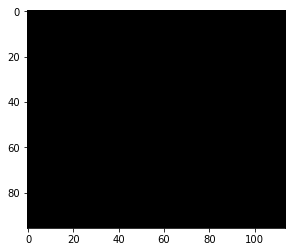

Iteration 945. Loss -133383.65625


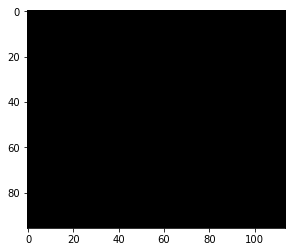

Iteration 946. Loss -133383.65625


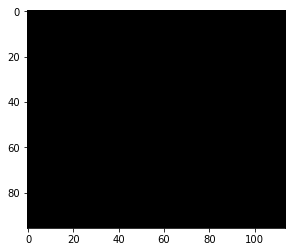

Iteration 947. Loss -133383.65625


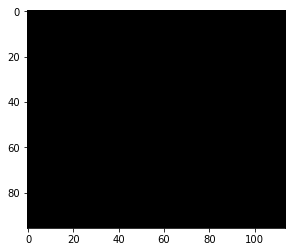

Iteration 948. Loss -133383.65625


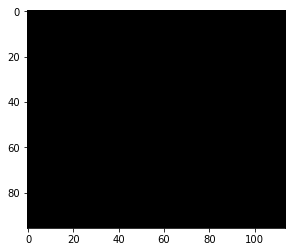

Iteration 949. Loss -133383.65625


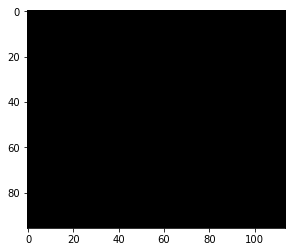

Iteration 950. Loss -133383.65625


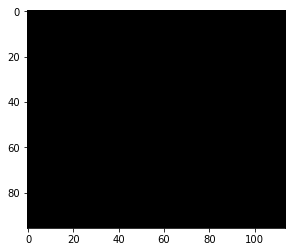

Iteration 951. Loss -133383.65625


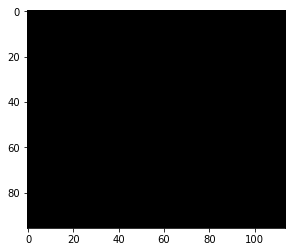

Iteration 952. Loss -133383.65625


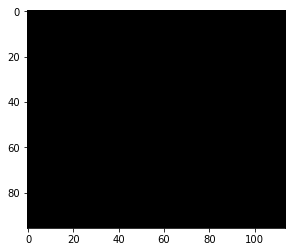

Iteration 953. Loss -133383.65625


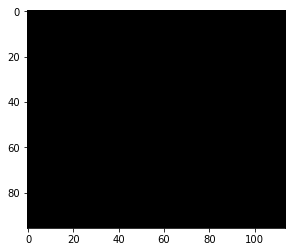

Iteration 954. Loss -133383.65625


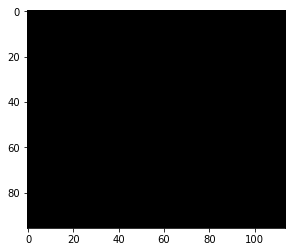

Iteration 955. Loss -133383.65625


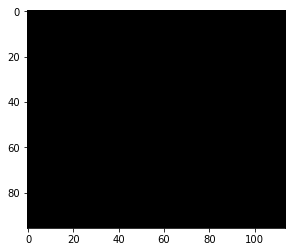

Iteration 956. Loss -133383.65625


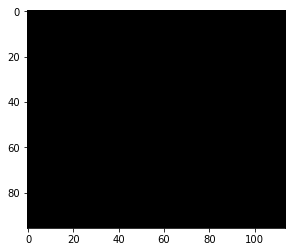

Iteration 957. Loss -133383.65625


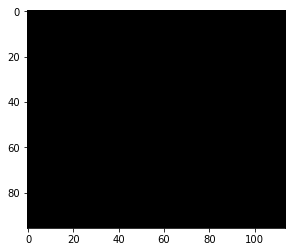

Iteration 958. Loss -133383.65625


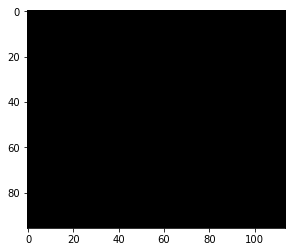

Iteration 959. Loss -133383.65625


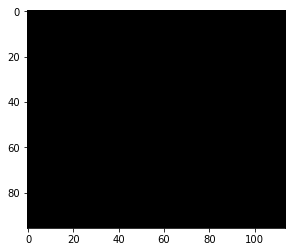

Iteration 960. Loss -133383.65625


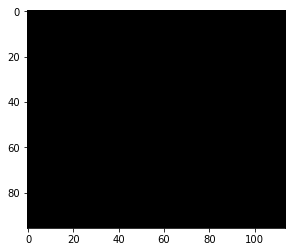

Iteration 961. Loss -133383.65625


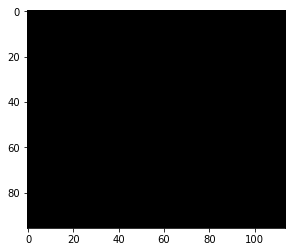

Iteration 962. Loss -133383.65625


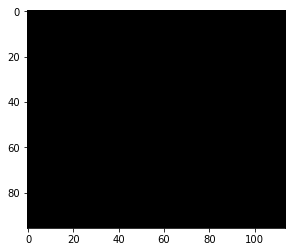

Iteration 963. Loss -133383.65625


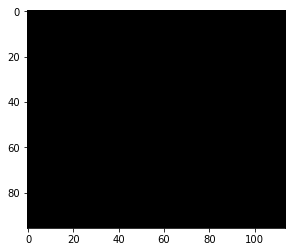

Iteration 964. Loss -133383.65625


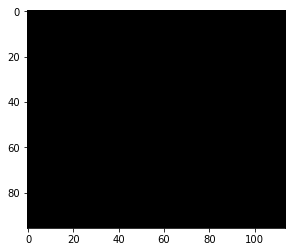

Iteration 965. Loss -133383.65625


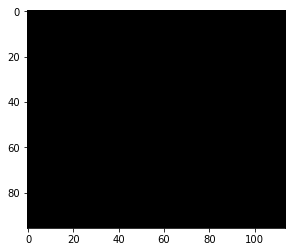

Iteration 966. Loss -133383.65625


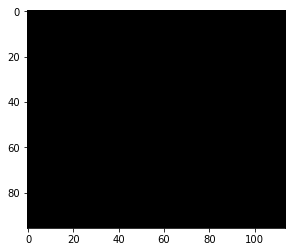

Iteration 967. Loss -133383.65625


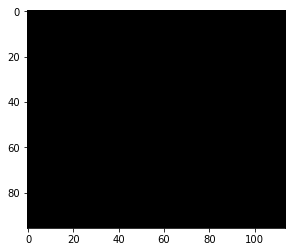

Iteration 968. Loss -133383.65625


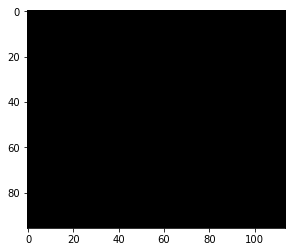

Iteration 969. Loss -133383.65625


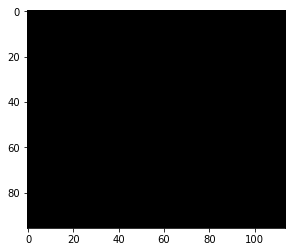

Iteration 970. Loss -133383.65625


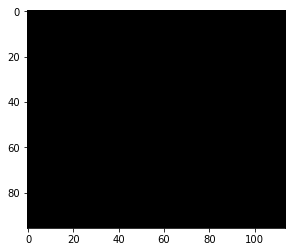

Iteration 971. Loss -133383.65625


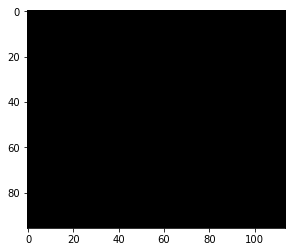

Iteration 972. Loss -133383.65625


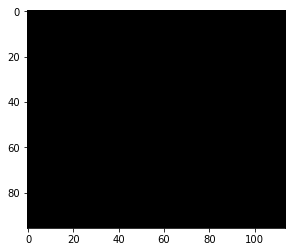

Iteration 973. Loss -133383.65625


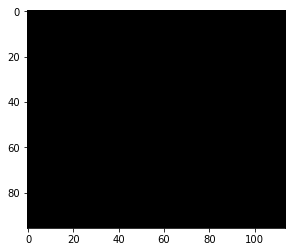

Iteration 974. Loss -133383.65625


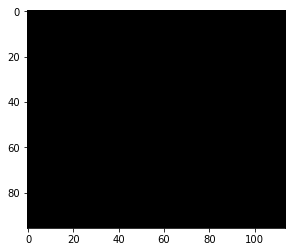

Iteration 975. Loss -133383.65625


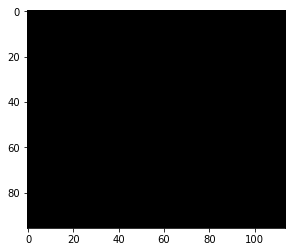

Iteration 976. Loss -133383.65625


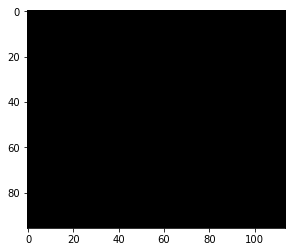

Iteration 977. Loss -133383.65625


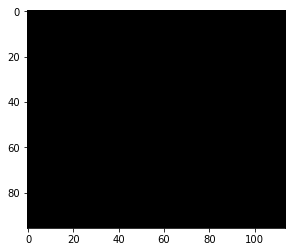

Iteration 978. Loss -133383.65625


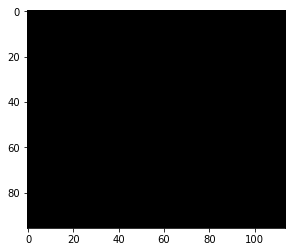

Iteration 979. Loss -133383.65625


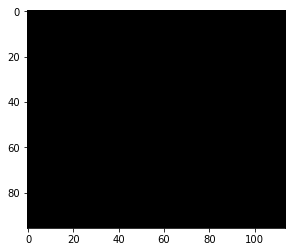

Iteration 980. Loss -133383.65625


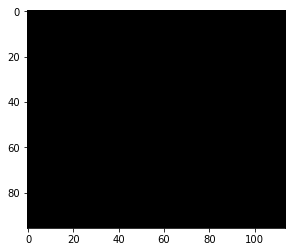

Iteration 981. Loss -133383.65625


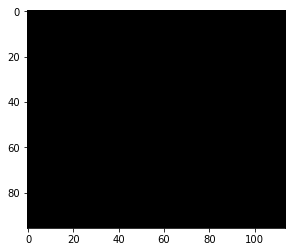

Iteration 982. Loss -133383.65625


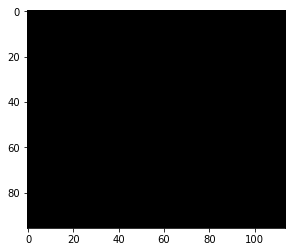

Iteration 983. Loss -133383.65625


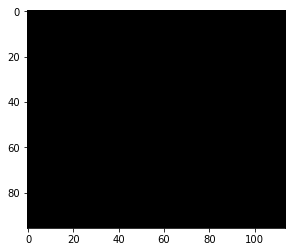

Iteration 984. Loss -133383.65625


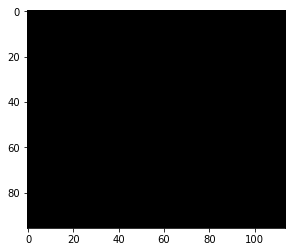

Iteration 985. Loss -133383.65625


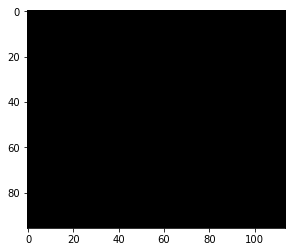

Iteration 986. Loss -133383.65625


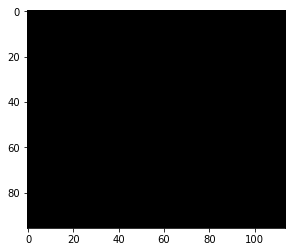

Iteration 987. Loss -133383.65625


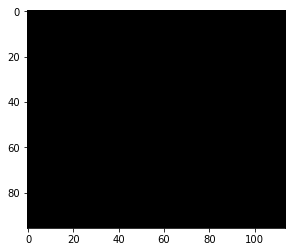

Iteration 988. Loss -133383.65625


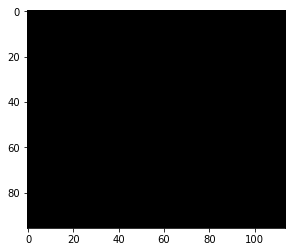

Iteration 989. Loss -133383.65625


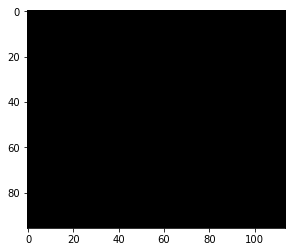

Iteration 990. Loss -133383.65625


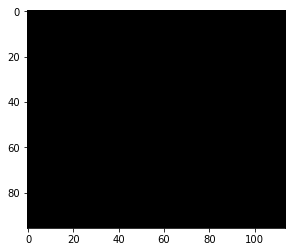

Iteration 991. Loss -133383.65625


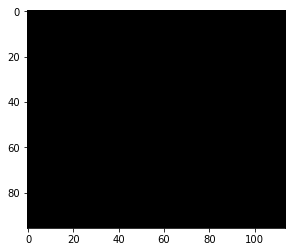

Iteration 992. Loss -133383.65625


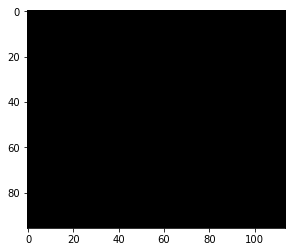

Iteration 993. Loss -133383.65625


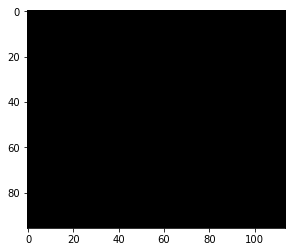

Iteration 994. Loss -133383.65625


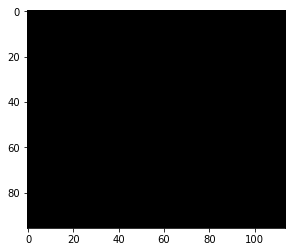

Iteration 995. Loss -133383.65625


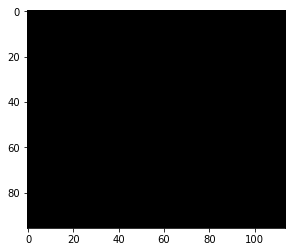

Iteration 996. Loss -133383.65625


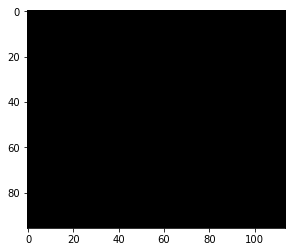

Iteration 997. Loss -133383.65625


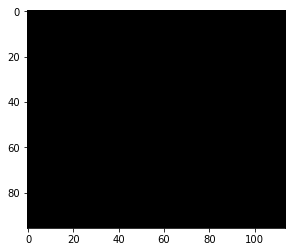

Iteration 998. Loss -133383.65625


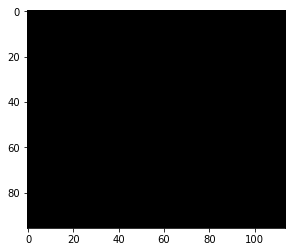

Iteration 999. Loss -133383.65625


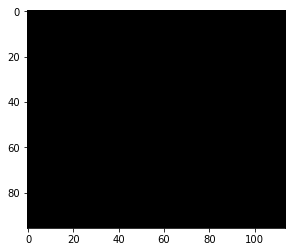

Iteration 1000. Loss -133383.65625


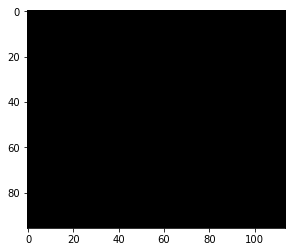

Iteration 1001. Loss -133383.65625


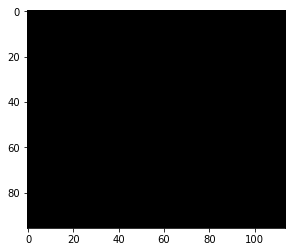

Iteration 1002. Loss -133383.65625


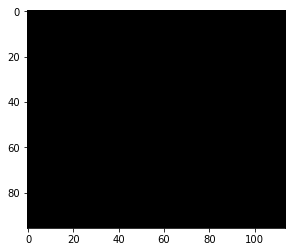

Iteration 1003. Loss -133383.65625


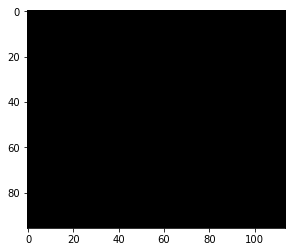

Iteration 1004. Loss -133383.65625


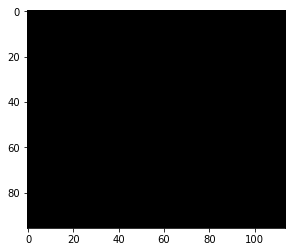

Iteration 1005. Loss -133383.65625


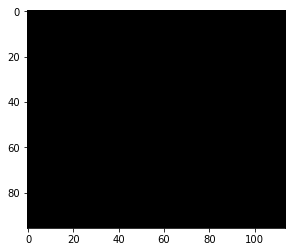

Iteration 1006. Loss -133383.65625


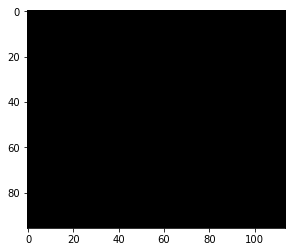

Iteration 1007. Loss -133383.65625


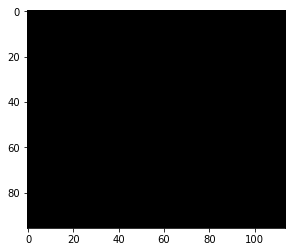

Iteration 1008. Loss -133383.65625


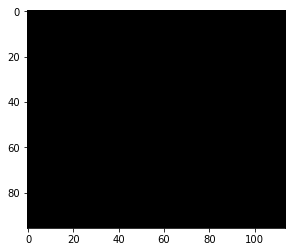

Iteration 1009. Loss -133383.65625


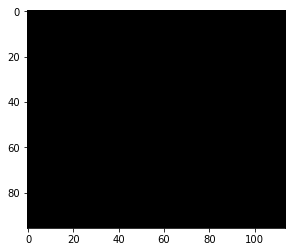

Iteration 1010. Loss -133383.65625


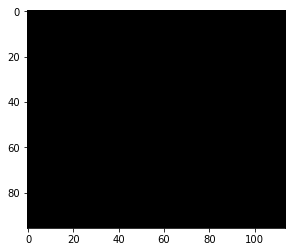

Iteration 1011. Loss -133383.65625


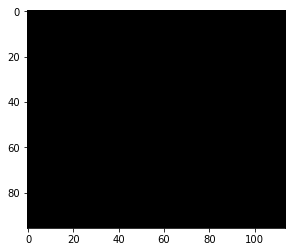

Iteration 1012. Loss -133383.65625


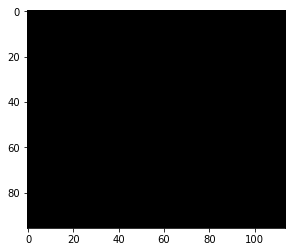

Iteration 1013. Loss -133383.65625


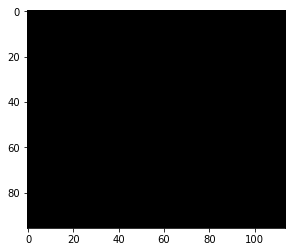

Iteration 1014. Loss -133383.65625


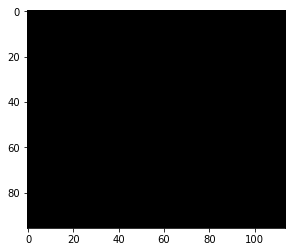

Iteration 1015. Loss -133383.65625


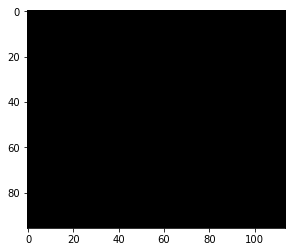

Iteration 1016. Loss -133383.65625


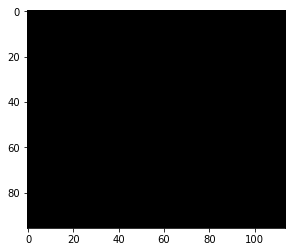

Iteration 1017. Loss -133383.65625


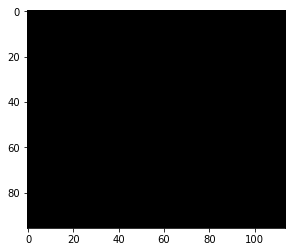

Iteration 1018. Loss -133383.65625


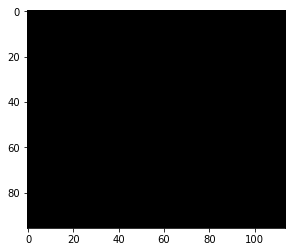

Iteration 1019. Loss -133383.65625


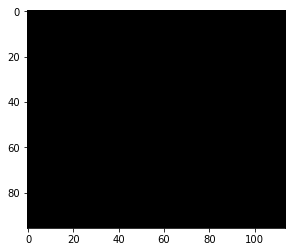

Iteration 1020. Loss -133383.65625


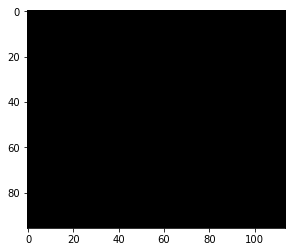

Iteration 1021. Loss -133383.65625


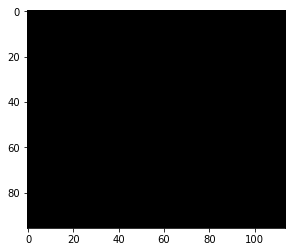

Iteration 1022. Loss -133383.65625


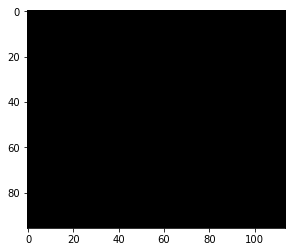

Iteration 1023. Loss -133383.65625


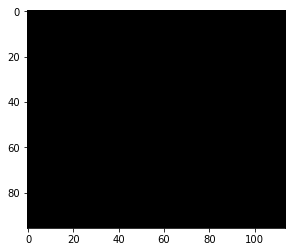

Iteration 1024. Loss -133383.65625


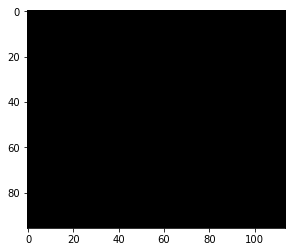

Iteration 1025. Loss -133383.65625


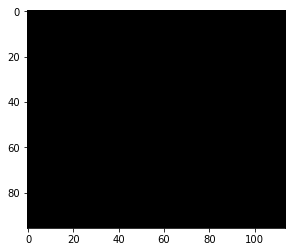

Iteration 1026. Loss -133383.65625


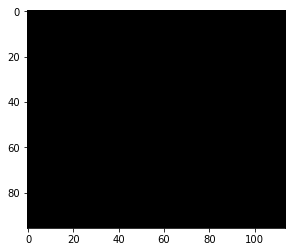

Iteration 1027. Loss -133383.65625


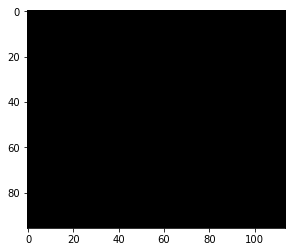

Iteration 1028. Loss -133383.65625


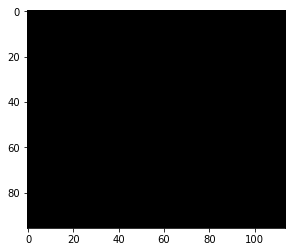

Iteration 1029. Loss -133383.65625


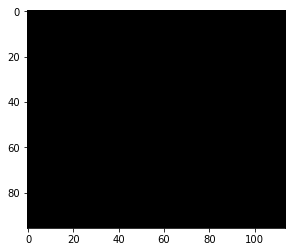

Iteration 1030. Loss -133383.65625


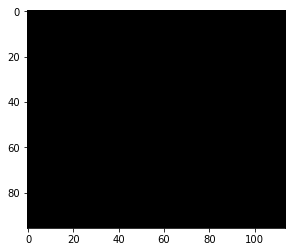

Iteration 1031. Loss -133383.65625


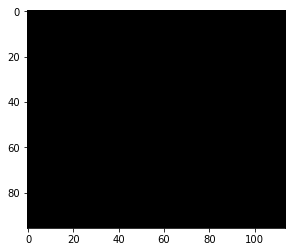

Iteration 1032. Loss -133383.65625


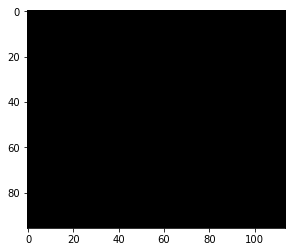

Iteration 1033. Loss -133383.65625


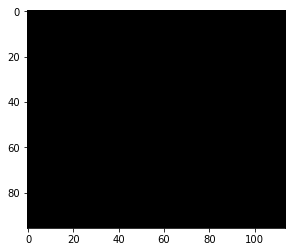

Iteration 1034. Loss -133383.65625


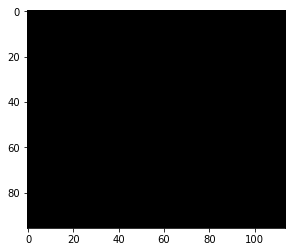

Iteration 1035. Loss -133383.65625


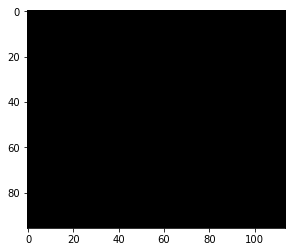

Iteration 1036. Loss -133383.65625


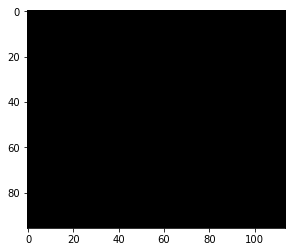

Iteration 1037. Loss -133383.65625


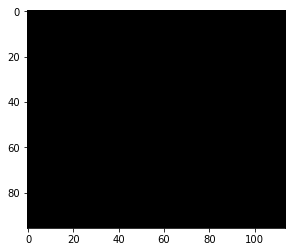

Iteration 1038. Loss -133383.65625


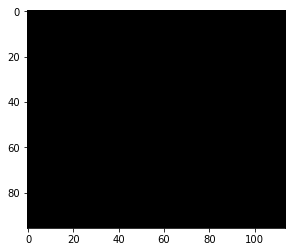

Iteration 1039. Loss -133383.65625


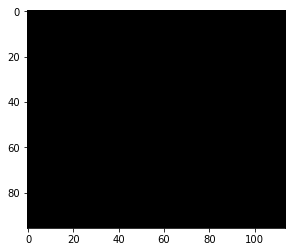

Iteration 1040. Loss -133383.65625


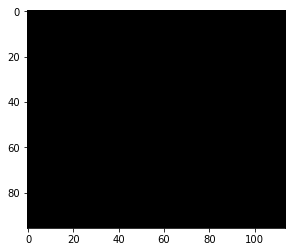

Iteration 1041. Loss -133383.65625


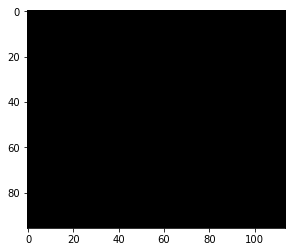

Iteration 1042. Loss -133383.65625


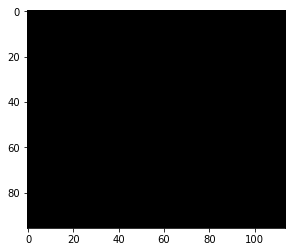

Iteration 1043. Loss -133383.65625


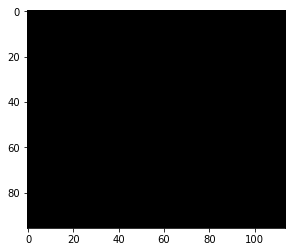

Iteration 1044. Loss -133383.65625


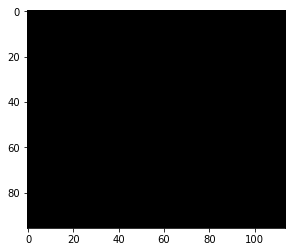

Iteration 1045. Loss -133383.65625


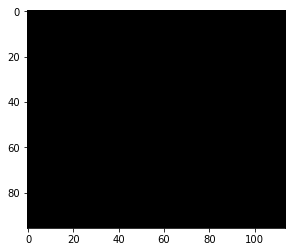

Iteration 1046. Loss -133383.65625


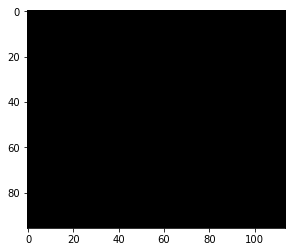

Iteration 1047. Loss -133383.65625


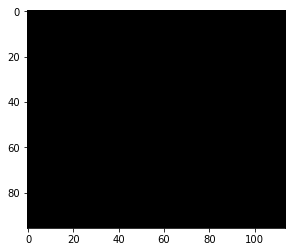

Iteration 1048. Loss -133383.65625


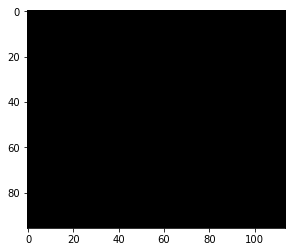

Iteration 1049. Loss -133383.65625


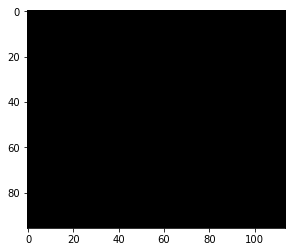

Iteration 1050. Loss -133383.65625


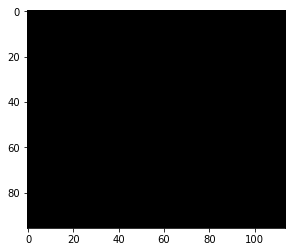

Iteration 1051. Loss -133383.65625


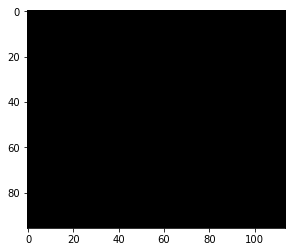

Iteration 1052. Loss -133383.65625


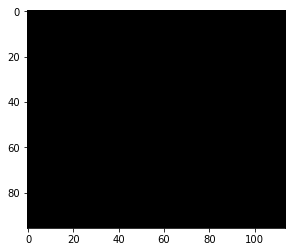

Iteration 1053. Loss -133383.65625


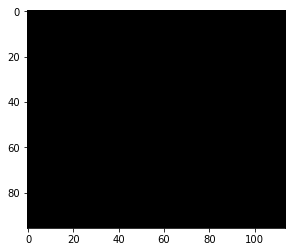

Iteration 1054. Loss -133383.65625


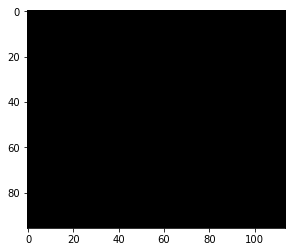

Iteration 1055. Loss -133383.65625


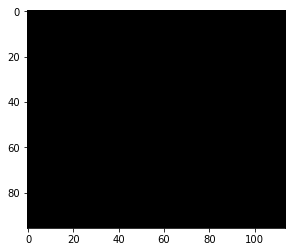

Iteration 1056. Loss -133383.65625


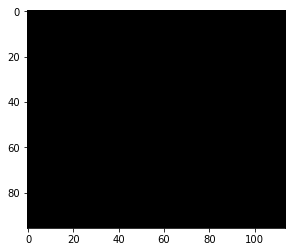

Iteration 1057. Loss -133383.65625


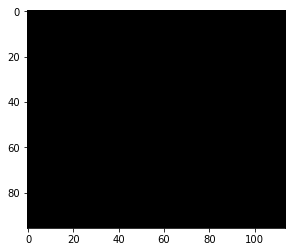

Iteration 1058. Loss -133383.65625


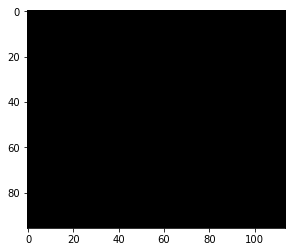

Iteration 1059. Loss -133383.65625


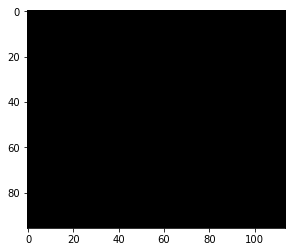

Iteration 1060. Loss -133383.65625


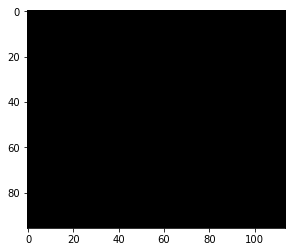

Iteration 1061. Loss -133383.65625


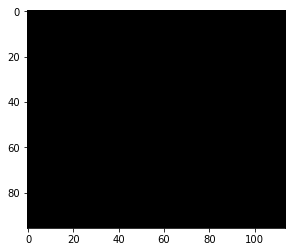

Iteration 1062. Loss -133383.65625


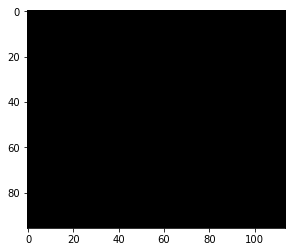

Iteration 1063. Loss -133383.65625


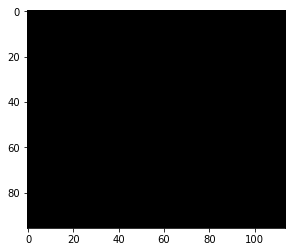

Iteration 1064. Loss -133383.65625


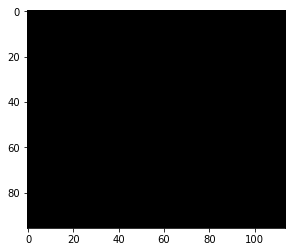

Iteration 1065. Loss -133383.65625


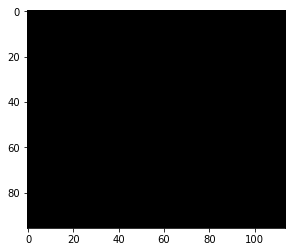

Iteration 1066. Loss -133383.65625


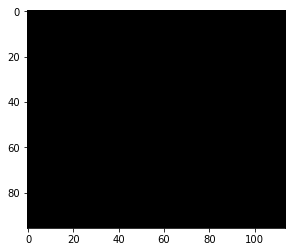

Iteration 1067. Loss -133383.65625


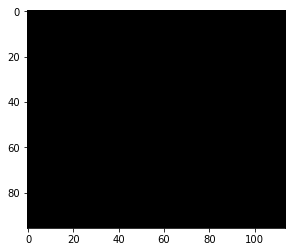

Iteration 1068. Loss -133383.65625


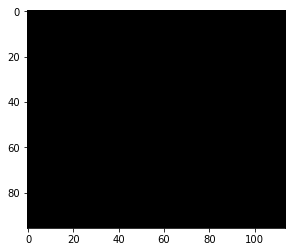

Iteration 1069. Loss -133383.65625


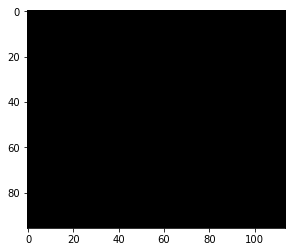

Iteration 1070. Loss -133383.65625


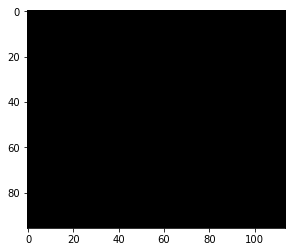

Iteration 1071. Loss -133383.65625


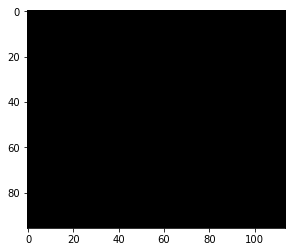

Iteration 1072. Loss -133383.65625


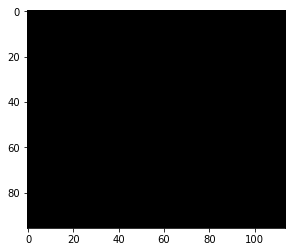

Iteration 1073. Loss -133383.65625


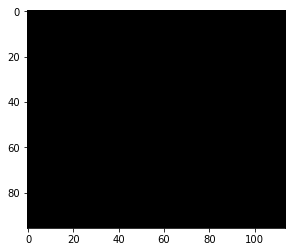

Iteration 1074. Loss -133383.65625


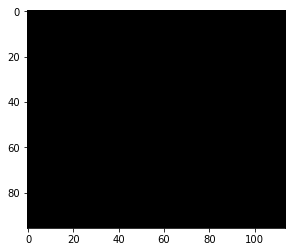

Iteration 1075. Loss -133383.65625


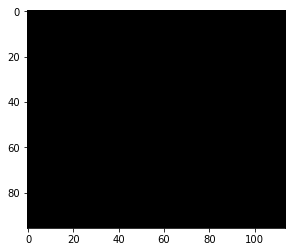

Iteration 1076. Loss -133383.65625


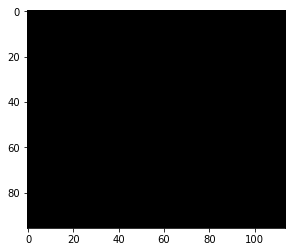

Iteration 1077. Loss -133383.65625


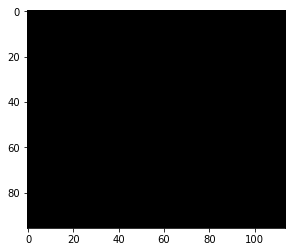

Iteration 1078. Loss -133383.65625


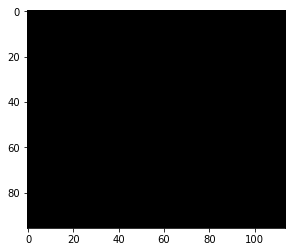

Iteration 1079. Loss -133383.65625


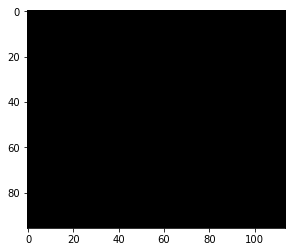

Iteration 1080. Loss -133383.65625


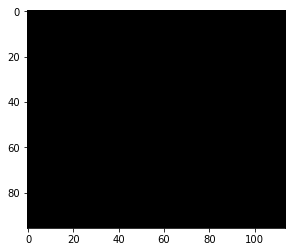

Iteration 1081. Loss -133383.65625


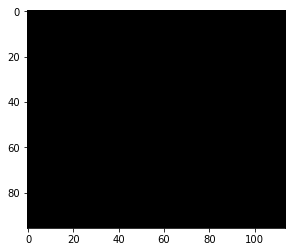

Iteration 1082. Loss -133383.65625


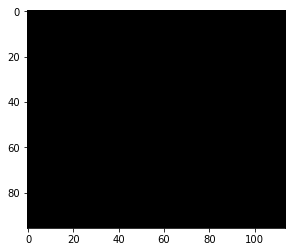

Iteration 1083. Loss -133383.65625


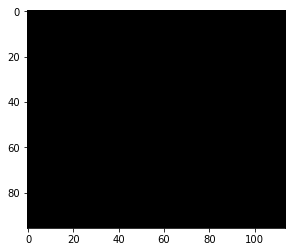

Iteration 1084. Loss -133383.65625


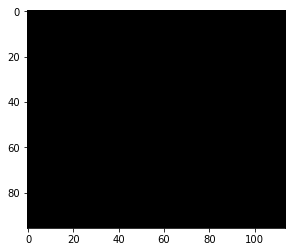

Iteration 1085. Loss -133383.65625


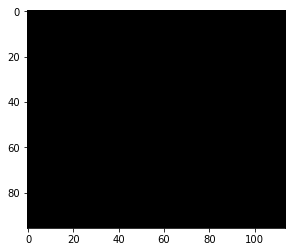

Iteration 1086. Loss -133383.65625


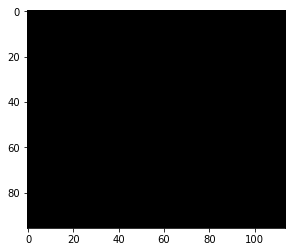

Iteration 1087. Loss -133383.65625


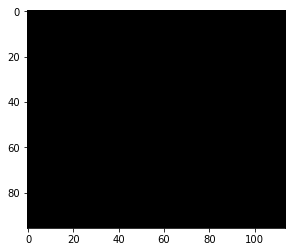

Iteration 1088. Loss -133383.65625


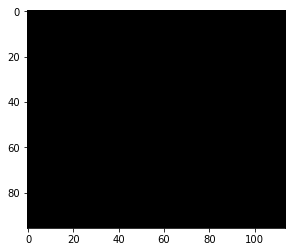

Iteration 1089. Loss -133383.65625


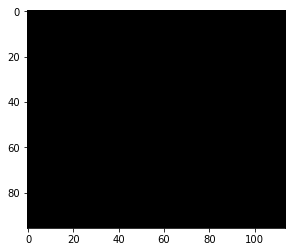

Iteration 1090. Loss -133383.65625


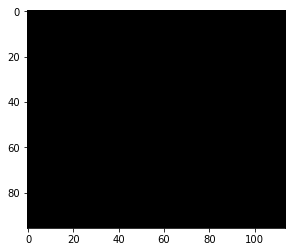

Iteration 1091. Loss -133383.65625


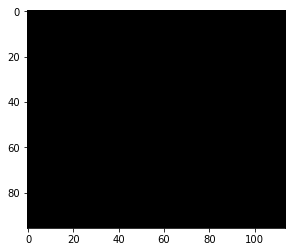

Iteration 1092. Loss -133383.65625


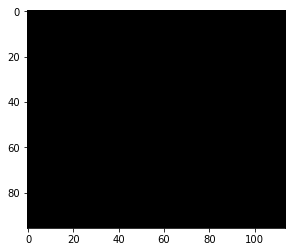

Iteration 1093. Loss -133383.65625


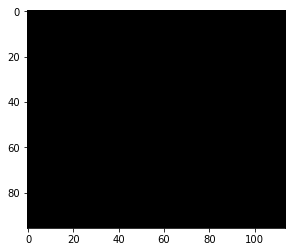

Iteration 1094. Loss -133383.65625


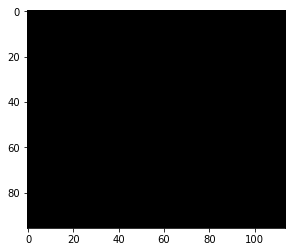

Iteration 1095. Loss -133383.65625


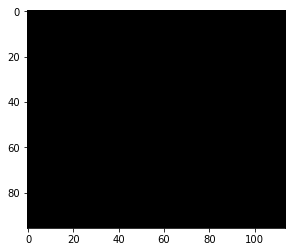

Iteration 1096. Loss -133383.65625


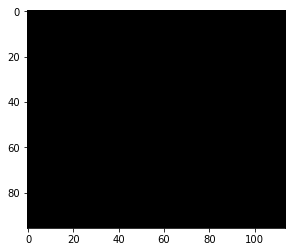

Iteration 1097. Loss -133383.65625


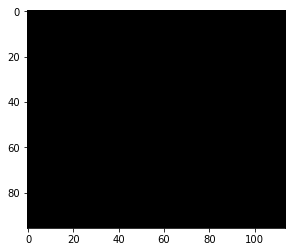

Iteration 1098. Loss -133383.65625


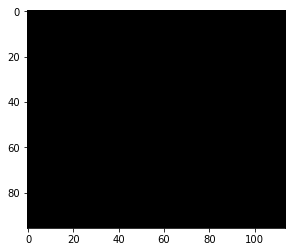

Iteration 1099. Loss -133383.65625


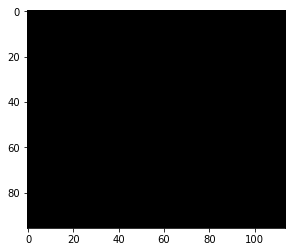

Iteration 1100. Loss -133383.65625


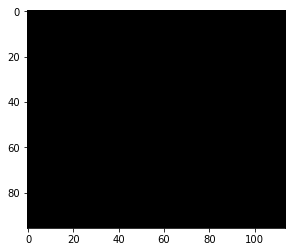

Iteration 1101. Loss -133383.65625


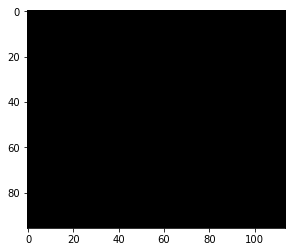

Iteration 1102. Loss -133383.65625


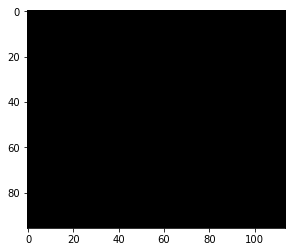

Iteration 1103. Loss -133383.65625


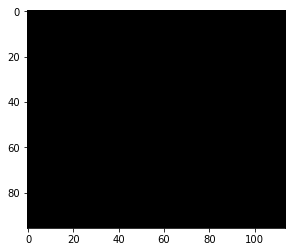

Iteration 1104. Loss -133383.65625


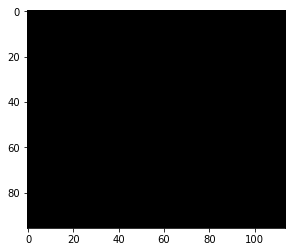

Iteration 1105. Loss -133383.65625


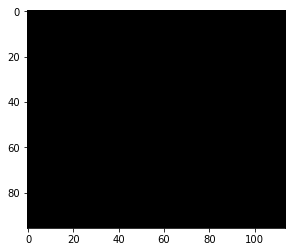

Iteration 1106. Loss -133383.65625


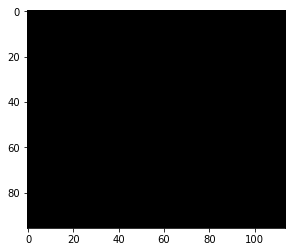

Iteration 1107. Loss -133383.65625


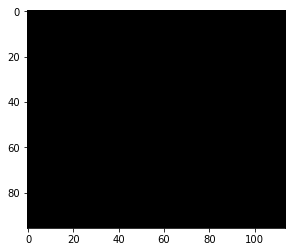

Iteration 1108. Loss -133383.65625


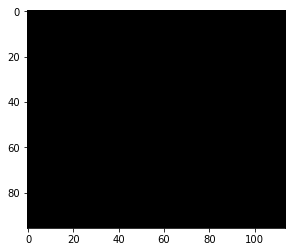

Iteration 1109. Loss -133383.65625


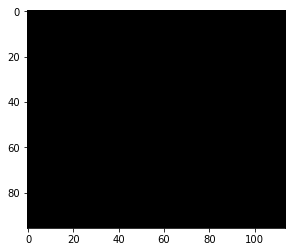

Iteration 1110. Loss -133383.65625


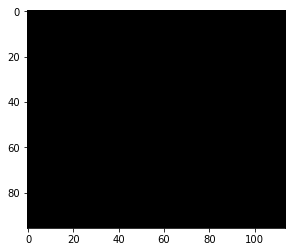

Iteration 1111. Loss -133383.65625


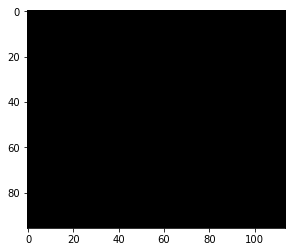

Iteration 1112. Loss -133383.65625


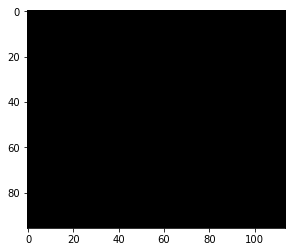

Iteration 1113. Loss -133383.65625


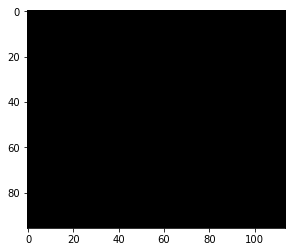

Iteration 1114. Loss -133383.65625


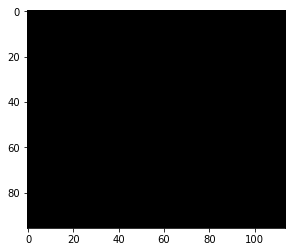

Iteration 1115. Loss -133383.65625


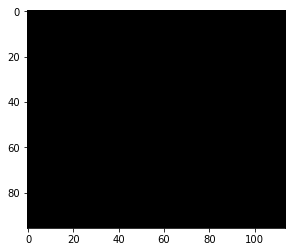

Iteration 1116. Loss -133383.65625


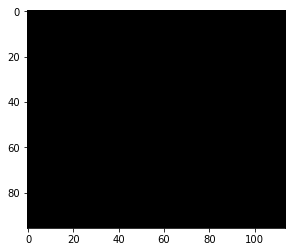

Iteration 1117. Loss -133383.65625


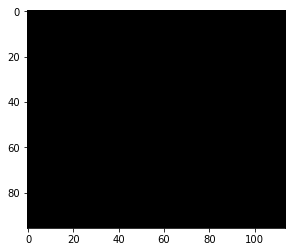

Iteration 1118. Loss -133383.65625


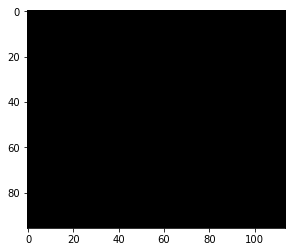

Iteration 1119. Loss -133383.65625


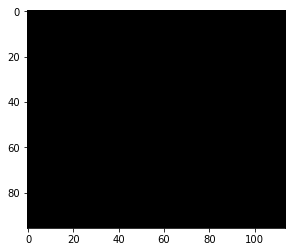

Iteration 1120. Loss -133383.65625


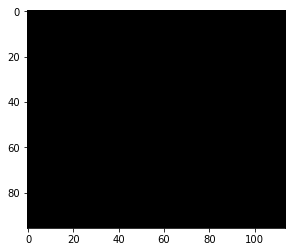

Iteration 1121. Loss -133383.65625


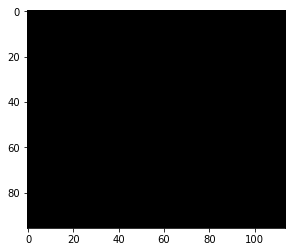

Iteration 1122. Loss -133383.65625


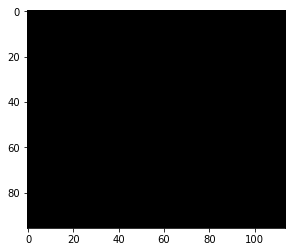

Iteration 1123. Loss -133383.65625


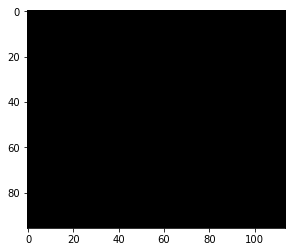

Iteration 1124. Loss -133383.65625


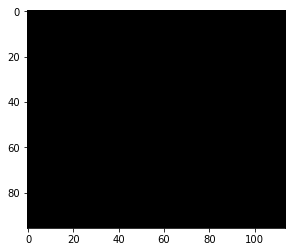

Iteration 1125. Loss -133383.65625


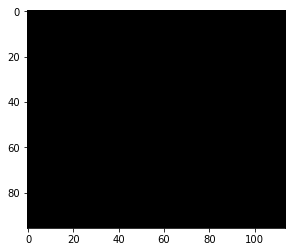

Iteration 1126. Loss -133383.65625


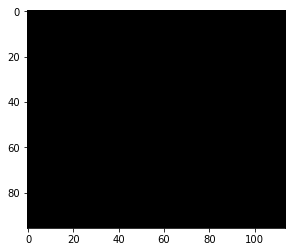

Iteration 1127. Loss -133383.65625


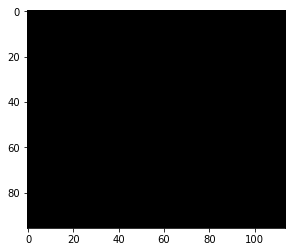

Iteration 1128. Loss -133383.65625


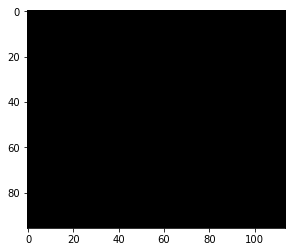

Iteration 1129. Loss -133383.65625


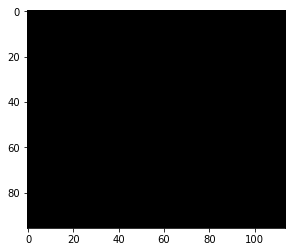

Iteration 1130. Loss -133383.65625


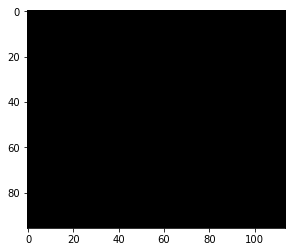

Iteration 1131. Loss -133383.65625


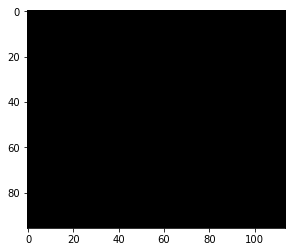

Iteration 1132. Loss -133383.65625


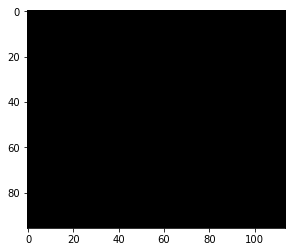

Iteration 1133. Loss -133383.65625


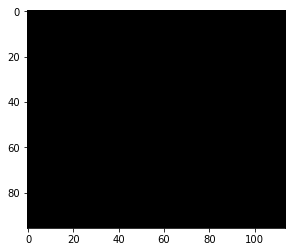

Iteration 1134. Loss -133383.65625


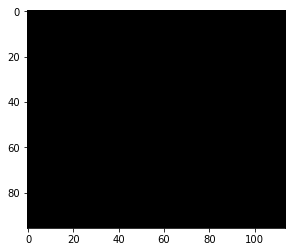

Iteration 1135. Loss -133383.65625


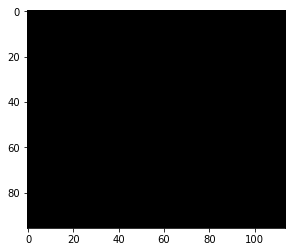

Iteration 1136. Loss -133383.65625


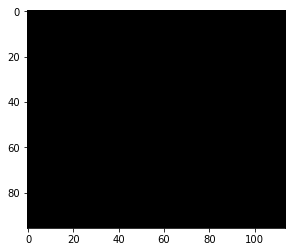

Iteration 1137. Loss -133383.65625


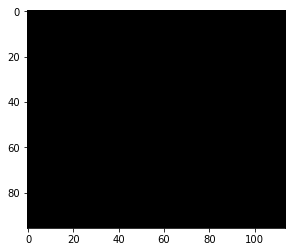

Iteration 1138. Loss -133383.65625


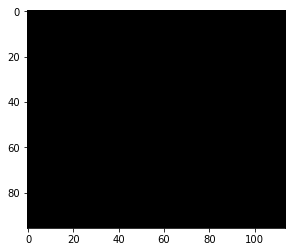

Iteration 1139. Loss -133383.65625


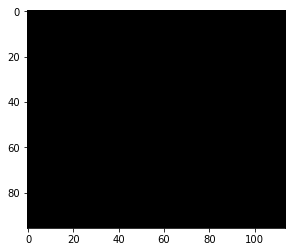

Iteration 1140. Loss -133383.65625


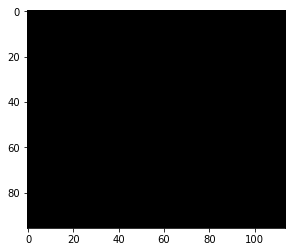

Iteration 1141. Loss -133383.65625


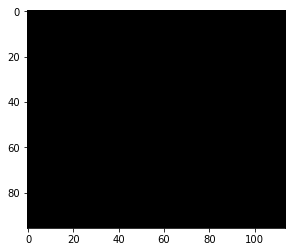

Iteration 1142. Loss -133383.65625


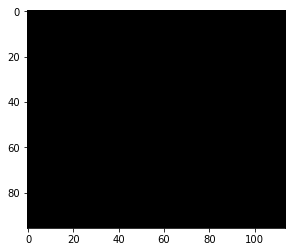

Iteration 1143. Loss -133383.65625


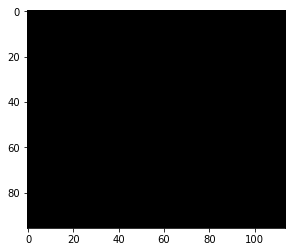

Iteration 1144. Loss -133383.65625


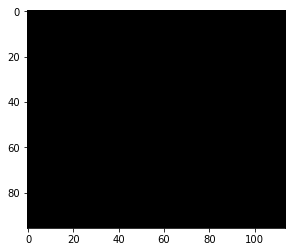

Iteration 1145. Loss -133383.65625


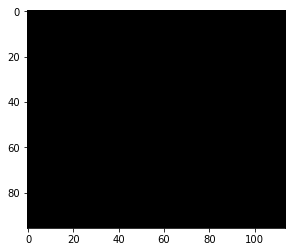

Iteration 1146. Loss -133383.65625


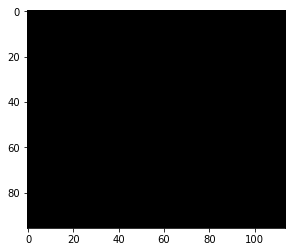

Iteration 1147. Loss -133383.65625


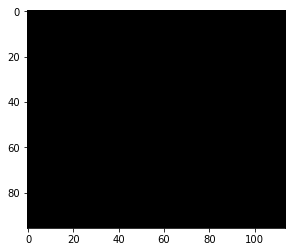

Iteration 1148. Loss -133383.65625


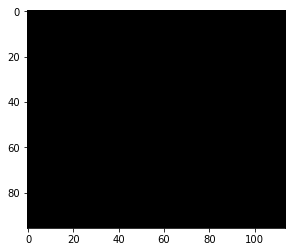

Iteration 1149. Loss -133383.65625


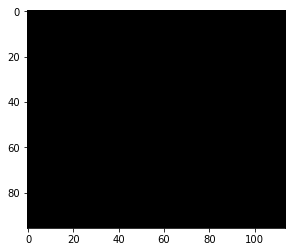

Iteration 1150. Loss -133383.65625


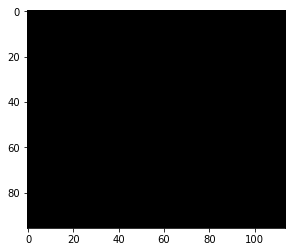

Iteration 1151. Loss -133383.65625


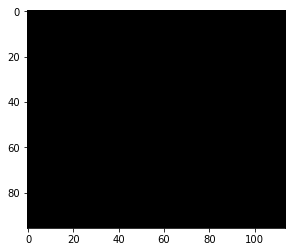

Iteration 1152. Loss -133383.65625


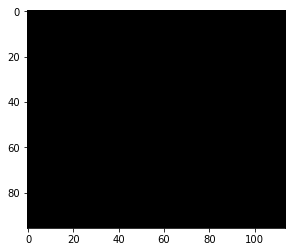

Iteration 1153. Loss -133383.65625


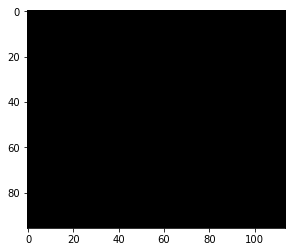

Iteration 1154. Loss -133383.65625


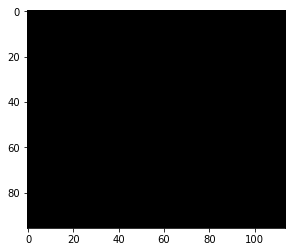

Iteration 1155. Loss -133383.65625


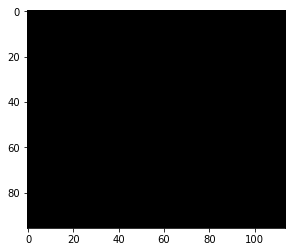

Iteration 1156. Loss -133383.65625


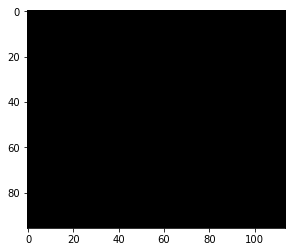

Iteration 1157. Loss -133383.65625


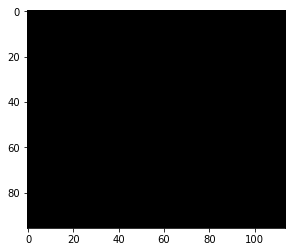

Iteration 1158. Loss -133383.65625


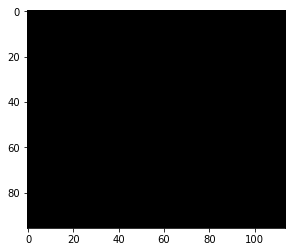

Iteration 1159. Loss -133383.65625


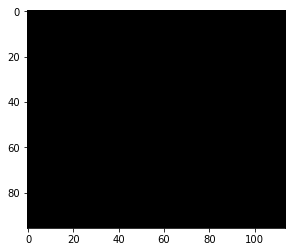

Iteration 1160. Loss -133383.65625


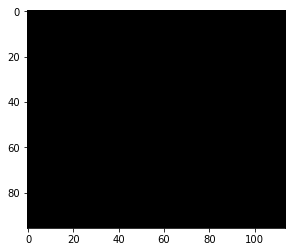

Iteration 1161. Loss -133383.65625


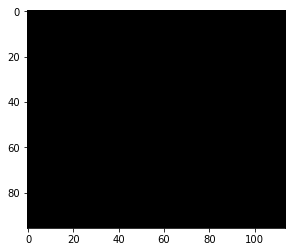

Iteration 1162. Loss -133383.65625


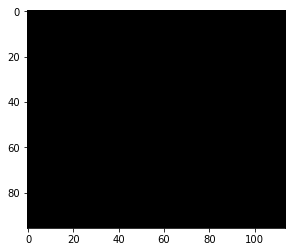

Iteration 1163. Loss -133383.65625


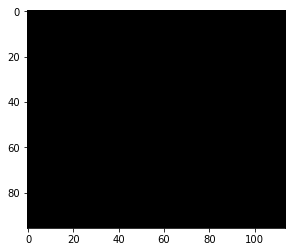

Iteration 1164. Loss -133383.65625


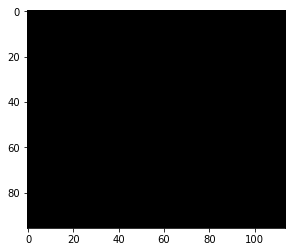

Iteration 1165. Loss -133383.65625


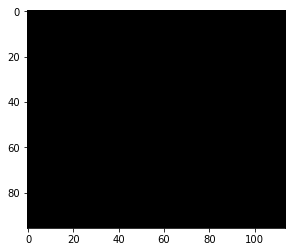

Iteration 1166. Loss -133383.65625


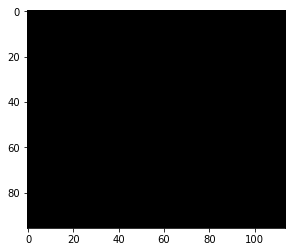

Iteration 1167. Loss -133383.65625


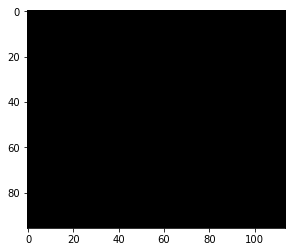

Iteration 1168. Loss -133383.65625


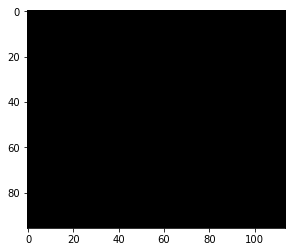

Iteration 1169. Loss -133383.65625


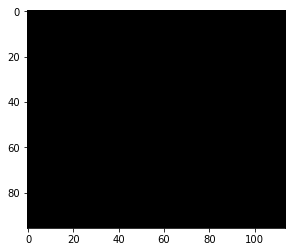

Iteration 1170. Loss -133383.65625


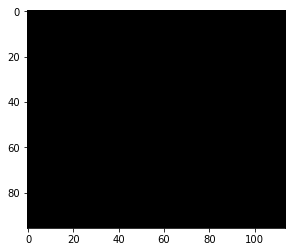

Iteration 1171. Loss -133383.65625


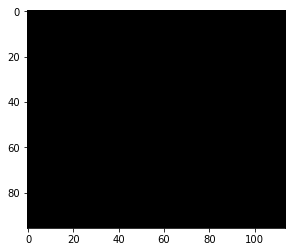

Iteration 1172. Loss -133383.65625


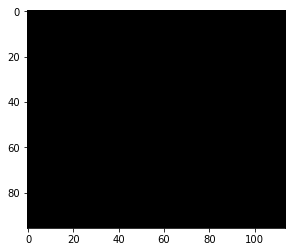

Iteration 1173. Loss -133383.65625


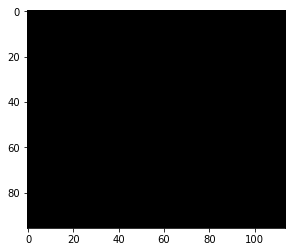

Iteration 1174. Loss -133383.65625


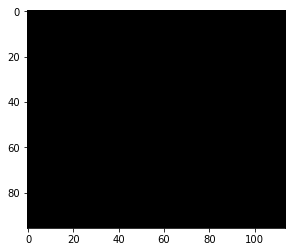

Iteration 1175. Loss -133383.65625


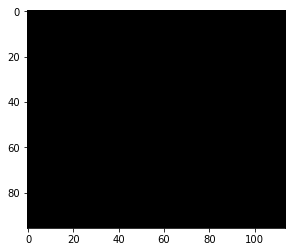

Iteration 1176. Loss -133383.65625


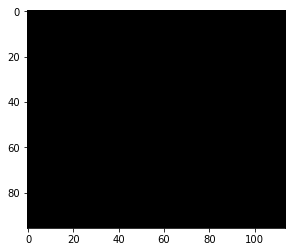

Iteration 1177. Loss -133383.65625


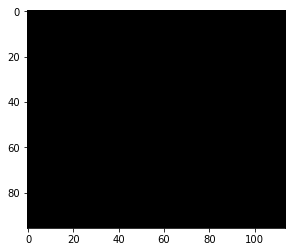

Iteration 1178. Loss -133383.65625


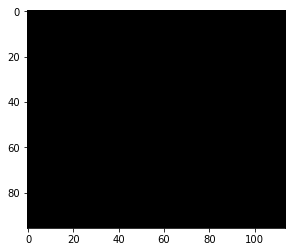

Iteration 1179. Loss -133383.65625


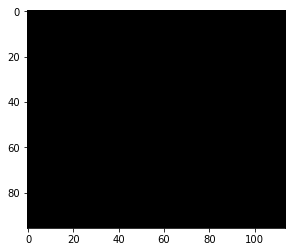

Iteration 1180. Loss -133383.65625


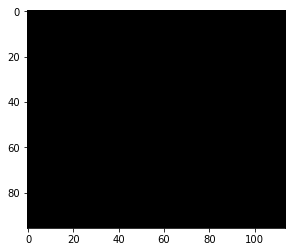

Iteration 1181. Loss -133383.65625


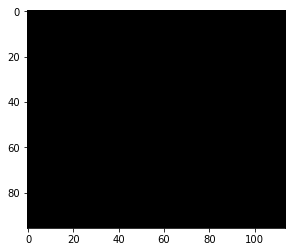

Iteration 1182. Loss -133383.65625


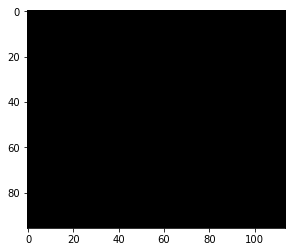

Iteration 1183. Loss -133383.65625


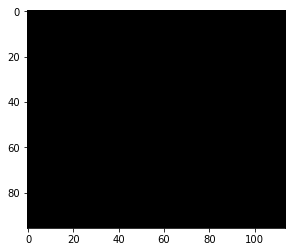

Iteration 1184. Loss -133383.65625


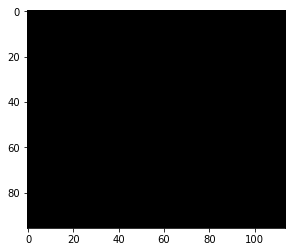

Iteration 1185. Loss -133383.65625


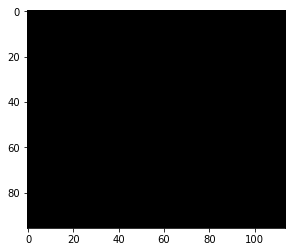

Iteration 1186. Loss -133383.65625


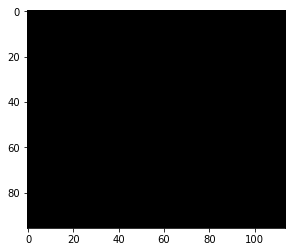

Iteration 1187. Loss -133383.65625


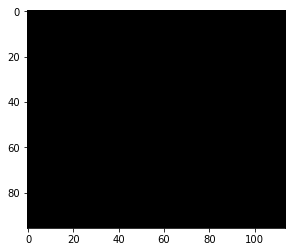

Iteration 1188. Loss -133383.65625


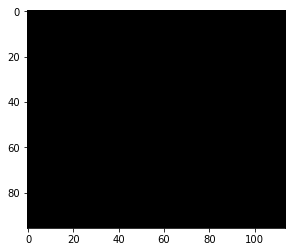

Iteration 1189. Loss -133383.65625


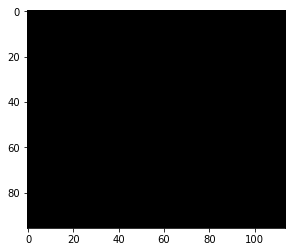

Iteration 1190. Loss -133383.65625


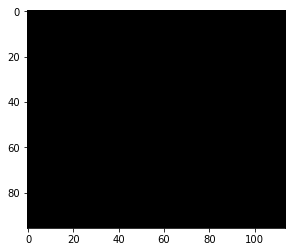

Iteration 1191. Loss -133383.65625


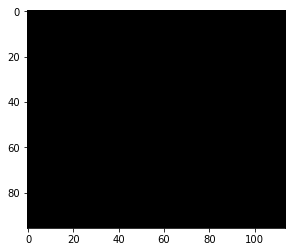

Iteration 1192. Loss -133383.65625


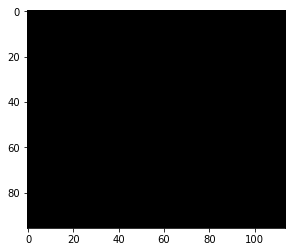

Iteration 1193. Loss -133383.65625


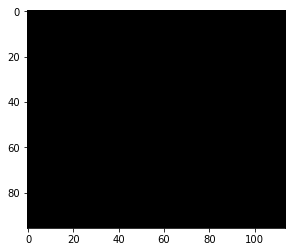

Iteration 1194. Loss -133383.65625


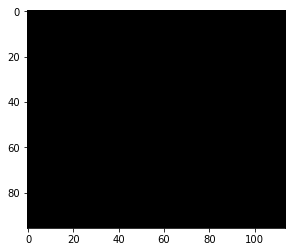

Iteration 1195. Loss -133383.65625


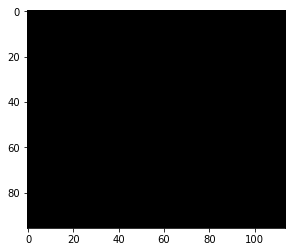

Iteration 1196. Loss -133383.65625


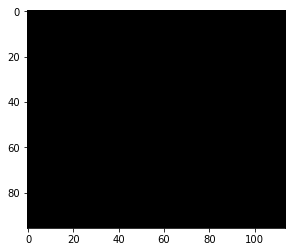

Iteration 1197. Loss -133383.65625


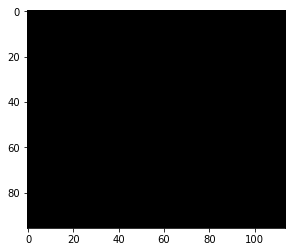

Iteration 1198. Loss -133383.65625


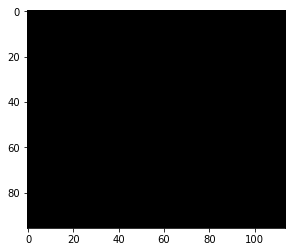

Iteration 1199. Loss -133383.65625


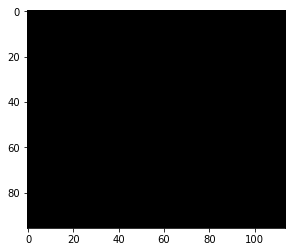

Iteration 1200. Loss -133383.65625


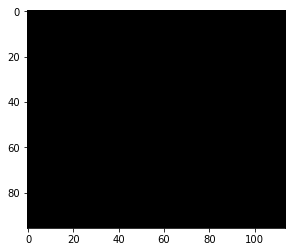

Iteration 1201. Loss -133383.65625


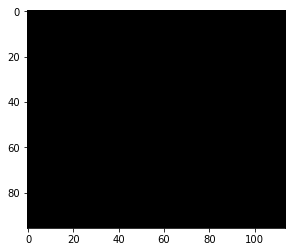

Iteration 1202. Loss -133383.65625


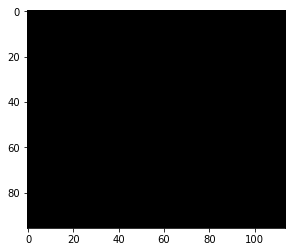

Iteration 1203. Loss -133383.65625


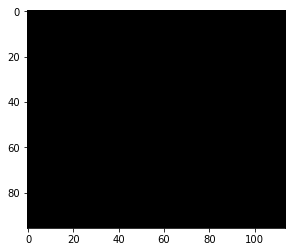

Iteration 1204. Loss -133383.65625


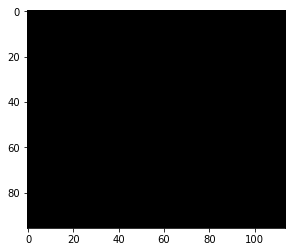

Iteration 1205. Loss -133383.65625


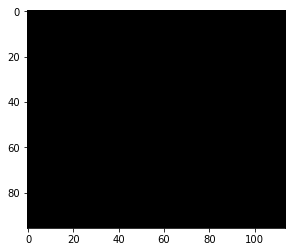

Iteration 1206. Loss -133383.65625


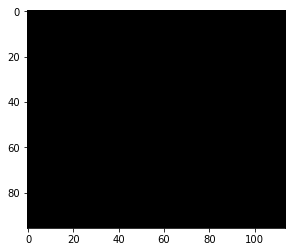

Iteration 1207. Loss -133383.65625


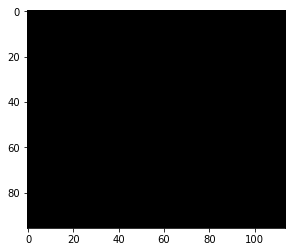

Iteration 1208. Loss -133383.65625


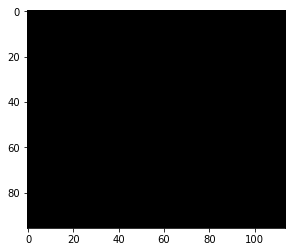

Iteration 1209. Loss -133383.65625


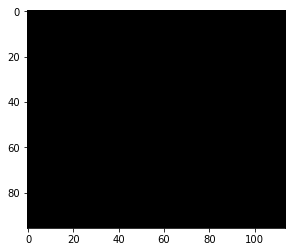

Iteration 1210. Loss -133383.65625


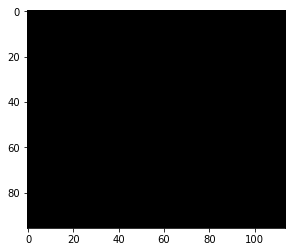

Iteration 1211. Loss -133383.65625


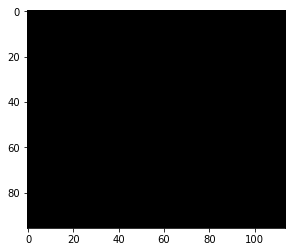

Iteration 1212. Loss -133383.65625


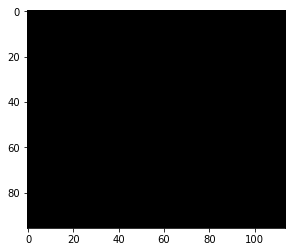

Iteration 1213. Loss -133383.65625


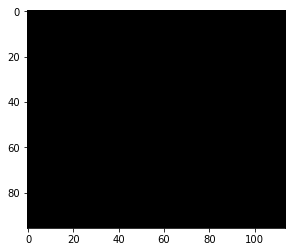

Iteration 1214. Loss -133383.65625


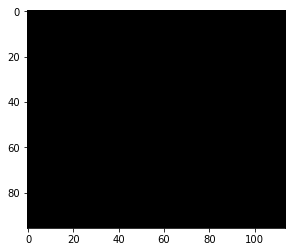

Iteration 1215. Loss -133383.65625


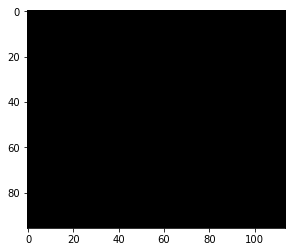

Iteration 1216. Loss -133383.65625


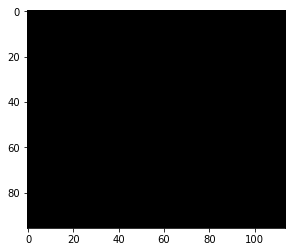

Iteration 1217. Loss -133383.65625


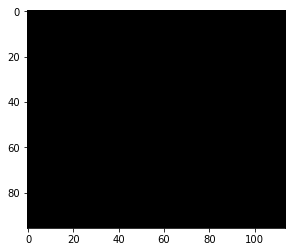

Iteration 1218. Loss -133383.65625


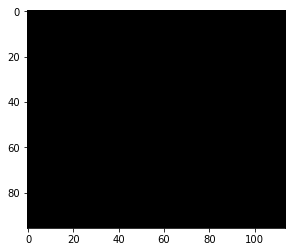

Iteration 1219. Loss -133383.65625


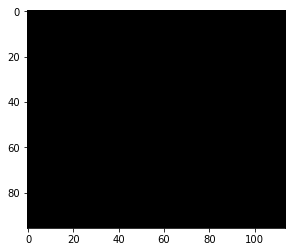

Iteration 1220. Loss -133383.65625


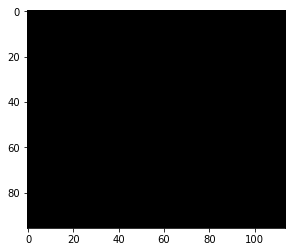

Iteration 1221. Loss -133383.65625


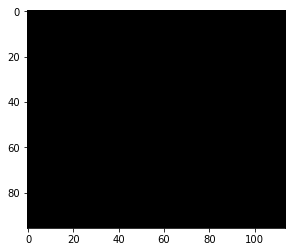

Iteration 1222. Loss -133383.65625


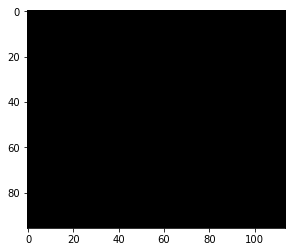

Iteration 1223. Loss -133383.65625


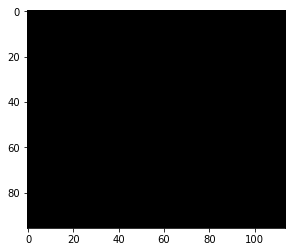

Iteration 1224. Loss -133383.65625


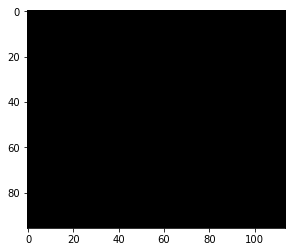

Iteration 1225. Loss -133383.65625


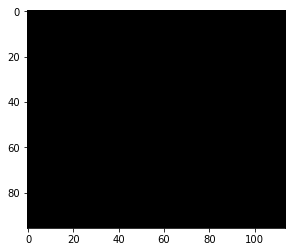

Iteration 1226. Loss -133383.65625


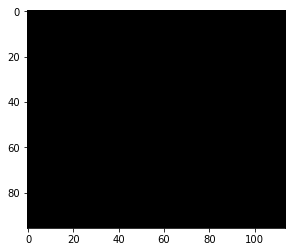

Iteration 1227. Loss -133383.65625


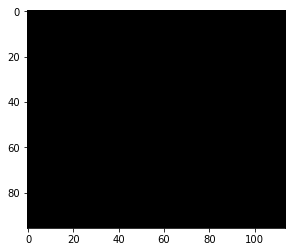

Iteration 1228. Loss -133383.65625


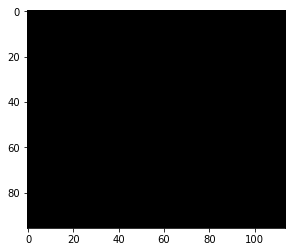

Iteration 1229. Loss -133383.65625


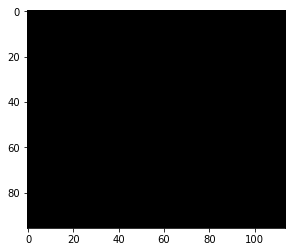

Iteration 1230. Loss -133383.65625


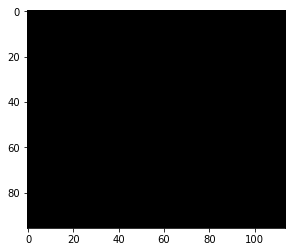

Iteration 1231. Loss -133383.65625


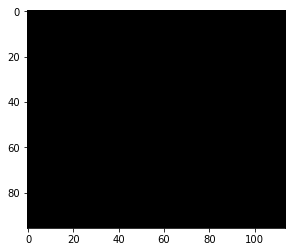

Iteration 1232. Loss -133383.65625


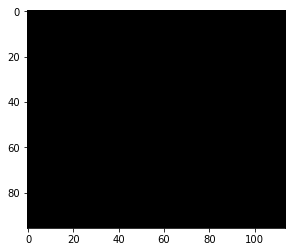

Iteration 1233. Loss -133383.65625


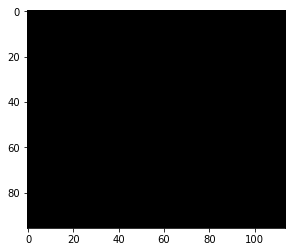

Iteration 1234. Loss -133383.65625


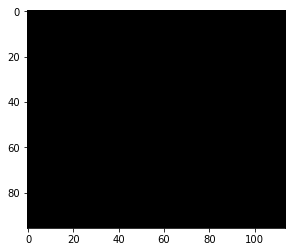

Iteration 1235. Loss -133383.65625


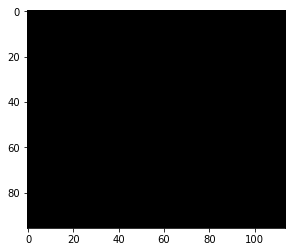

Iteration 1236. Loss -133383.65625


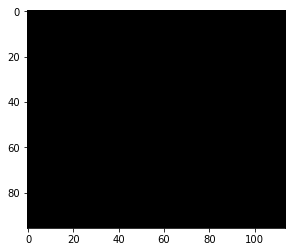

Iteration 1237. Loss -133383.65625


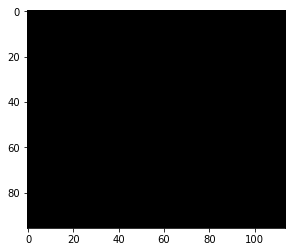

Iteration 1238. Loss -133383.65625


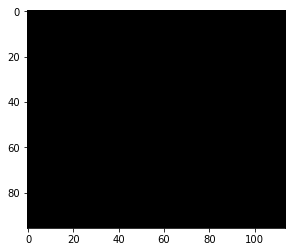

Iteration 1239. Loss -133383.65625


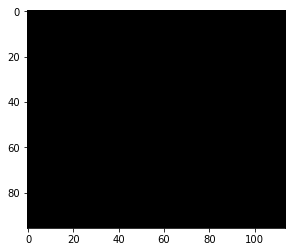

Iteration 1240. Loss -133383.65625


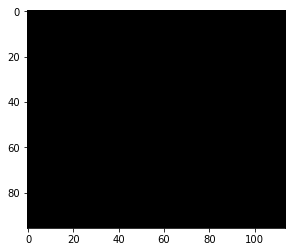

Iteration 1241. Loss -133383.65625


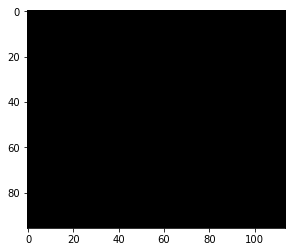

Iteration 1242. Loss -133383.65625


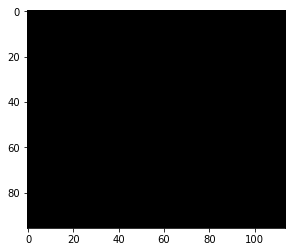

Iteration 1243. Loss -133383.65625


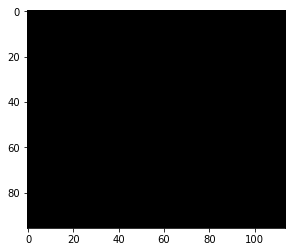

Iteration 1244. Loss -133383.65625


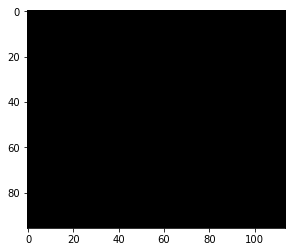

Iteration 1245. Loss -133383.65625


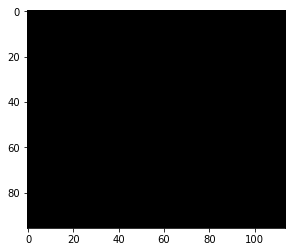

Iteration 1246. Loss -133383.65625


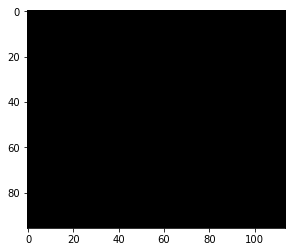

Iteration 1247. Loss -133383.65625


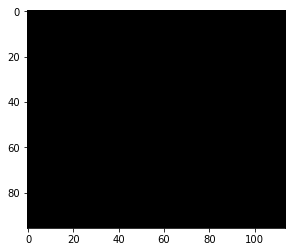

Iteration 1248. Loss -133383.65625


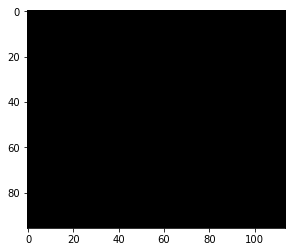

Iteration 1249. Loss -133383.65625


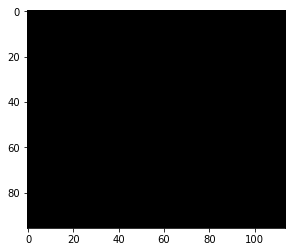

Iteration 1250. Loss -133383.65625


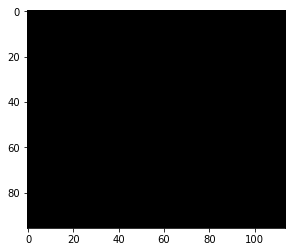

Iteration 1251. Loss -133383.65625


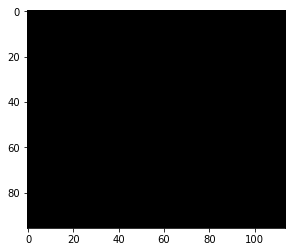

Iteration 1252. Loss -133383.65625


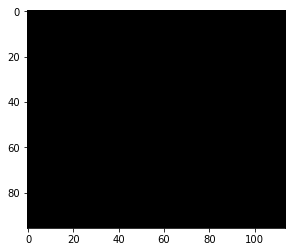

Iteration 1253. Loss -133383.65625


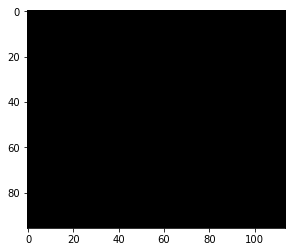

Iteration 1254. Loss -133383.65625


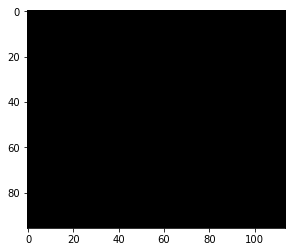

Iteration 1255. Loss -133383.65625


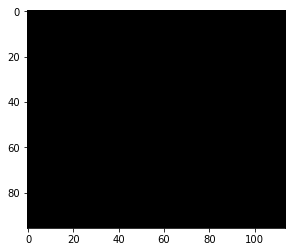

Iteration 1256. Loss -133383.65625


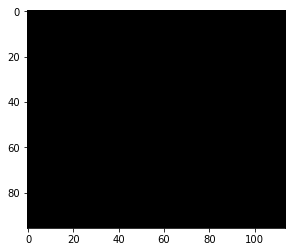

Iteration 1257. Loss -133383.65625


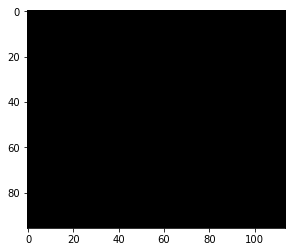

Iteration 1258. Loss -133383.65625


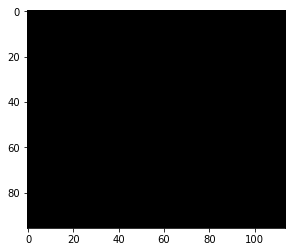

Iteration 1259. Loss -133383.65625


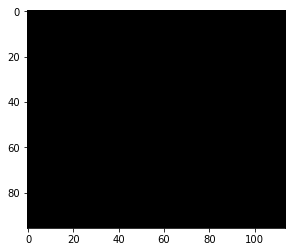

Iteration 1260. Loss -133383.65625


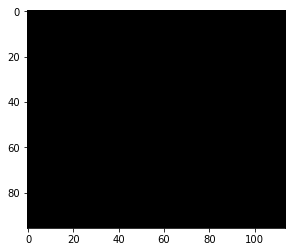

Iteration 1261. Loss -133383.65625


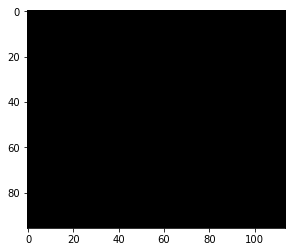

Iteration 1262. Loss -133383.65625


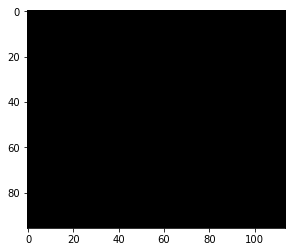

Iteration 1263. Loss -133383.65625


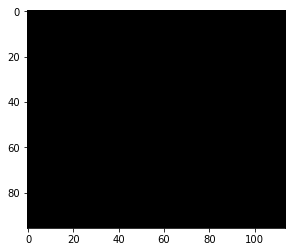

Iteration 1264. Loss -133383.65625


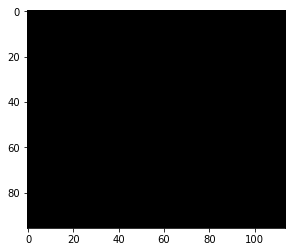

Iteration 1265. Loss -133383.65625


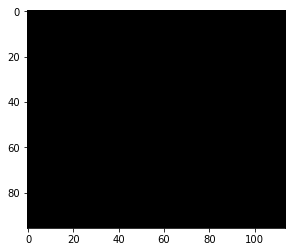

Iteration 1266. Loss -133383.65625


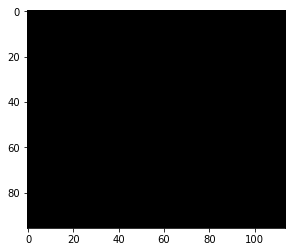

Iteration 1267. Loss -133383.65625


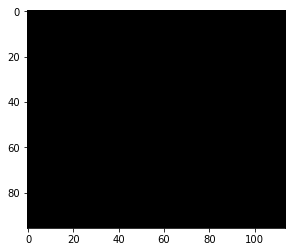

Iteration 1268. Loss -133383.65625


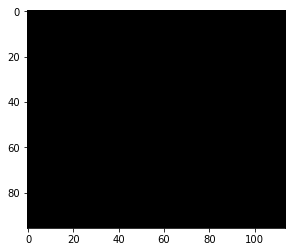

Iteration 1269. Loss -133383.65625


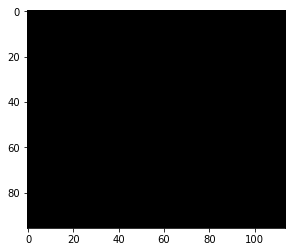

Iteration 1270. Loss -133383.65625


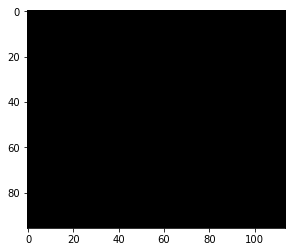

Iteration 1271. Loss -133383.65625


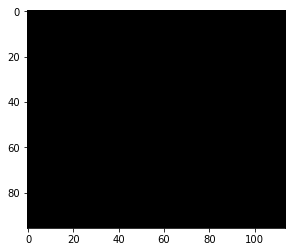

Iteration 1272. Loss -133383.65625


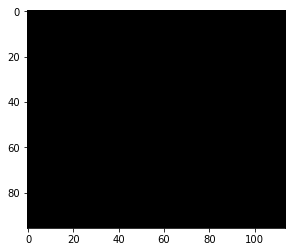

Iteration 1273. Loss -133383.65625


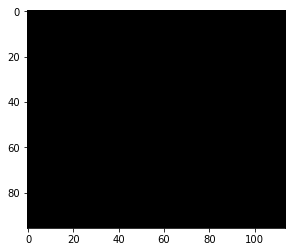

Iteration 1274. Loss -133383.65625


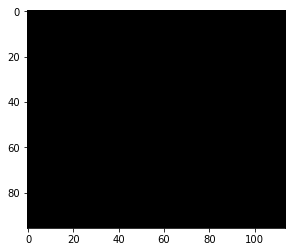

Iteration 1275. Loss -133383.65625


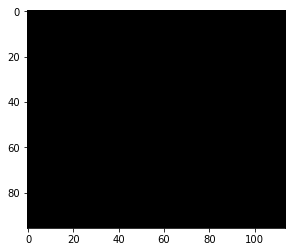

Iteration 1276. Loss -133383.65625


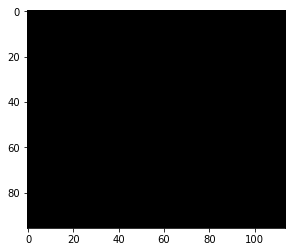

Iteration 1277. Loss -133383.65625


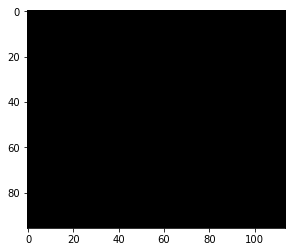

Iteration 1278. Loss -133383.65625


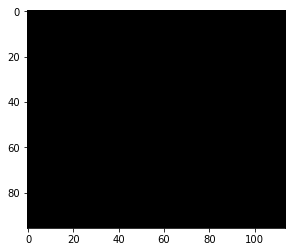

Iteration 1279. Loss -133383.65625


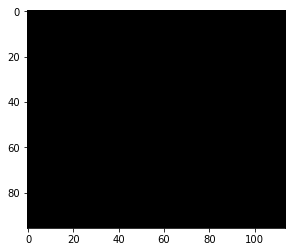

Iteration 1280. Loss -133383.65625


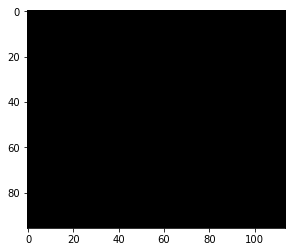

Iteration 1281. Loss -133383.65625


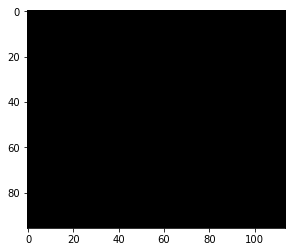

Iteration 1282. Loss -133383.65625


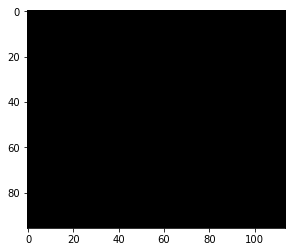

Iteration 1283. Loss -133383.65625


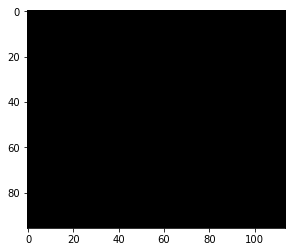

Iteration 1284. Loss -133383.65625


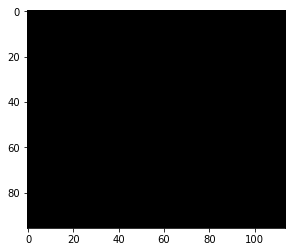

Iteration 1285. Loss -133383.65625


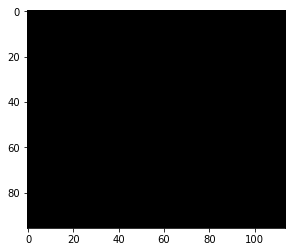

Iteration 1286. Loss -133383.65625


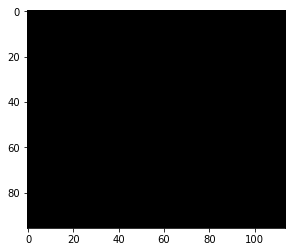

Iteration 1287. Loss -133383.65625


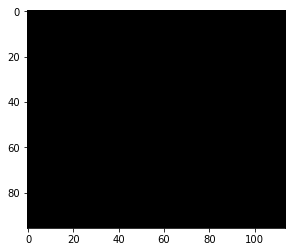

Iteration 1288. Loss -133383.65625


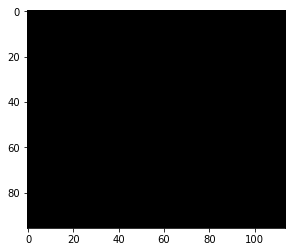

Iteration 1289. Loss -133383.65625


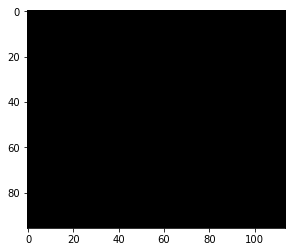

Iteration 1290. Loss -133383.65625


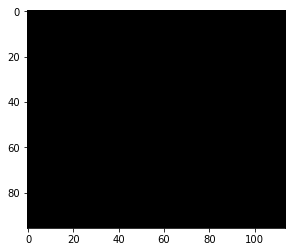

Iteration 1291. Loss -133383.65625


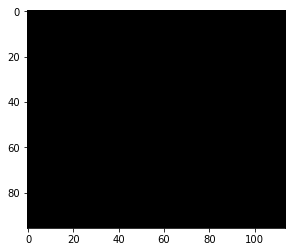

Iteration 1292. Loss -133383.65625


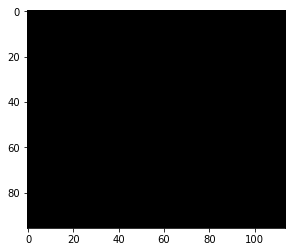

Iteration 1293. Loss -133383.65625


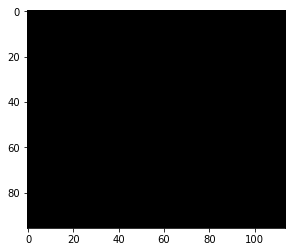

Iteration 1294. Loss -133383.65625


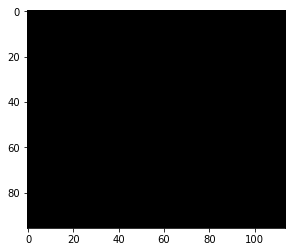

Iteration 1295. Loss -133383.65625


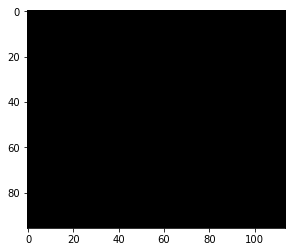

Iteration 1296. Loss -133383.65625


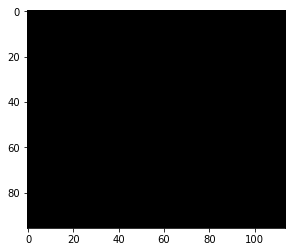

Iteration 1297. Loss -133383.65625


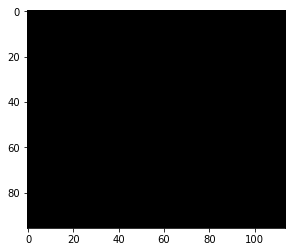

Iteration 1298. Loss -133383.65625


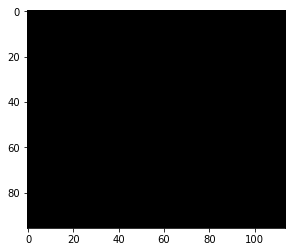

Iteration 1299. Loss -133383.65625


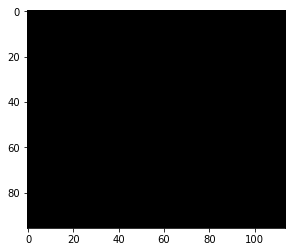

Iteration 1300. Loss -133383.65625


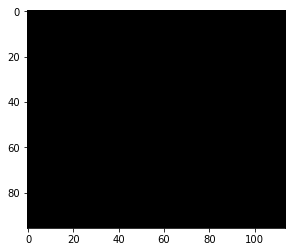

Iteration 1301. Loss -133383.65625


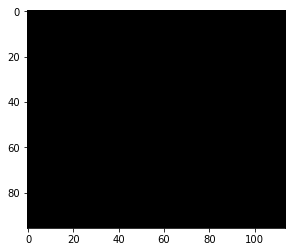

Iteration 1302. Loss -133383.65625


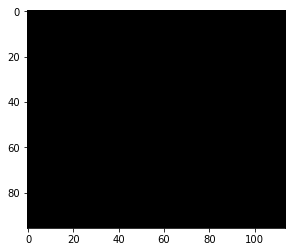

Iteration 1303. Loss -133383.65625


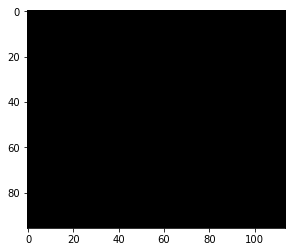

Iteration 1304. Loss -133383.65625


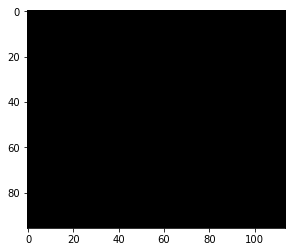

Iteration 1305. Loss -133383.65625


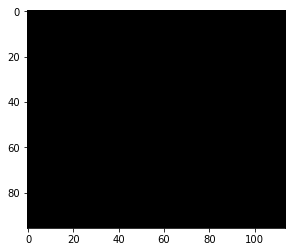

Iteration 1306. Loss -133383.65625


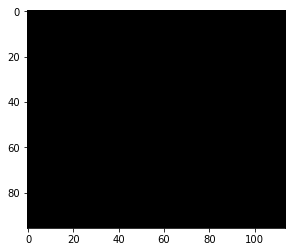

Iteration 1307. Loss -133383.65625


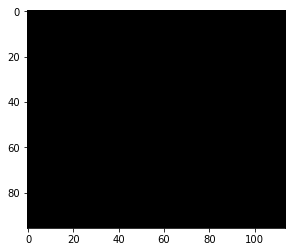

Iteration 1308. Loss -133383.65625


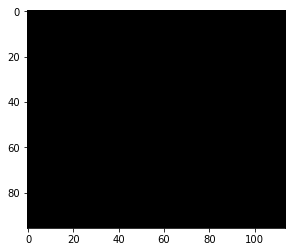

Iteration 1309. Loss -133383.65625


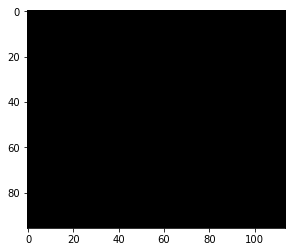

Iteration 1310. Loss -133383.65625


In [ ]:
filter_pos = 1
print("Filter position: {}".format(filter_pos)) 
num_iters = 2000
base = torch.rand((1, 1, 96, 114, 96), requires_grad=True) # input image
optimizer = optim.Adam([base], lr=0.05, weight_decay=0.01)

optimize_activations(sub_model,
                     base,
                     optimizer,
                     filter_pos=filter_pos,
                     num_iters=num_iters,
                     show_x=1,
                     transforms=transf)